# Network embedding

In this notebook we aim to derive a node embedding for the regulatory network of U2OS cells that we derived in our preceeding analyses. To this end, we will train a Graph-convolutional AutoEncoder. To assess the stability of the embeddings we will experiment with different input features, training objectives and initializations and compare the clustering of the inferred latent spaces i.a. to embeddings obtained from a DeepWalk model. On the basis of those analyses we will finally identify a stable node embedding for the genes in the input regulatory network. Those embeddings will span our estimate of the regulatory state in U2OS cells.

---

## 0. Environmental setup

First, we will load all required libraries.

In [39]:
import pandas as pd
import networkx as nx
import numpy as np
import seaborn as sns
import sys
import os
import random
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt
import community as community_louvain
from torch_geometric.data import Data
from torch import LongTensor, FloatTensor
from node2vec import Node2Vec
from torch_geometric.nn import GAE
from torch_geometric.utils import train_test_split_edges, from_networkx
import torch_geometric.transforms as T
from torch_geometric.nn import InnerProductDecoder
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
import scanpy as sc
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.metrics import adjusted_mutual_info_score
from scipy.stats import spearmanr, pearsonr
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from yellowbrick.cluster import KElbowVisualizer

from scipy.spatial.distance import pdist, squareform
import scipy.spatial as sp, scipy.cluster.hierarchy as hc

sys.path.append("../../../../")

from src.utils.torch.network import *
from src.utils.notebooks.ppi.embedding import *
from src.utils.basic.io import get_genesets_from_gmt_file
from src.models.ae import CustomGAE, GCNEncoder

seed = 1234

plt.style.use("default")

%load_ext nb_black

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

In [40]:
def label_point(x, y, val, ax):
    for i in range(len(x)):
        ax.text(x[i] + 0.02, y[i], val[i], {"size": 10})

<IPython.core.display.Javascript object>

---

## 1. Read in data

Next, we will read in the regulatory graph data along side with a scRNA-seq data set and a number of hallmark geneset information. The latter two will be used to define further node features and update the correlation information for the interactions in the graph.

In [41]:
spearman_interactome = nx.read_gpickle(
    "../../../../data/ppi/inference_results/cv/conf_hub_spearman_sol_cv.pkl"
)
print(nx.info(spearman_interactome))

Name: conf_hub_spearman_sol
Type: Graph
Number of nodes: 244
Number of edges: 521
Average degree:   4.2705


<IPython.core.display.Javascript object>

In [42]:
gex_adata = sc.read("../../../../data/gex/scrnaseq/fucci_adata.h5")
gex_adata.var_names_make_unique()
gex_data = pd.DataFrame(
    gex_adata.X, columns=gex_adata.var_names, index=gex_adata.obs_names
)
gex_data.columns = [c.upper() for c in gex_data.columns]
gex_data = gex_data.loc[
    :, set(spearman_interactome.nodes()).intersection(gex_data.columns)
]

<IPython.core.display.Javascript object>

In addition to the 50 Hallmark gene sets, we also load the gene sets corresponding to pathways involved in mechanotransduction: cell cycle control, regulation of chromatin organization and actin cytoskeleton, DNA damage repair, cell death and transcription factors.

In [43]:
cc_genes = set(
    pd.read_csv("../../../../data/other/reactome_cell_cycle.txt", index_col=0).index
)
co_genes = set(
    pd.read_csv("../../../../data/other/reactome_chrom_org.txt", index_col=0).index
)
dr_genes = set(
    pd.read_csv("../../../../data/other/reactome_dna_repair.txt", index_col=0).index
)
cd_genes = set(
    pd.read_csv("../../../../data/other/reactome_cell_death.txt", index_col=0).index
)
cr_genes = set(
    pd.read_csv(
        "../../../../data/other/kegg_reg_act_cytoskeleton.txt", index_col=0
    ).index
)
tfs = set(pd.read_csv("../../../../data/other/human_tf_list.txt", index_col=0).index)

spec_results = pd.read_csv(
    "../../../../data/other/specificity_screen_results_cv.csv", index_col=0
)
spec_results = spec_results.loc[spec_results["selected"]]
spec_orf_targets = set(spec_results.index)
hallmark_geneset_dict = get_genesets_from_gmt_file(
    "../../../../data/other/h.all.v7.4.symbols.gmt"
)

<IPython.core.display.Javascript object>

---
---

## 2. Preprocessing

We will now set the respective node and edge attributes computed based on the previously loaded information. Note, that the single-cell gene expression data is min-max-scaled.

### 2.1. Attribute setting

In [44]:
gex_data_z = pd.DataFrame(
    MinMaxScaler().fit_transform(gex_data.transpose()),
    index=gex_data.transpose().index,
    columns=gex_data.transpose().columns,
).transpose()

<IPython.core.display.Javascript object>

In [45]:
for node in spearman_interactome.nodes(data=True):
    node[-1]["sc_gex"] = np.array(gex_data_z.loc[:, node[0]])
    node[-1]["sc_gex"] = node[-1]["sc_gex"]
    node[-1]["name"] = node[0]
    node[-1]["cell_cycle"] = node[0] in cc_genes
    node[-1]["chromatin_org"] = node[0] in co_genes
    node[-1]["dna_repair"] = node[0] in dr_genes
    node[-1]["cytoskeleton_org"] = node[0] in cr_genes
    node[-1]["cell_death"] = node[0] in cd_genes
    node[-1]["tf"] = node[0] in tfs
    node[-1]["spec_target"] = node[0] in spec_orf_targets

    gene_memberships = []
    for geneset in hallmark_geneset_dict.values():
        if node[0] in geneset:
            gene_memberships.append(1.0)
        else:
            gene_memberships.append(0.0)

    node[-1]["hallmark"] = np.array(gene_memberships)
    node[-1]["sc_gex_hallmark"] = np.concatenate(
        [node[-1]["sc_gex"], node[-1]["hallmark"]]
    )

for edge in spearman_interactome.edges(data=True):
    edge[-1]["spearmanr"] = spearmanr(
        gex_data.loc[:, edge[0]], gex_data.loc[:, edge[1]]
    )[0]
    edge[-1]["pearsonr"] = pearsonr(gex_data.loc[:, edge[0]], gex_data.loc[:, edge[1]])[
        0
    ]

<IPython.core.display.Javascript object>

---

### 2.2 Data preparation

Next, we transform the graph into a data object complient with the used pytorch_geometric framework to learn the graph embeddings.

In [46]:
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")

graph_data = from_networkx(spearman_interactome)
graph_data.id = torch.FloatTensor(np.identity(len(spearman_interactome)))
graph_data = T.ToDevice(
    device,
    attrs=[
        "id",
        "sc_gex",
        "pbulk_gex",
        "hallmark",
        "sc_gex_hallmark",
        "pbulk_gex_hallmark",
    ],
)(graph_data)

<IPython.core.display.Javascript object>

In [47]:
for i in range(len(hallmark_geneset_dict)):
    print(
        i,
        list(hallmark_geneset_dict.keys())[i],
        graph_data.hallmark.sum(axis=0)[i].item(),
    )

0 HALLMARK_TNFA_SIGNALING_VIA_NFKB 9.0
1 HALLMARK_HYPOXIA 10.0
2 HALLMARK_CHOLESTEROL_HOMEOSTASIS 2.0
3 HALLMARK_MITOTIC_SPINDLE 22.0
4 HALLMARK_WNT_BETA_CATENIN_SIGNALING 5.0
5 HALLMARK_TGF_BETA_SIGNALING 8.0
6 HALLMARK_IL6_JAK_STAT3_SIGNALING 3.0
7 HALLMARK_DNA_REPAIR 3.0
8 HALLMARK_G2M_CHECKPOINT 36.0
9 HALLMARK_APOPTOSIS 17.0
10 HALLMARK_NOTCH_SIGNALING 2.0
11 HALLMARK_ADIPOGENESIS 1.0
12 HALLMARK_ESTROGEN_RESPONSE_EARLY 14.0
13 HALLMARK_ESTROGEN_RESPONSE_LATE 9.0
14 HALLMARK_ANDROGEN_RESPONSE 3.0
15 HALLMARK_MYOGENESIS 18.0
16 HALLMARK_PROTEIN_SECRETION 1.0
17 HALLMARK_INTERFERON_ALPHA_RESPONSE 2.0
18 HALLMARK_INTERFERON_GAMMA_RESPONSE 5.0
19 HALLMARK_APICAL_JUNCTION 10.0
20 HALLMARK_APICAL_SURFACE 2.0
21 HALLMARK_HEDGEHOG_SIGNALING 6.0
22 HALLMARK_COMPLEMENT 9.0
23 HALLMARK_UNFOLDED_PROTEIN_RESPONSE 2.0
24 HALLMARK_PI3K_AKT_MTOR_SIGNALING 17.0
25 HALLMARK_MTORC1_SIGNALING 12.0
26 HALLMARK_E2F_TARGETS 33.0
27 HALLMARK_MYC_TARGETS_V1 12.0
28 HALLMARK_MYC_TARGETS_V2 4.0
29 HALLMARK_

<IPython.core.display.Javascript object>

We will additionally construct 3 subnetworks of the interactome, where we randomly mask out certain nodes for validation and testing. Node that the given network will always include all nodes in the training set as we can perform inference using those even when validating or testing the model.

In [50]:
train_network, val_network, test_network = network_train_val_test_split(
    spearman_interactome, train_val_test_size=[0.7, 0.1, 0.2], random_state=2345
)
print(nx.info(train_network))
print(nx.info(val_network))
print(nx.info(test_network))

Name: train_network
Type: Graph
Number of nodes: 170
Number of edges: 246
Average degree:   2.8941
Name: val_network
Type: Graph
Number of nodes: 195
Number of edges: 336
Average degree:   3.4462
Name: test_network
Type: Graph
Number of nodes: 244
Number of edges: 521
Average degree:   4.2705


<IPython.core.display.Javascript object>

In [51]:
train_data = from_networkx(train_network)
train_data = add_pos_negative_edge_indices(train_data, add_pos_edges=True)
train_data.id = np.zeros([len(train_network), len(spearman_interactome)])
train_data.id[: train_data.num_nodes, : train_data.num_nodes] = np.identity(
    train_data.num_nodes
)
train_data.id = torch.FloatTensor(train_data.id)
train_data = T.ToDevice(
    device,
    attrs=[
        "id",
        "sc_gex",
        "pbulk_gex",
        "hallmark",
        "sc_gex_hallmark",
        "pbulk_gex_hallmark",
    ],
)(train_data)

<IPython.core.display.Javascript object>

In [52]:
val_data = from_networkx(val_network)
val_data = add_pos_negative_edge_indices(val_data)
val_data.id = np.zeros([len(val_network), len(spearman_interactome)])
val_data.id[: val_data.num_nodes, : val_data.num_nodes] = np.identity(
    val_data.num_nodes
)
val_data.id = torch.FloatTensor(val_data.id)
val_data = T.ToDevice(
    device,
    attrs=[
        "id",
        "sc_gex",
        "pbulk_gex",
        "hallmark",
        "sc_gex_hallmark",
        "pbulk_gex_hallmark",
    ],
)(val_data)

<IPython.core.display.Javascript object>

In [53]:
test_data = from_networkx(test_network)
test_data = add_pos_negative_edge_indices(test_data)
test_data.id = torch.FloatTensor(np.identity(test_data.num_nodes))
test_data = T.ToDevice(
    device,
    attrs=[
        "id",
        "sc_gex",
        "pbulk_gex",
        "hallmark",
        "sc_gex_hallmark",
        "pbulk_gex_hallmark",
    ],
)(test_data)

<IPython.core.display.Javascript object>

In [54]:
data_dict = {
    "train": train_data,
    "val": val_data,
    "test": test_data,
}

<IPython.core.display.Javascript object>

---
---

## 3. Node embeddings


After having finally prepared the data, we can now start inferring node embeddings from the data. For each model type, we will vary the initialization 5 times using different random seeds. In a first step, we will assess the similarity between the inferred latent spaces by pairwise comparing the hierarchical co-clustering of the inferred spaces pairwise using the adjusted mutual information.
In the second step, we will assess the individual inferred latent spaces for a fixed random initialization and compare the similarity of the inferred embeddings between the different model setups in a similar fashion.

---

### 3.1. Assessing the stability of the inferred latent spaces

#### 3.1.1. Node2Vec

We will first start with a simple baseline model that is purely based on the network topology and embeds the nodes via encoding neighborhood simularity using random walks on the graph. The model requires a number of hyperparameters, which we initially keep constant for the stability assessment. Note that this model does not allow for the embedding or unseen nodes and thus we need to train it on the whole graph.

In [21]:
seeds = [1234, 2345, 3456, 4567]
latent_dims = [32, 64, 128]

<IPython.core.display.Javascript object>

100%|██████████| 100/100 [00:49<00:00,  2.04it/s]

Final loss: 0.9382940608947004


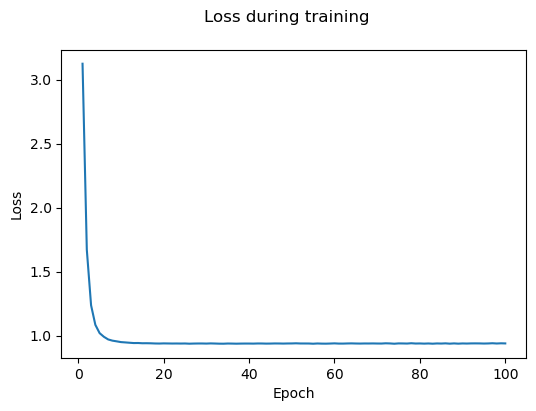

100%|██████████| 100/100 [00:50<00:00,  2.00it/s]

Final loss: 0.9377394914627075


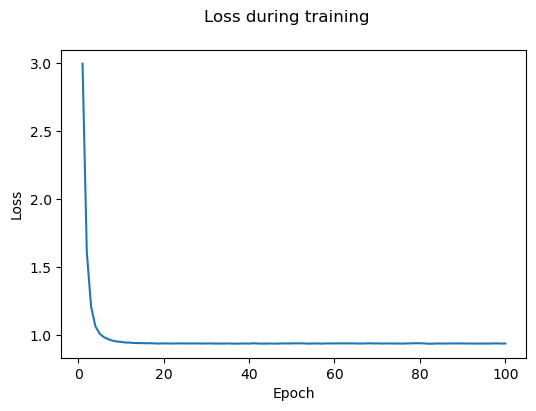

100%|██████████| 100/100 [00:49<00:00,  2.00it/s]

Final loss: 0.9370698156904002


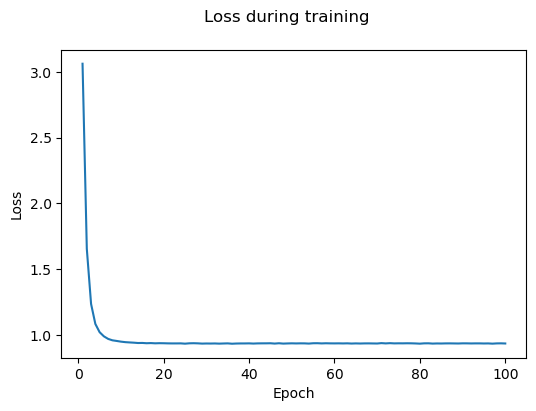

100%|██████████| 100/100 [00:49<00:00,  2.01it/s]

Final loss: 0.9377651615220992


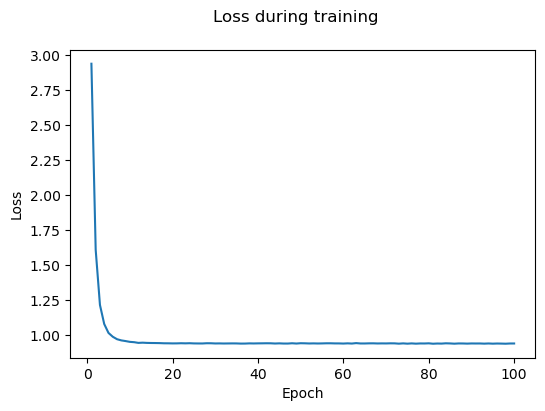

100%|██████████| 4/4 [00:02<00:00,  1.61it/s]


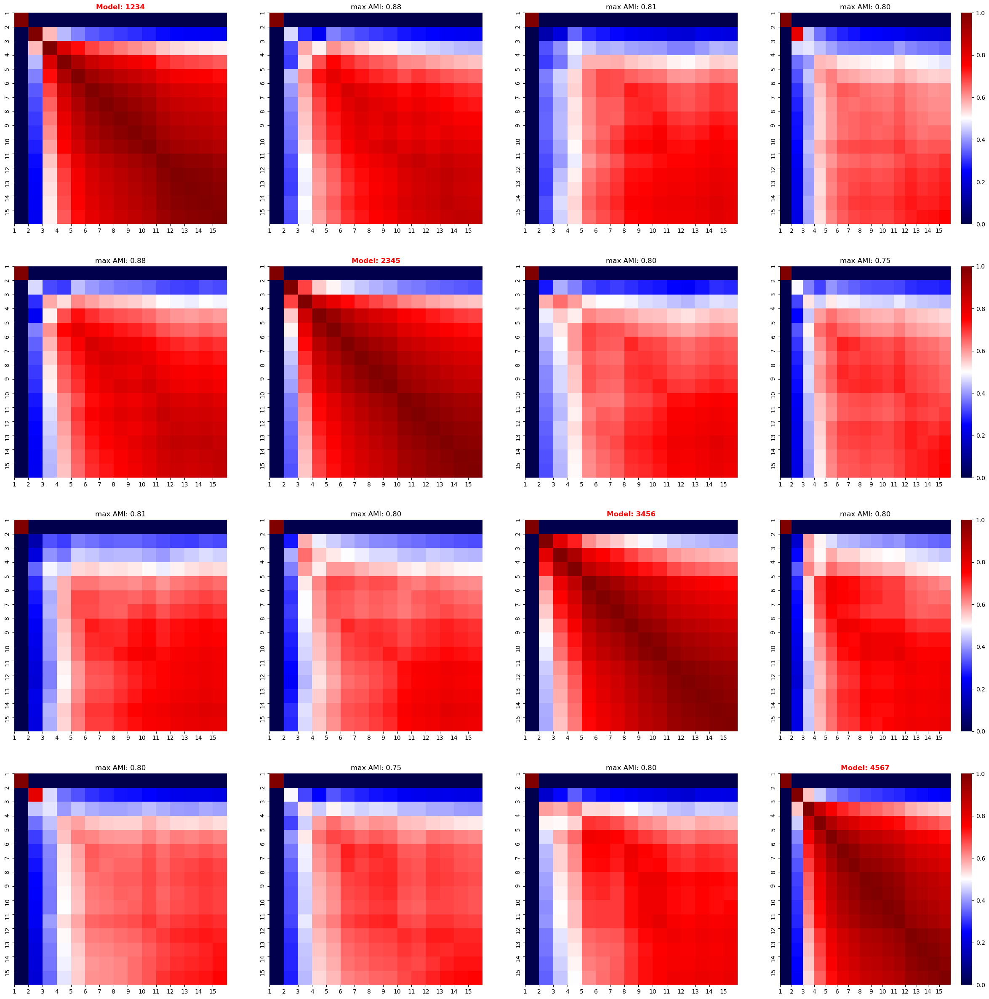

100%|██████████| 4/4 [00:02<00:00,  1.58it/s]


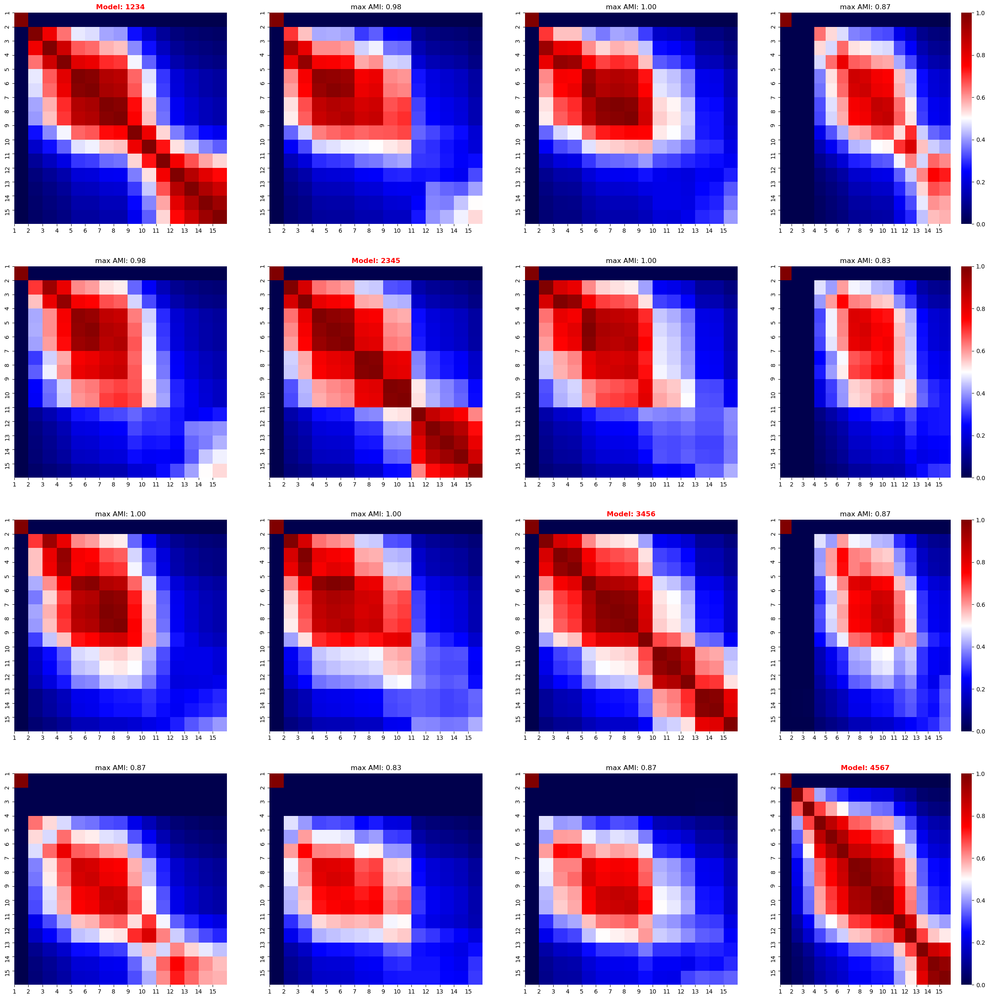

100%|██████████| 100/100 [00:51<00:00,  1.96it/s]

Final loss: 0.934828239386199


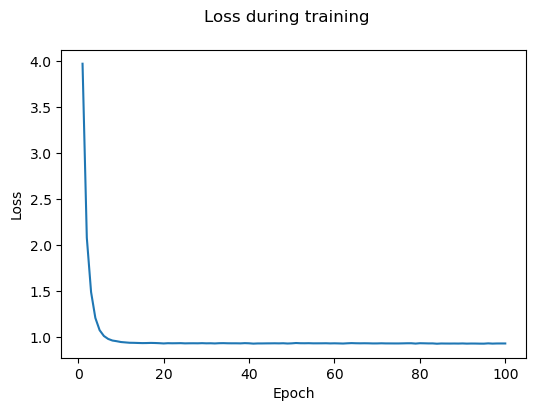

100%|██████████| 100/100 [00:51<00:00,  1.95it/s]

Final loss: 0.93711392605891


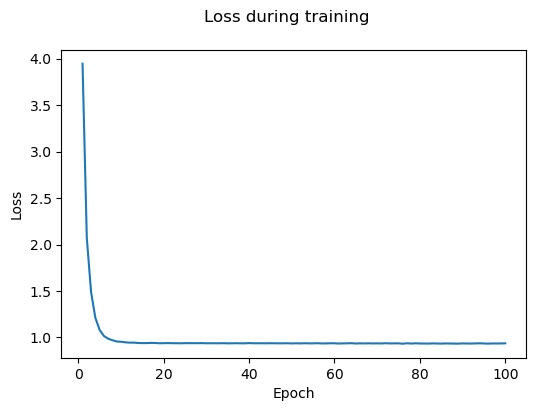

100%|██████████| 100/100 [00:50<00:00,  1.97it/s]

Final loss: 0.9408351261107648


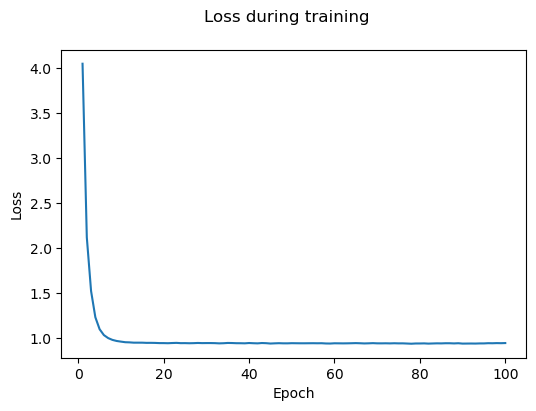

100%|██████████| 100/100 [00:51<00:00,  1.94it/s]


Final loss: 0.9370888227322063


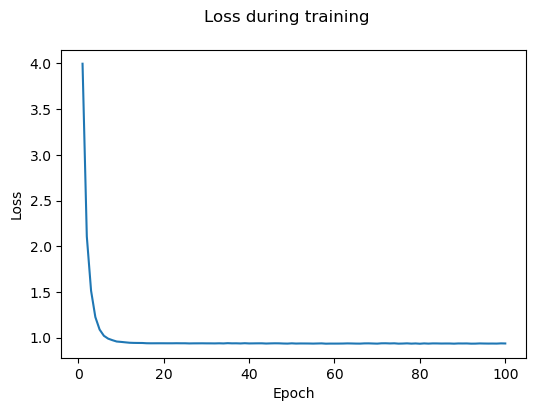

100%|██████████| 4/4 [00:02<00:00,  1.36it/s]


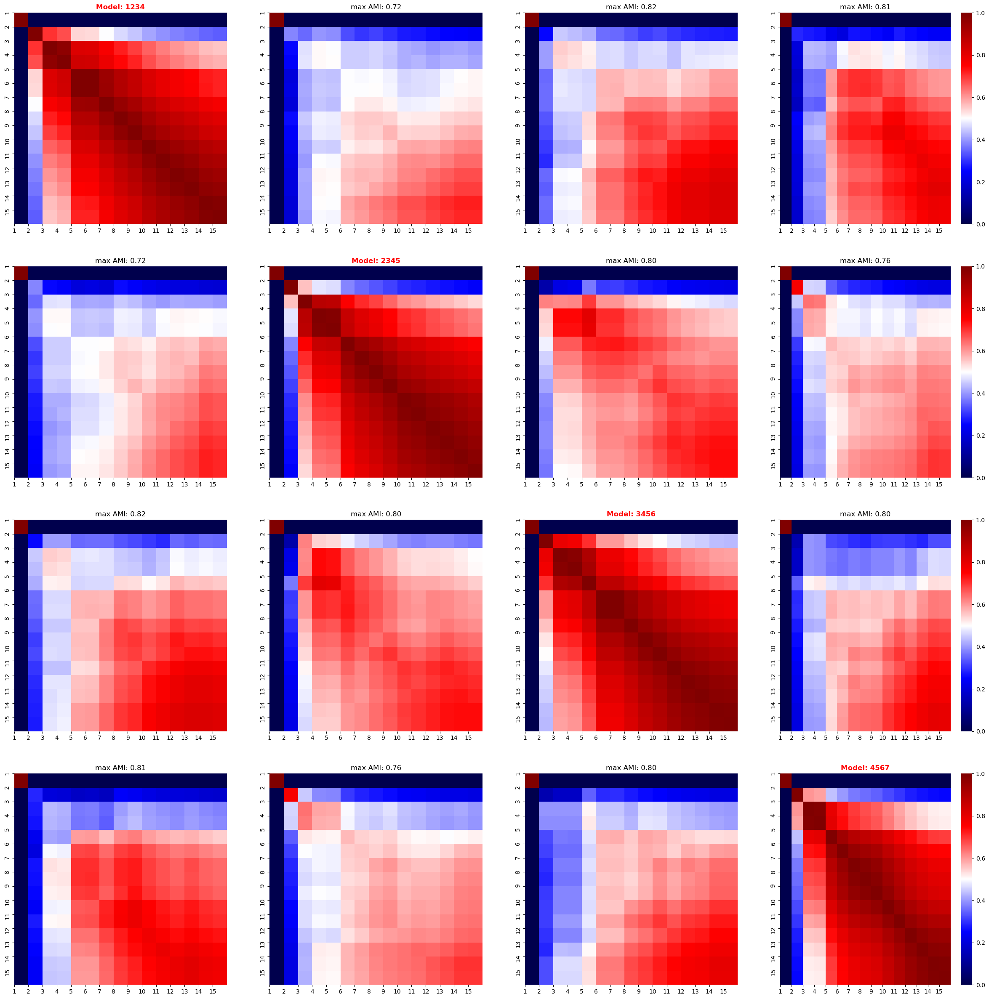

100%|██████████| 4/4 [00:02<00:00,  1.42it/s]


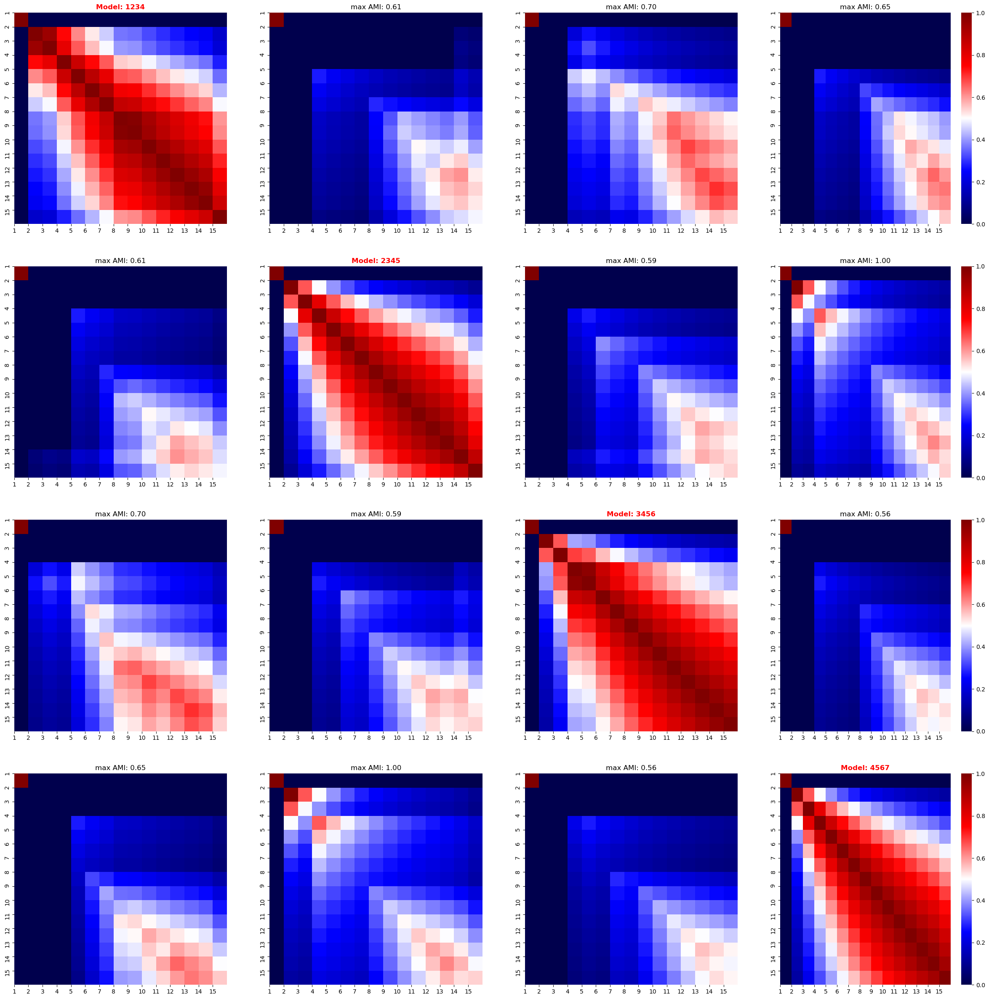

100%|██████████| 100/100 [00:50<00:00,  1.98it/s]

Final loss: 1.0351149029419071


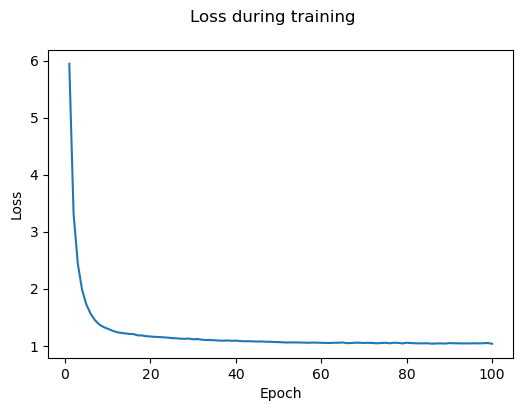

 27%|██▋       | 27/100 [00:13<00:37,  1.94it/s]
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3441, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-11-337b82591787>", line 2, in <module>
    latents_dict_n2v = get_n2v_latents_for_seed(
  File "/home/paysan_d/PycharmProjects/image2reg/notebooks/ppi/embeddings/../../../src/utils/notebooks/ppi/embedding.py", line 178, in get_n2v_latents_for_seed
    fitted_n2v_model, loss_hist = train_n2v_model(
  File "/home/paysan_d/PycharmProjects/image2reg/notebooks/ppi/embeddings/../../../src/utils/torch/network.py", line 28, in train_n2v_model
    loss = process_single_epoch_n2v(model=model, optimizer=optimizer, loader=loader)
  File "/home/paysan_d/PycharmProjects/image2reg/notebooks/ppi/embeddings/../../../src/utils/torch/network.py", line 15, in process_single_epoch_n2v
    for pos_rw, neg_rw in loader:
  File "/home/paysan_d/miniconda3/envs/image2r

TypeError: object of type 'NoneType' has no len()

<IPython.core.display.Javascript object>

In [11]:
for latent_dim in latent_dims:
    latents_dict_n2v = get_n2v_latents_for_seed(
        graph_data,
        seeds,
        latent_dim=latent_dim,
        walk_length=50,
        context_size=5,
        walks_per_node=20,
        batch_size=4,
        num_workers=4,
        lr=0.01,
        n_epochs=100,
        plot_loss=True,
    )
    stability_amis_n2v = stability_cocluster_screen(
        latents_dict_n2v, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_n2v)
    stability_amis_n2v = stability_cocluster_screen(
        latents_dict_n2v, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_n2v)

---

#### 3.1.2. GAE

After having assess the stability of the Node2Vec embeddings we will now run a similar analyses using a GAE model. In contrast to the N2V model, the GAE can also embed unseen nodes. We will aim to infer a model that performs well on that task, which is why we will evaluate all models on such a task. We hold out 5% of the nodes of the network for validation and 10% for testing when training the model.

##### Topology-GAE

The first model does not uses any meaningful input features but is simply the identity matrix. Thus, the network should mostly focus on the graph structure. We will train the model on the task of reconstructing the adjacency matrix. Note that we do not split the data but simply aim to find a low-dimensional embedding that encodes the adjacency matrix.

 73%|███████▎  | 734/1000 [00:07<00:02, 98.15it/s] 

Training stopped after 735 epochs
Best model found at epoch 533
------------------------------------------------------------
TRAIN loss: 1.0448508262634277
VAL loss: 1.2786431312561035
TEST loss: 1.3361741304397583


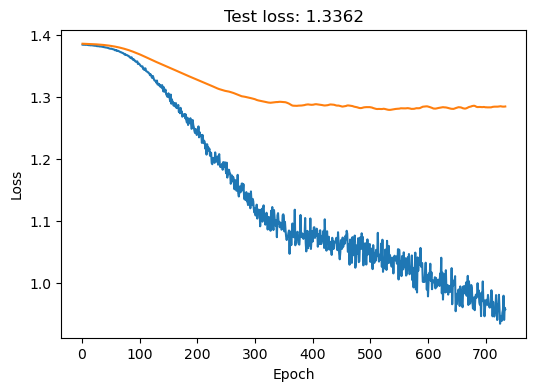

100%|██████████| 1000/1000 [00:10<00:00, 93.33it/s]


------------------------------------------------------------
TRAIN loss: 0.950587272644043
VAL loss: 1.262709140777588
TEST loss: 1.3332021236419678


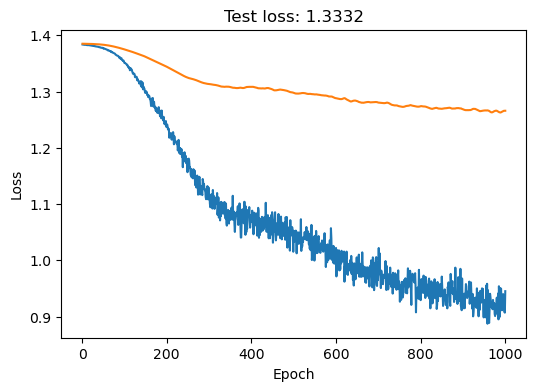

100%|██████████| 1000/1000 [00:10<00:00, 95.24it/s]


------------------------------------------------------------
TRAIN loss: 0.9080021381378174
VAL loss: 1.230608582496643
TEST loss: 1.336891770362854


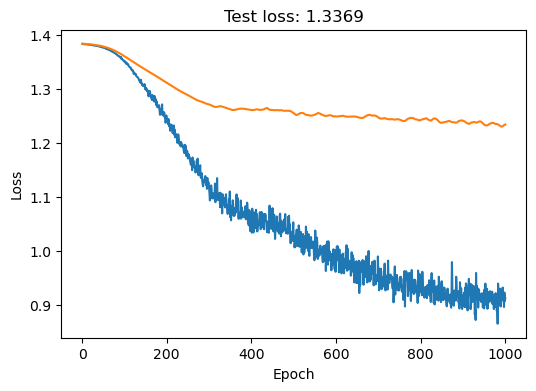

100%|██████████| 1000/1000 [00:10<00:00, 99.97it/s]

------------------------------------------------------------
TRAIN loss: 0.9420109987258911
VAL loss: 1.2514170408248901
TEST loss: 1.3290789127349854


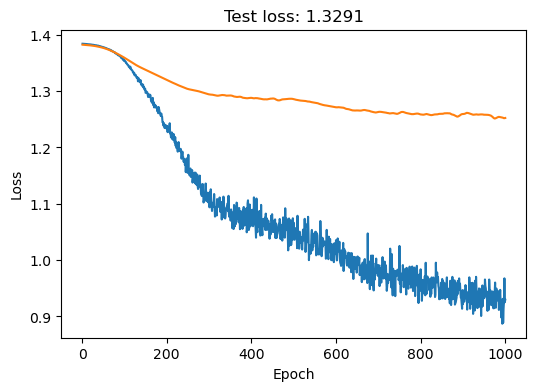

100%|██████████| 4/4 [00:02<00:00,  1.64it/s]


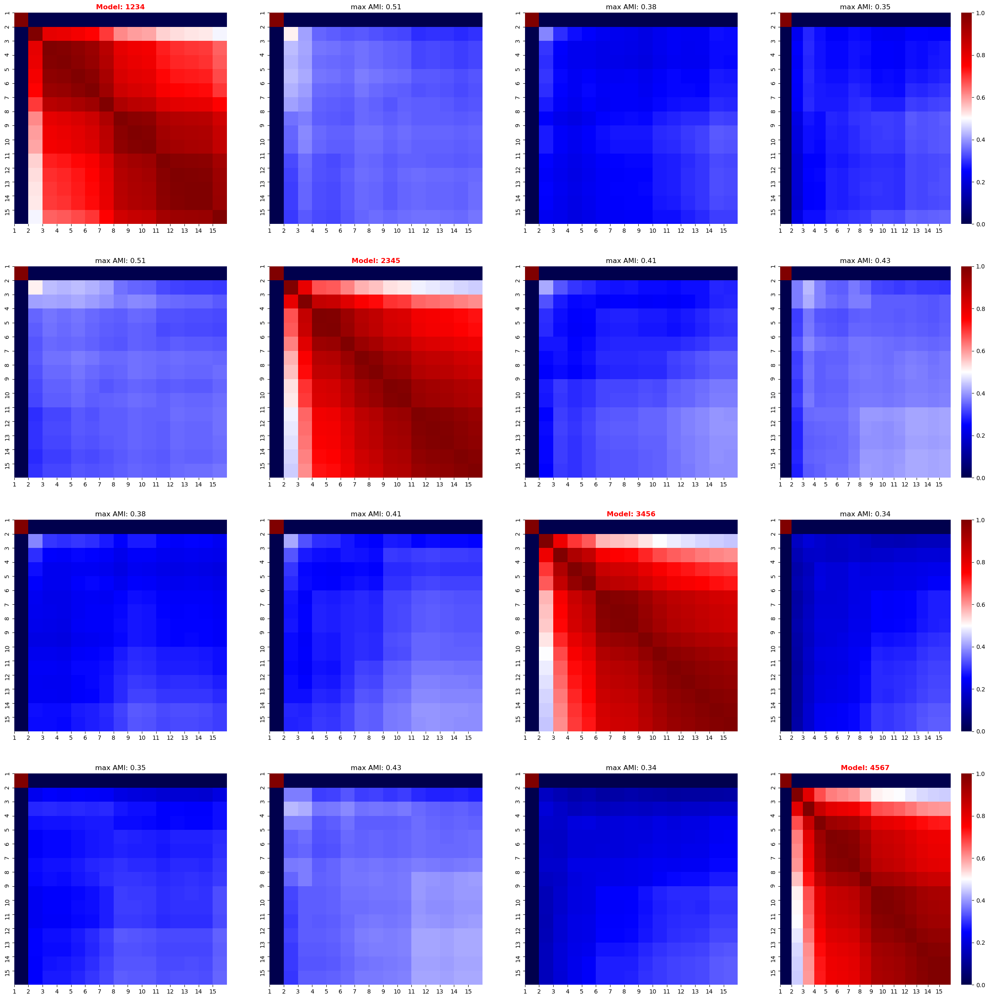

100%|██████████| 4/4 [00:02<00:00,  1.71it/s]


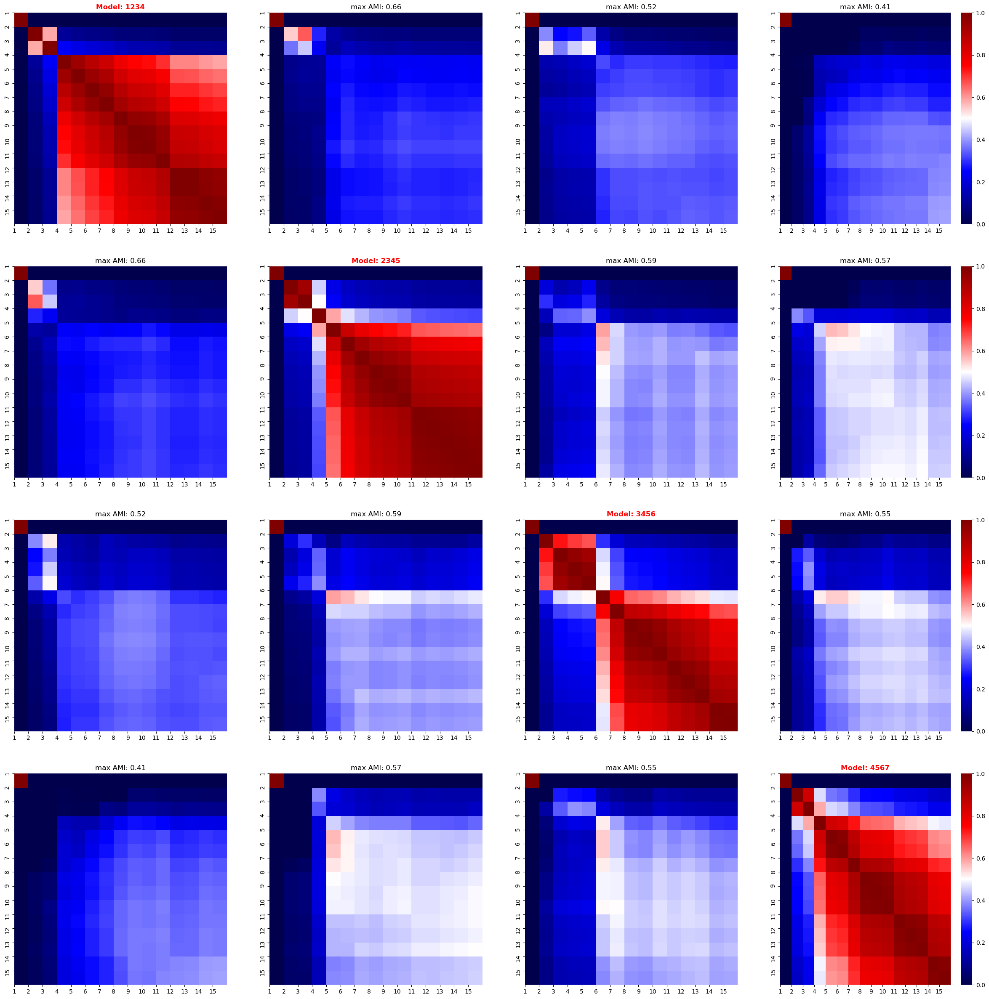

100%|██████████| 1000/1000 [00:10<00:00, 95.37it/s]


------------------------------------------------------------
TRAIN loss: 0.9061295986175537
VAL loss: 1.2492015361785889
TEST loss: 1.3418192863464355


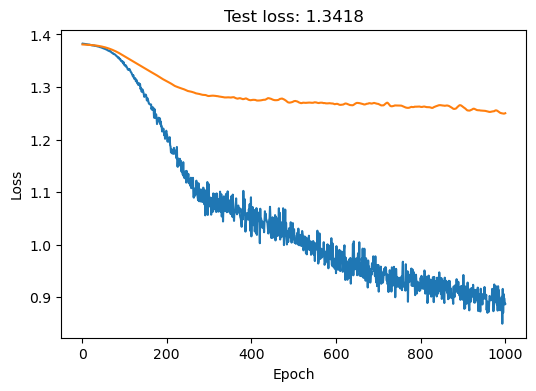

100%|██████████| 1000/1000 [00:10<00:00, 98.95it/s] 


------------------------------------------------------------
TRAIN loss: 0.9069051742553711
VAL loss: 1.254892349243164
TEST loss: 1.3012604713439941


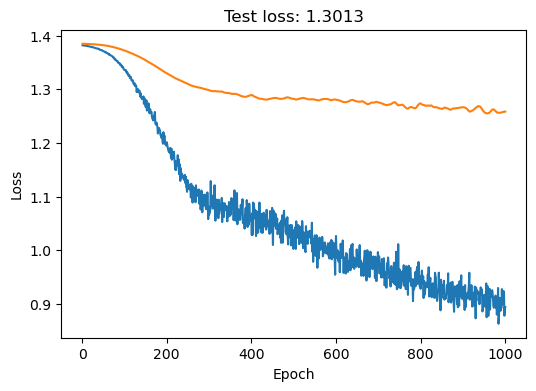

 49%|████▉     | 488/1000 [00:04<00:05, 98.07it/s] 


Training stopped after 489 epochs
Best model found at epoch 287
------------------------------------------------------------
TRAIN loss: 1.096071720123291
VAL loss: 1.2932523488998413
TEST loss: 1.343753457069397


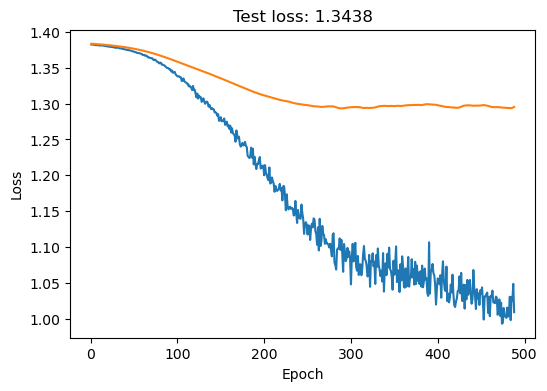

100%|██████████| 1000/1000 [00:11<00:00, 88.07it/s]


------------------------------------------------------------
TRAIN loss: 0.90022873878479
VAL loss: 1.2670142650604248
TEST loss: 1.3177196979522705


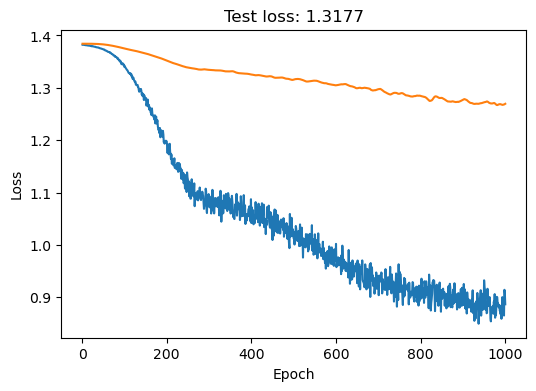

100%|██████████| 4/4 [00:02<00:00,  1.47it/s]


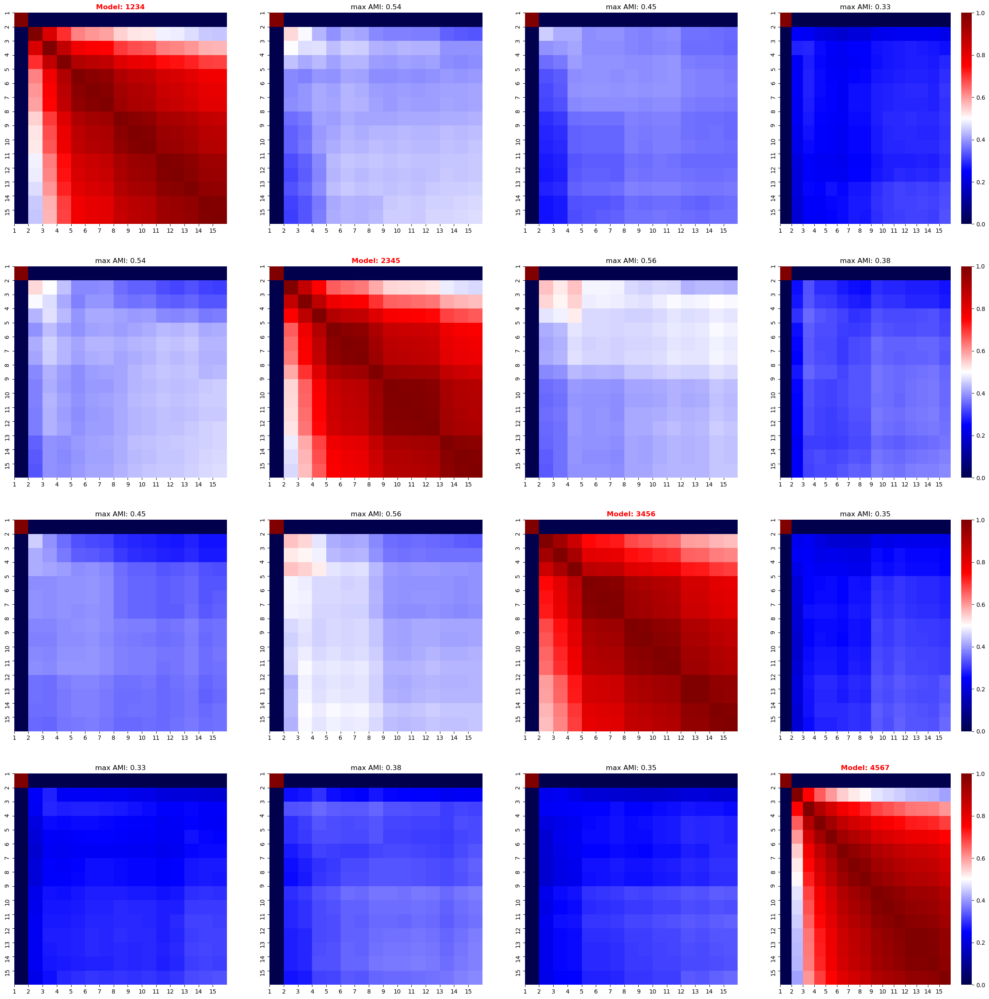

100%|██████████| 4/4 [00:02<00:00,  1.48it/s]


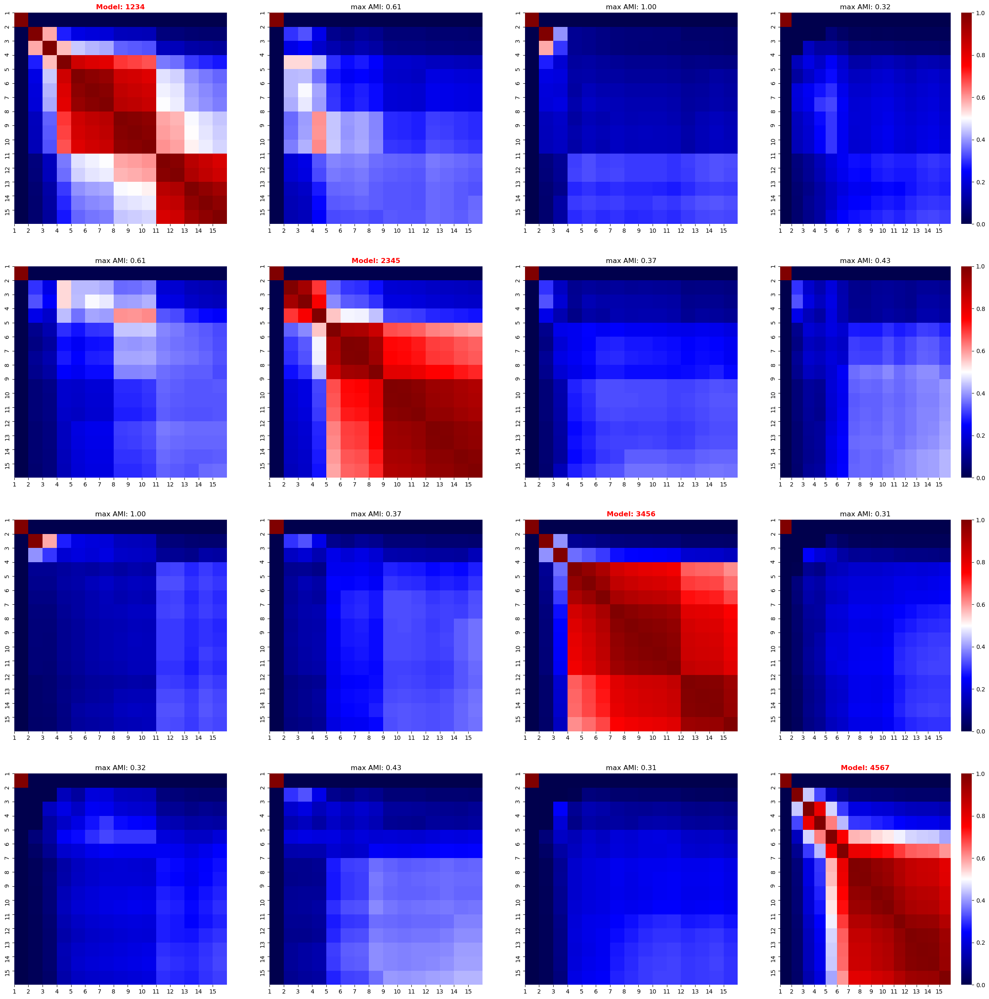

100%|██████████| 1000/1000 [00:10<00:00, 94.31it/s]

------------------------------------------------------------
TRAIN loss: 0.8731555342674255
VAL loss: 1.2202129364013672
TEST loss: 1.290498971939087


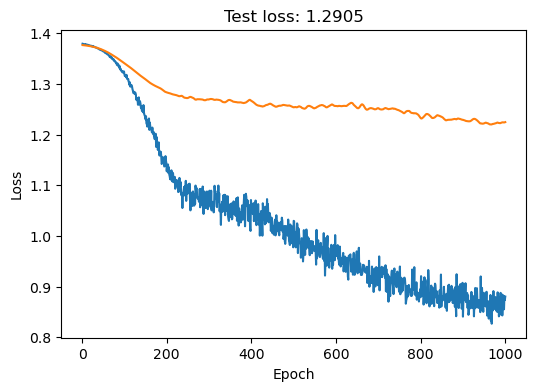

100%|██████████| 1000/1000 [00:10<00:00, 92.77it/s]


------------------------------------------------------------
TRAIN loss: 0.8731726408004761
VAL loss: 1.237231731414795
TEST loss: 1.297753095626831


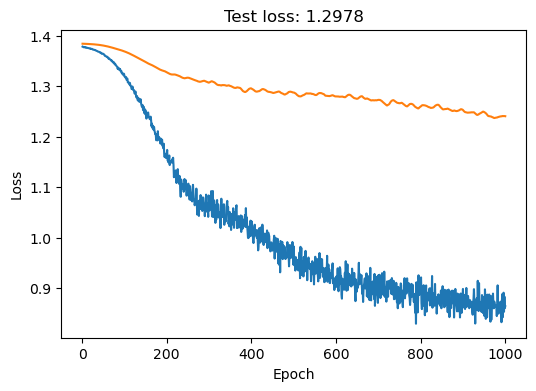

100%|██████████| 1000/1000 [00:10<00:00, 98.17it/s]

------------------------------------------------------------
TRAIN loss: 0.8520027995109558
VAL loss: 1.1934560537338257
TEST loss: 1.336376667022705


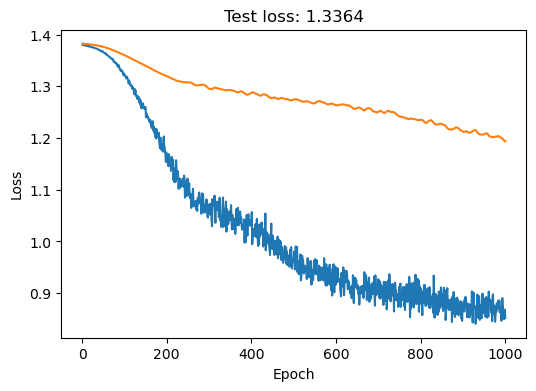

100%|██████████| 1000/1000 [00:10<00:00, 93.71it/s]


------------------------------------------------------------
TRAIN loss: 0.88962721824646
VAL loss: 1.234994649887085
TEST loss: 1.3486666679382324


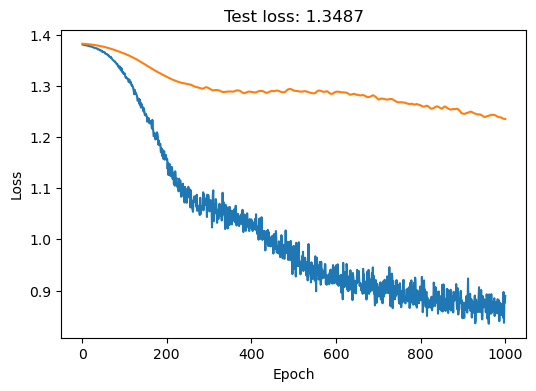

100%|██████████| 4/4 [00:03<00:00,  1.18it/s]


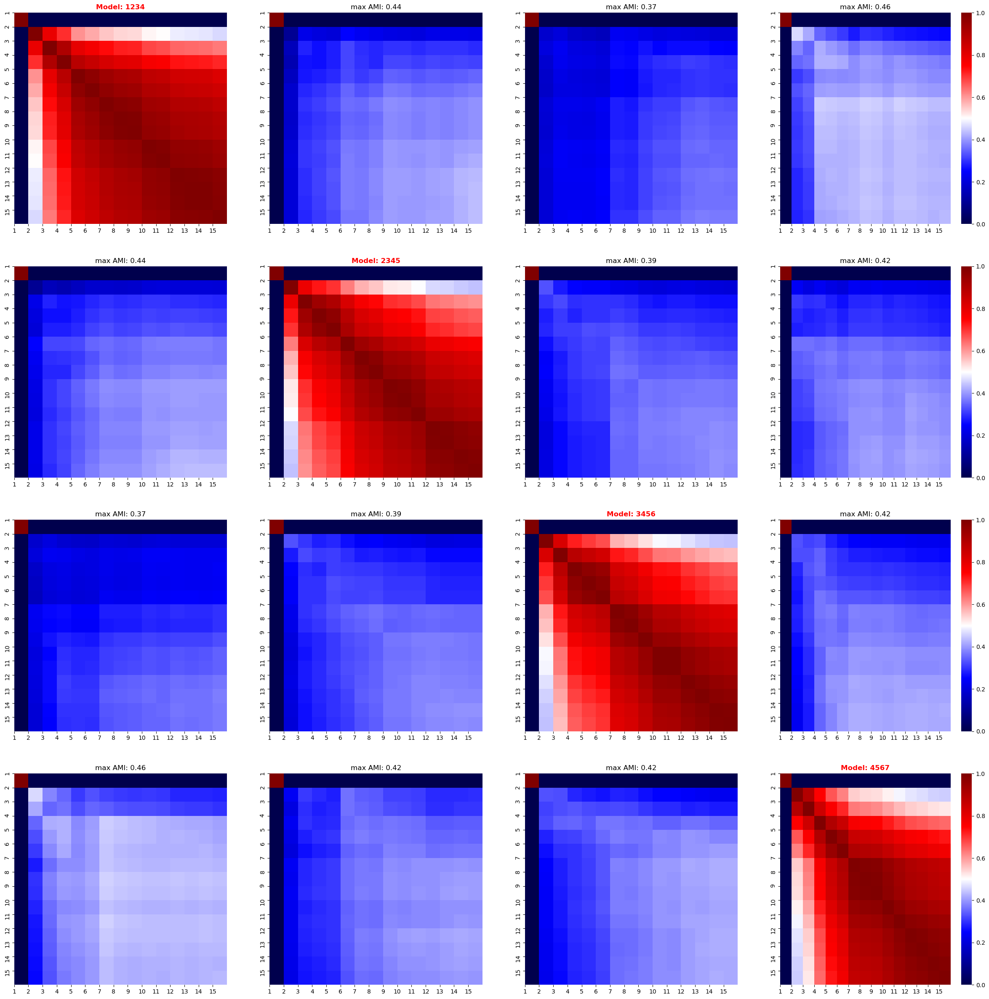

100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


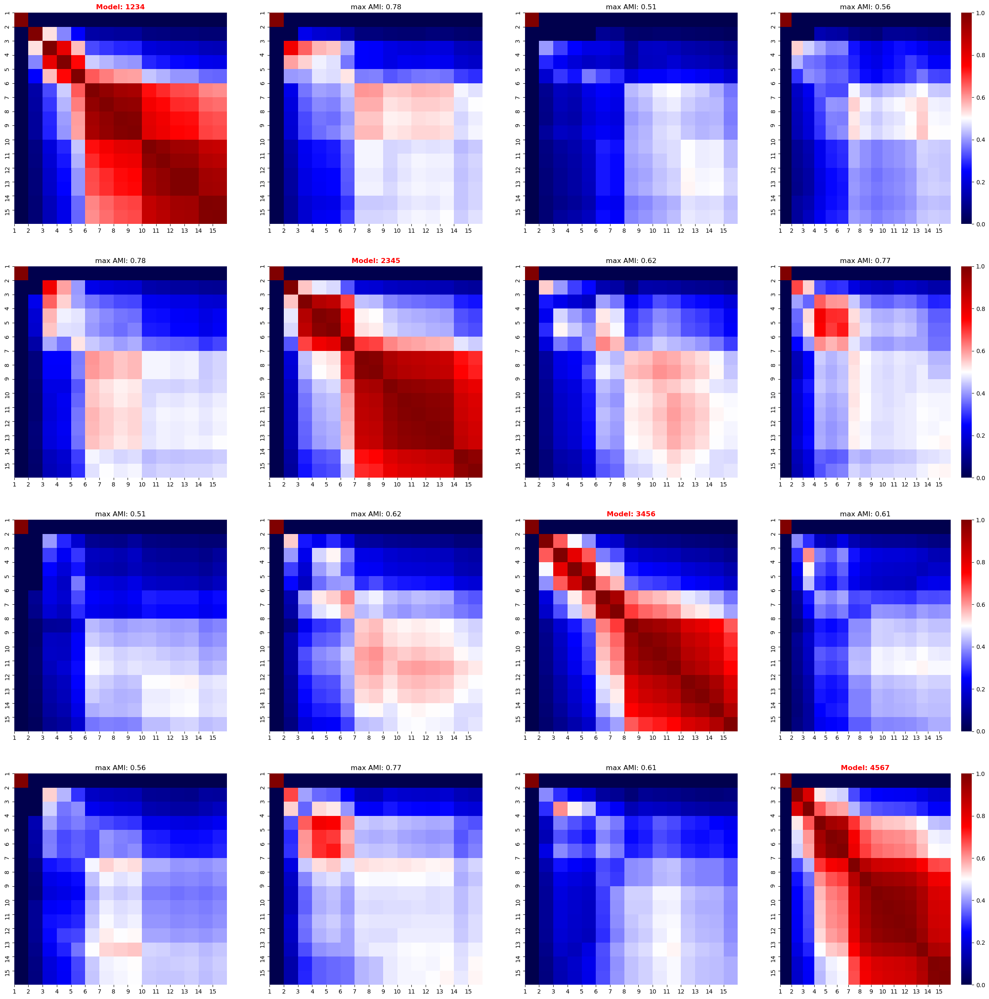

<IPython.core.display.Javascript object>

In [96]:
node_feature_key = "id"

for latent_dim in latent_dims:
    latents_dict_topogae = get_gae_latents_for_seed(
        graph_data=graph_data,
        data_dict=data_dict,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=244,
        latent_dim=latent_dim,
        hidden_dim=128,
        n_epochs=1000,
        plot_loss=True,
        lr=1e-4,
        early_stopping=200,
    )
    stability_amis_topogae = stability_cocluster_screen(
        latents_dict_topogae, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_topogae)
    stability_amis_topogae = stability_cocluster_screen(
        latents_dict_topogae, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_topogae)

We see that for the GAE trained on solely minimizing the loss of the reconstruction of the adjacency matrix shows a significant dependence of the random initialization. Interestingly, we obtain more stable embeddings with increasing dimensions.

---

##### Hallmark GAE

The next model is trained on a similar task but uses geneset memberships as node features, i.e. indicator variables assessing the inclusion of each node in one of the 50 Hallmark gene sets.

 34%|███▍      | 343/1000 [00:03<00:06, 107.09it/s]


Training stopped after 344 epochs
Best model found at epoch 142
------------------------------------------------------------
TRAIN loss: 0.9442278146743774
VAL loss: 0.904098391532898
TEST loss: 0.9317405223846436


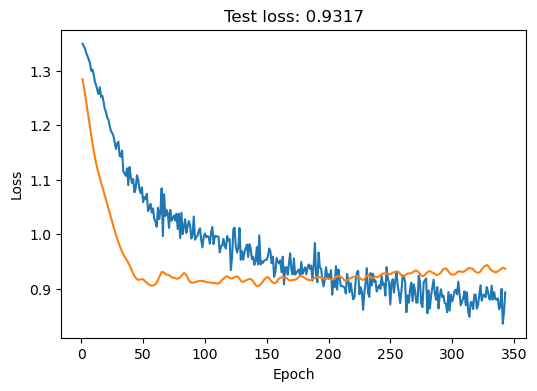

 34%|███▍      | 342/1000 [00:03<00:06, 104.77it/s]


Training stopped after 343 epochs
Best model found at epoch 141
------------------------------------------------------------
TRAIN loss: 0.9416835308074951
VAL loss: 0.8973078727722168
TEST loss: 0.9634377360343933


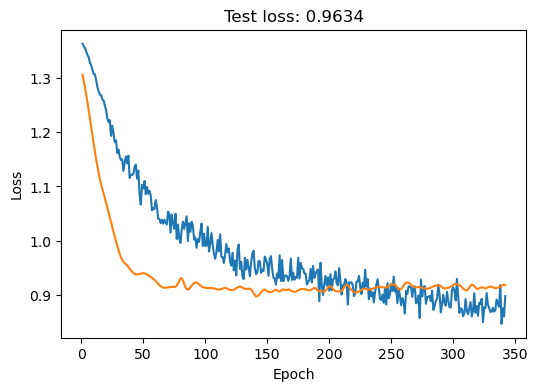

 30%|███       | 303/1000 [00:03<00:07, 97.18it/s] 


Training stopped after 304 epochs
Best model found at epoch 102
------------------------------------------------------------
TRAIN loss: 0.9886876344680786
VAL loss: 0.903709352016449
TEST loss: 0.9326798915863037


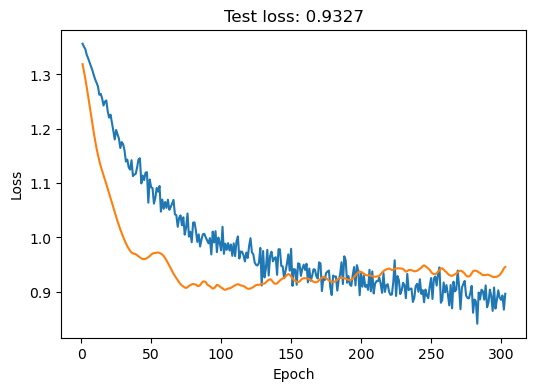

 25%|██▌       | 250/1000 [00:02<00:07, 98.97it/s] 


Training stopped after 251 epochs
Best model found at epoch 49
------------------------------------------------------------
TRAIN loss: 1.0643737316131592
VAL loss: 0.8957092761993408
TEST loss: 0.9375332593917847


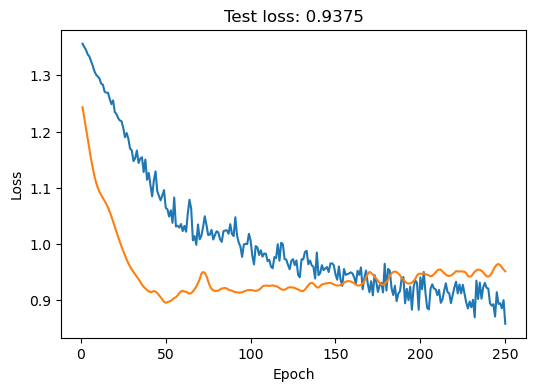

100%|██████████| 4/4 [00:02<00:00,  1.69it/s]


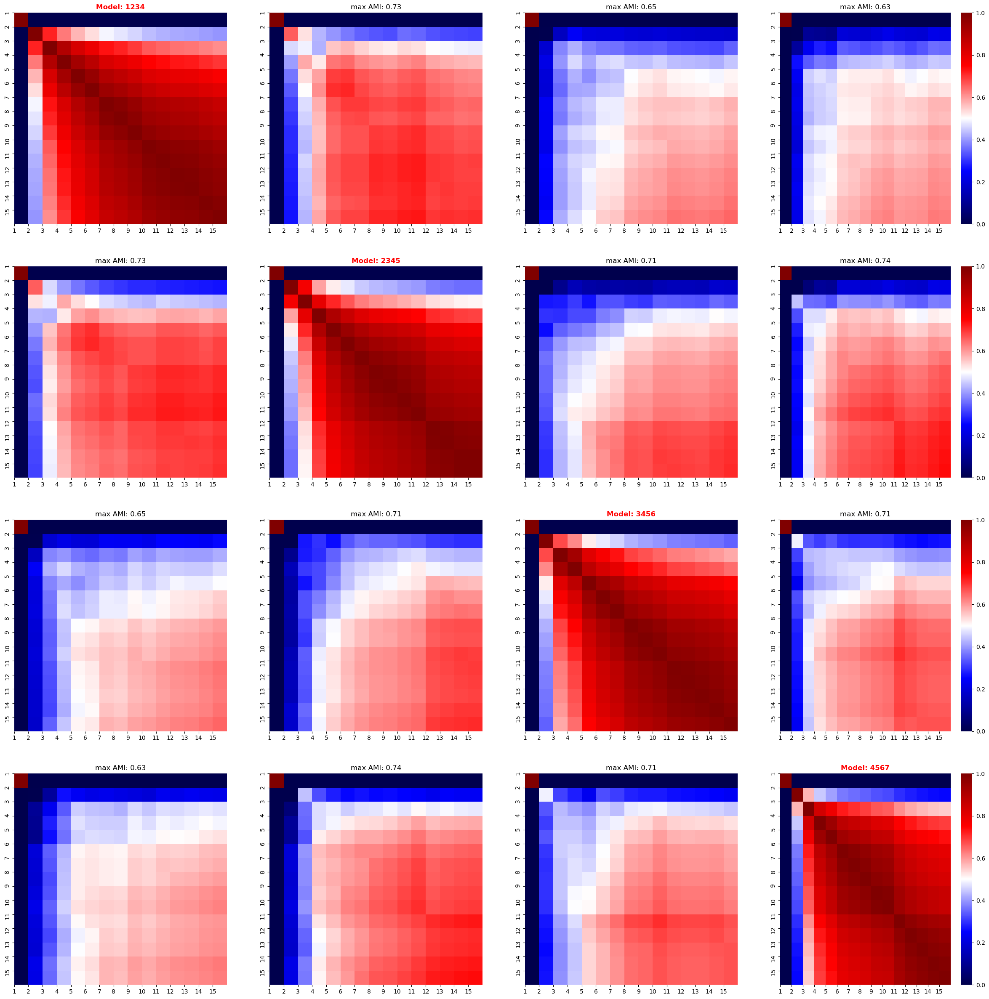

100%|██████████| 4/4 [00:02<00:00,  1.72it/s]


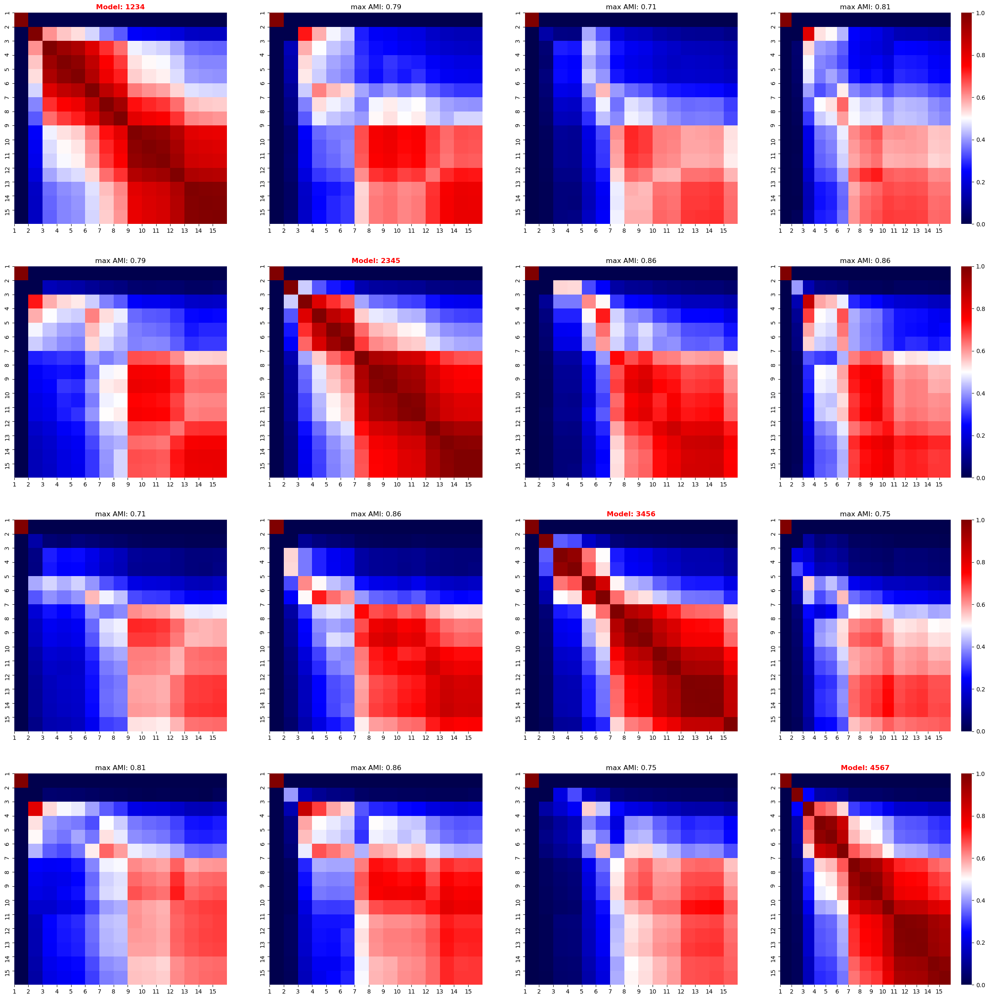

 34%|███▎      | 335/1000 [00:03<00:06, 105.26it/s]

Training stopped after 336 epochs
Best model found at epoch 134
------------------------------------------------------------
TRAIN loss: 0.9531413316726685
VAL loss: 0.9085327386856079
TEST loss: 0.937920331954956


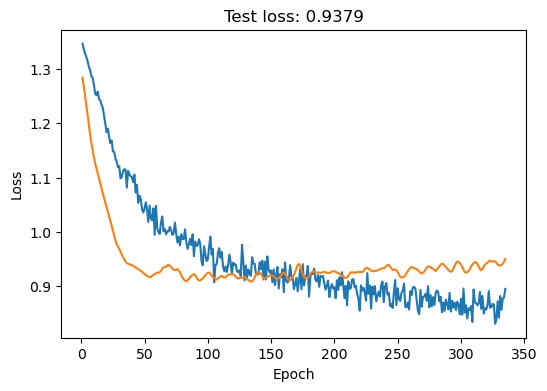

 24%|██▍       | 243/1000 [00:02<00:07, 94.63it/s] 


Training stopped after 244 epochs
Best model found at epoch 42
------------------------------------------------------------
TRAIN loss: 1.0864698886871338
VAL loss: 0.8693702220916748
TEST loss: 0.9225658178329468


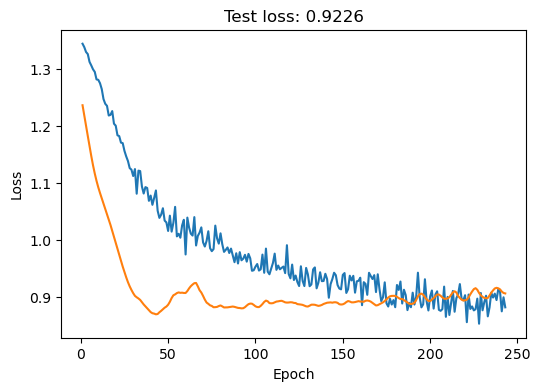

 24%|██▍       | 243/1000 [00:02<00:07, 95.19it/s] 


Training stopped after 244 epochs
Best model found at epoch 42
------------------------------------------------------------
TRAIN loss: 1.0869224071502686
VAL loss: 0.902437686920166
TEST loss: 0.920433759689331


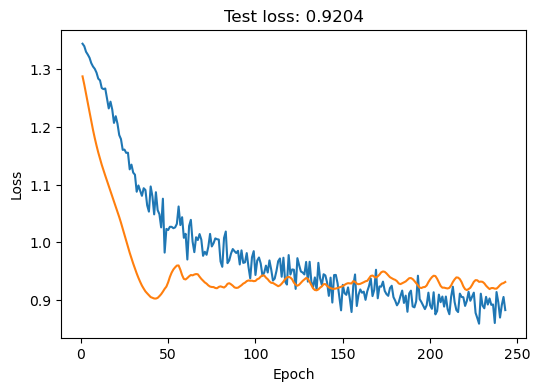

 24%|██▎       | 237/1000 [00:02<00:07, 103.90it/s]


Training stopped after 238 epochs
Best model found at epoch 36
------------------------------------------------------------
TRAIN loss: 1.0562803745269775
VAL loss: 0.9006235599517822
TEST loss: 0.9253532886505127


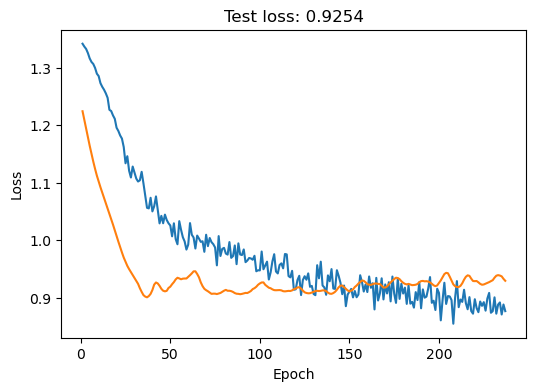

100%|██████████| 4/4 [00:02<00:00,  1.45it/s]


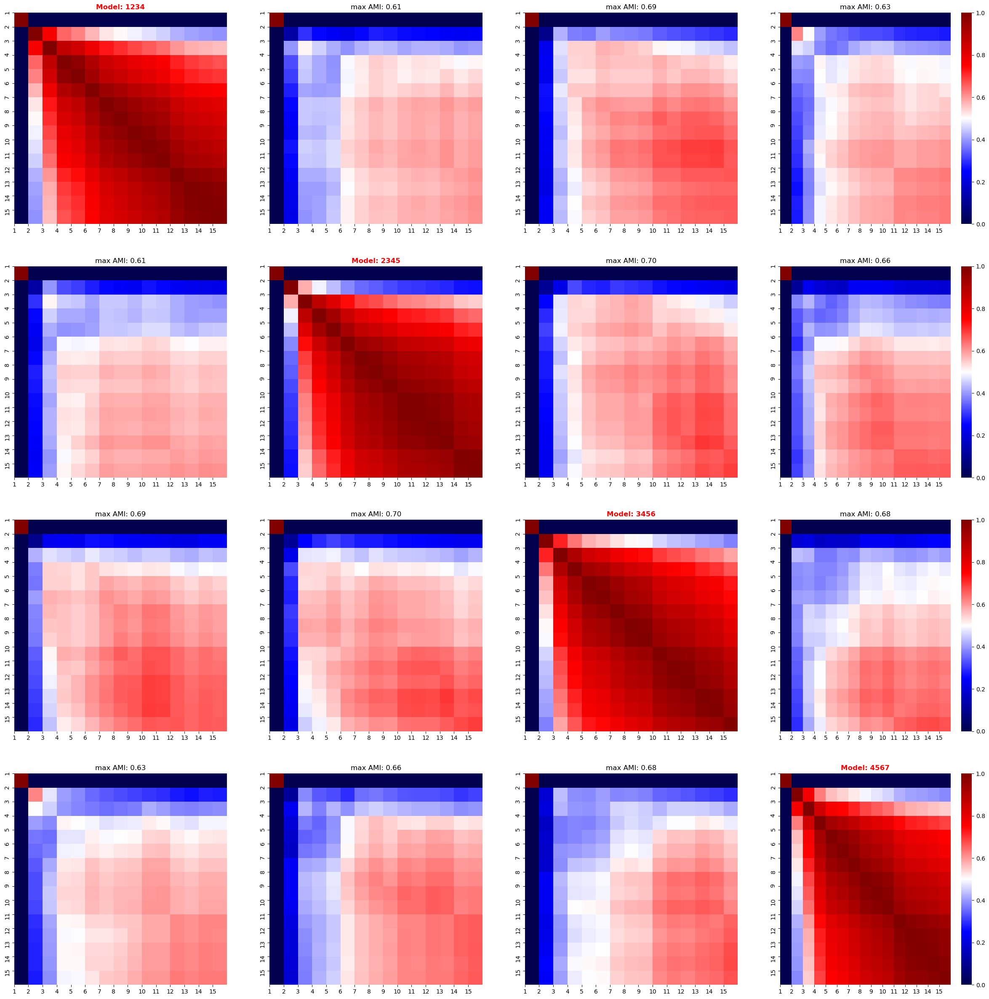

100%|██████████| 4/4 [00:02<00:00,  1.50it/s]


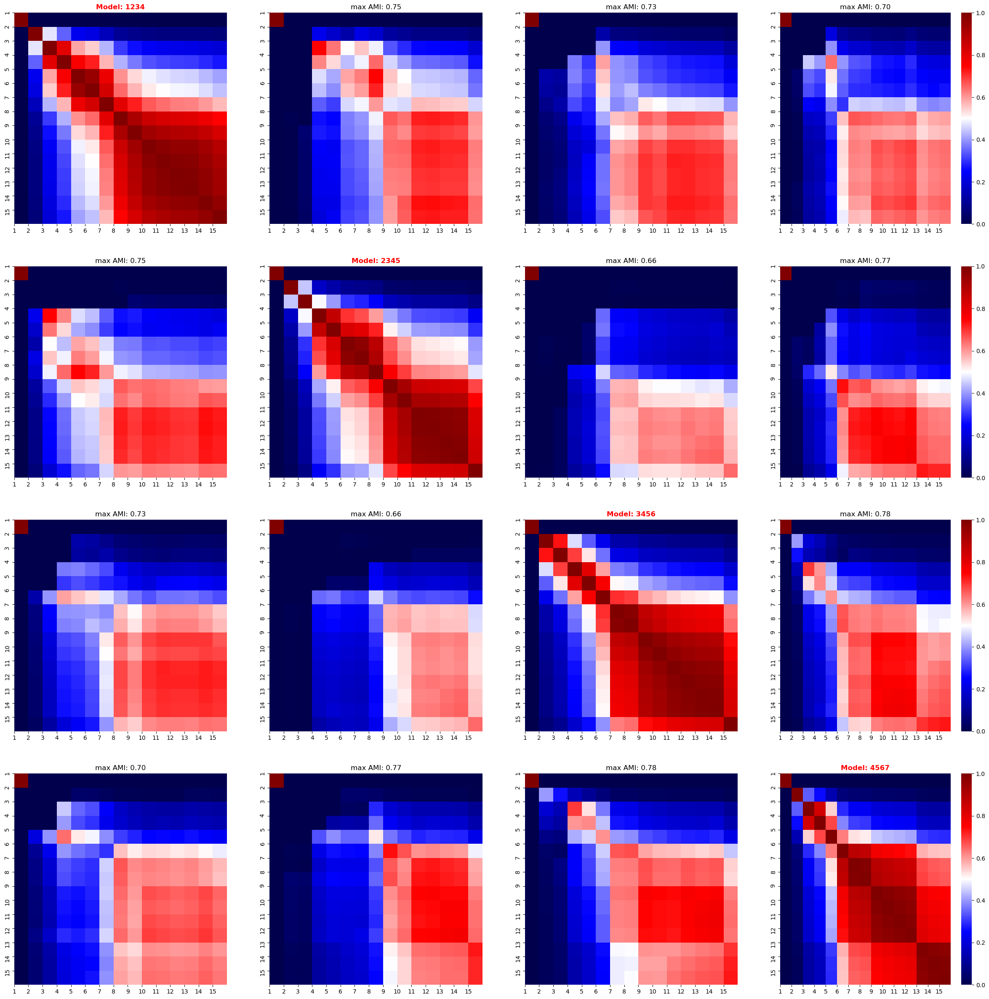

 23%|██▎       | 234/1000 [00:02<00:07, 107.46it/s]

Training stopped after 235 epochs
Best model found at epoch 33
------------------------------------------------------------
TRAIN loss: 1.0516880750656128
VAL loss: 0.8842613697052002
TEST loss: 0.9367642402648926


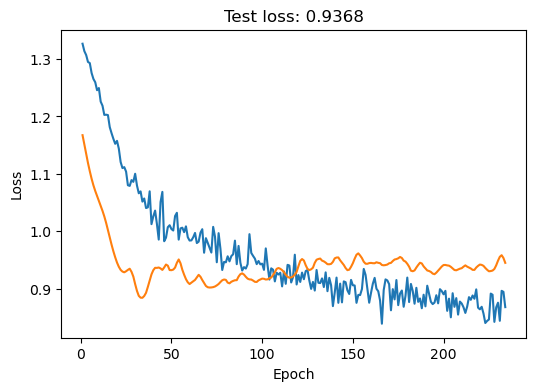

 29%|██▉       | 294/1000 [00:03<00:07, 92.49it/s] 


Training stopped after 295 epochs
Best model found at epoch 93
------------------------------------------------------------
TRAIN loss: 0.9547995328903198
VAL loss: 0.9068350195884705
TEST loss: 0.9337871670722961


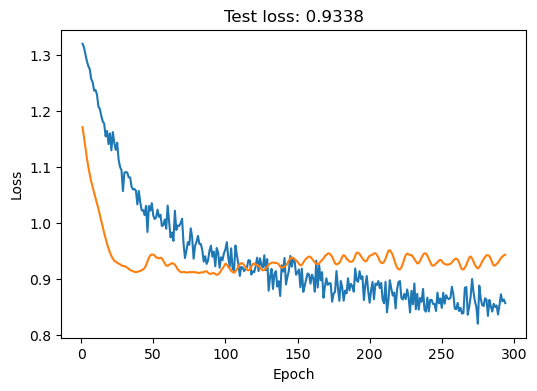

 24%|██▎       | 237/1000 [00:02<00:07, 100.53it/s]


Training stopped after 238 epochs
Best model found at epoch 36
------------------------------------------------------------
TRAIN loss: 1.0292532444000244
VAL loss: 0.8912864327430725
TEST loss: 0.931298017501831


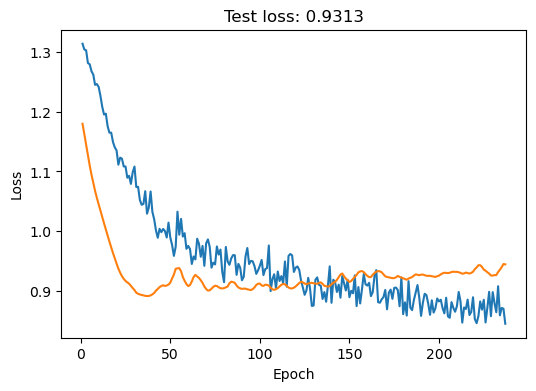

 23%|██▎       | 234/1000 [00:02<00:07, 106.11it/s]


Training stopped after 235 epochs
Best model found at epoch 33
------------------------------------------------------------
TRAIN loss: 1.0742180347442627
VAL loss: 0.883699357509613
TEST loss: 0.9511605501174927


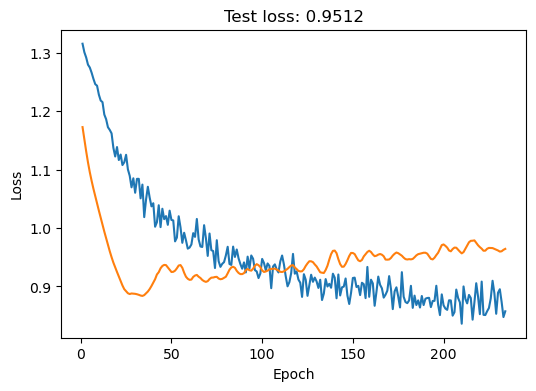

100%|██████████| 4/4 [00:03<00:00,  1.16it/s]


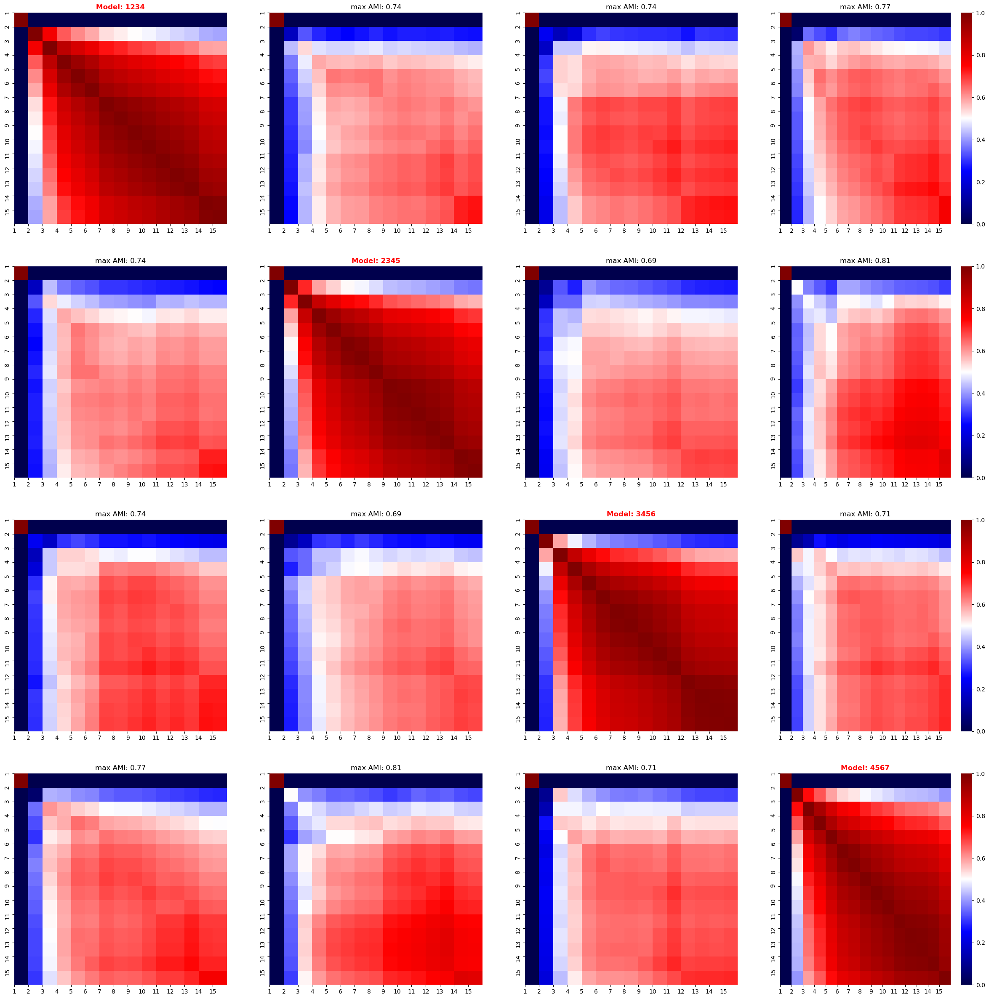

100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


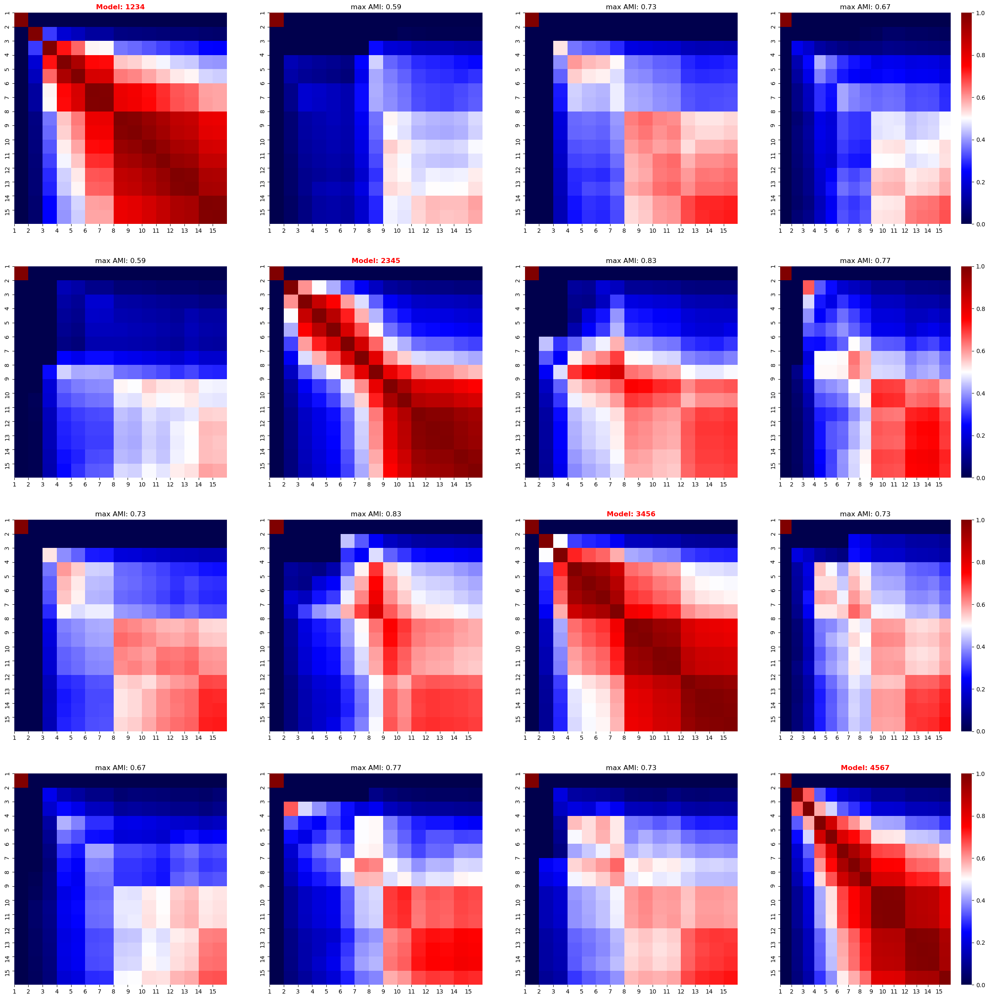

<IPython.core.display.Javascript object>

In [97]:
node_feature_key = "hallmark"
for latent_dim in latent_dims:
    latents_dict_hallgae = get_gae_latents_for_seed(
        graph_data=graph_data,
        data_dict=data_dict,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=50,
        latent_dim=latent_dim,
        hidden_dim=128,
        n_epochs=1000,
        plot_loss=True,
        lr=1e-3,
        early_stopping=200,
    )
    stability_amis_hallgae = stability_cocluster_screen(
        latents_dict_hallgae, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_hallgae)
    stability_amis_hallgae = stability_cocluster_screen(
        latents_dict_hallgae, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_hallgae)

We find the embeddings for the Hallmark GAE to be relatively stable for different numbers of latent dimensions.

---

##### Hallmark-GEX GAE

Finally, we train an autoencoder using both the binary hallmark geneset features and the min-max-scaled gene expression data as inputs.

In [22]:
node_feature_key = "sc_gex_hallmark"
latent_dims = [1024]
for latent_dim in latent_dims:
    latents_dict_hallgexgae = get_gae_latents_for_seed(
        graph_data=graph_data,
        data_dict=data_dict,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=1176,
        latent_dim=latent_dim,
        hidden_dim=128,
        n_epochs=1000,
        lr=0.0001,
        plot_loss=True,
        early_stopping=1000,
    )
    stability_amis_hallgexgae = stability_cocluster_screen(
        latents_dict_hallgexgae, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae)
    stability_amis_hallgexgae = stability_cocluster_screen(
        latents_dict_hallgexgae, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae)

 57%|█████▋    | 569/1000 [00:07<00:05, 79.29it/s] 


KeyboardInterrupt: 

<IPython.core.display.Javascript object>

We obtain fairly stable results for different choices of the size of the latent space as well.

---

##### Hallmark-GEX GAE (link prediction)

We will now reassess the previous model's stability when training it on a link-prediction task.
That is the data will also be split differently for each term.

100%|██████████| 1000/1000 [00:12<00:00, 77.97it/s]


------------------------------------------------------------
TRAIN loss: 0.9307839870452881
VAL loss: 1.0807075500488281
TEST loss: 1.1896342039108276
TEST AUC: 0.7959504437869822 	 AP: 0.8286360696542656


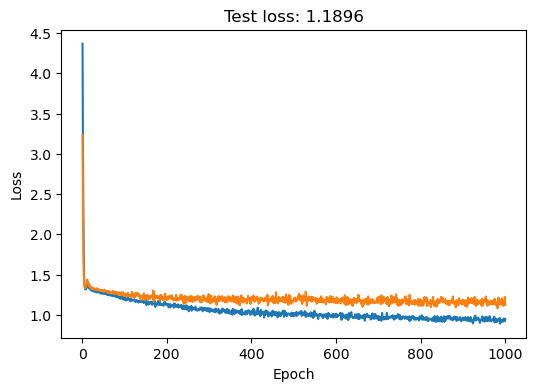

 55%|█████▌    | 552/1000 [00:07<00:06, 74.32it/s]


Training stopped after 553 epochs
Best model found at epoch 351
------------------------------------------------------------
TRAIN loss: 1.0576868057250977
VAL loss: 1.1572380065917969
TEST loss: 1.1893055438995361
TEST AUC: 0.7708025147928994 	 AP: 0.813141605821974


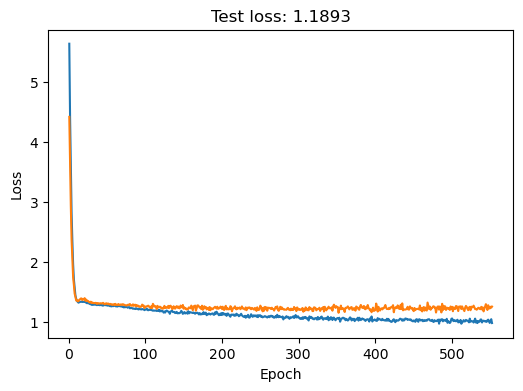

 67%|██████▋   | 668/1000 [00:08<00:04, 76.24it/s]


Training stopped after 669 epochs
Best model found at epoch 467
------------------------------------------------------------
TRAIN loss: 1.0309395790100098
VAL loss: 1.1281614303588867
TEST loss: 1.2006161212921143
TEST AUC: 0.764792899408284 	 AP: 0.7959017927477274


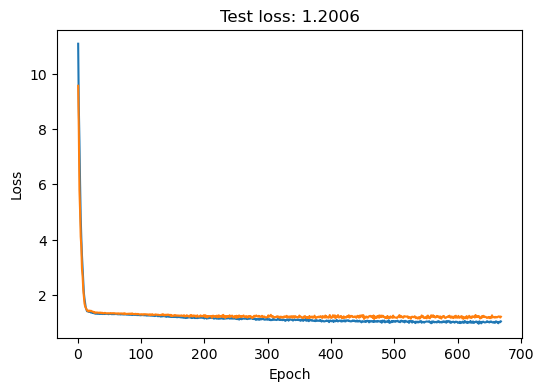

 83%|████████▎ | 828/1000 [00:11<00:02, 71.38it/s]

Training stopped after 829 epochs
Best model found at epoch 627
------------------------------------------------------------
TRAIN loss: 0.9563339352607727
VAL loss: 1.1203382015228271
TEST loss: 1.139815330505371
TEST AUC: 0.7770894970414202 	 AP: 0.8080173852654975


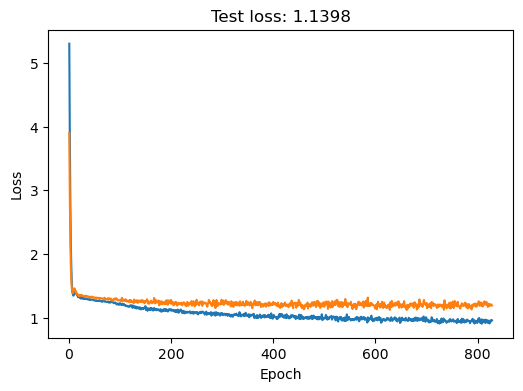

100%|██████████| 4/4 [00:02<00:00,  1.70it/s]


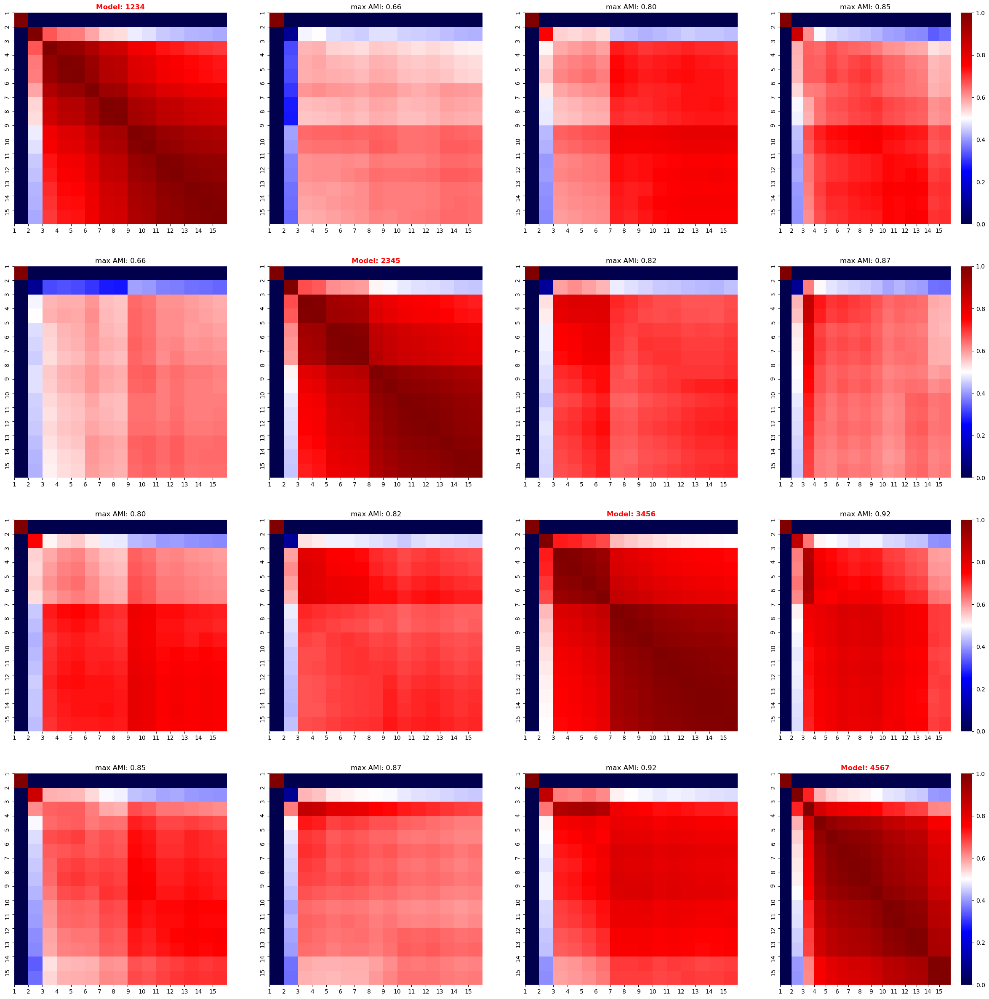

100%|██████████| 4/4 [00:02<00:00,  1.75it/s]


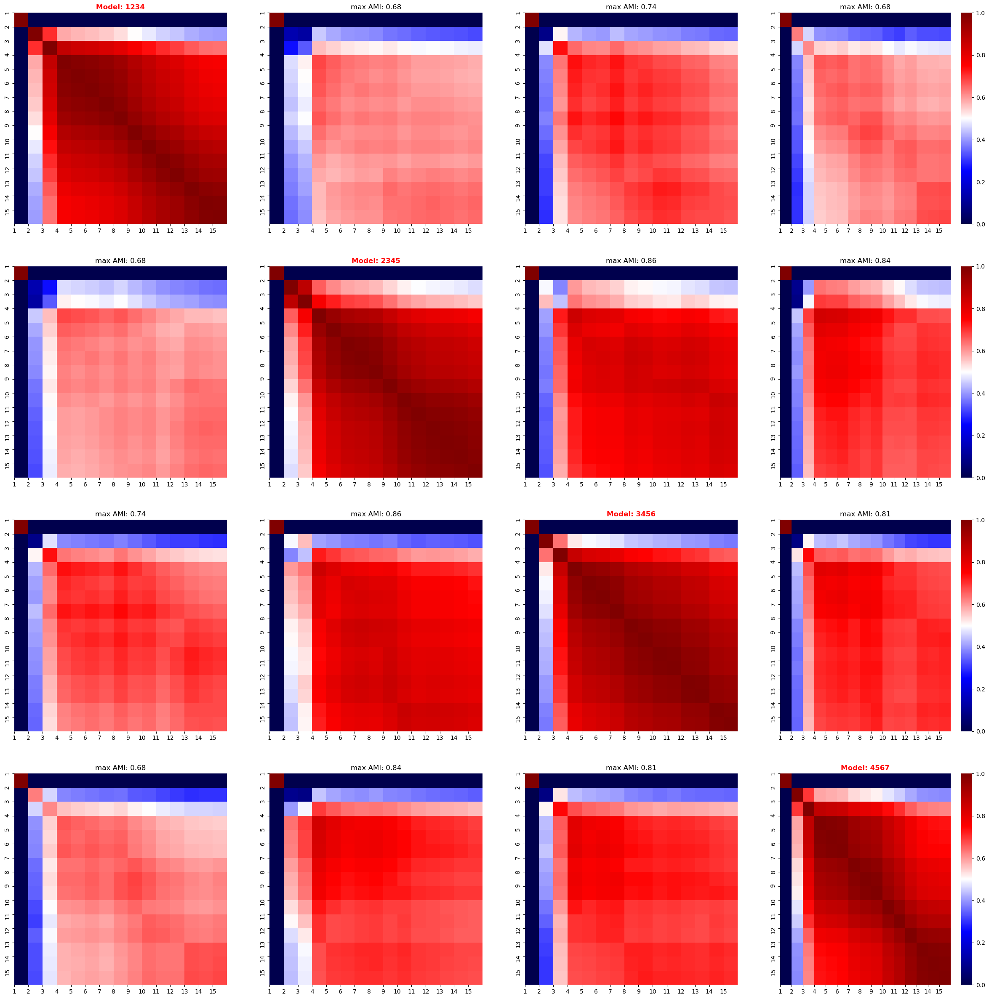

 78%|███████▊  | 785/1000 [00:10<00:02, 77.65it/s]


Training stopped after 786 epochs
Best model found at epoch 584
------------------------------------------------------------
TRAIN loss: 0.9753760099411011
VAL loss: 1.114281177520752
TEST loss: 1.1209626197814941
TEST AUC: 0.7832840236686391 	 AP: 0.8205912238261162


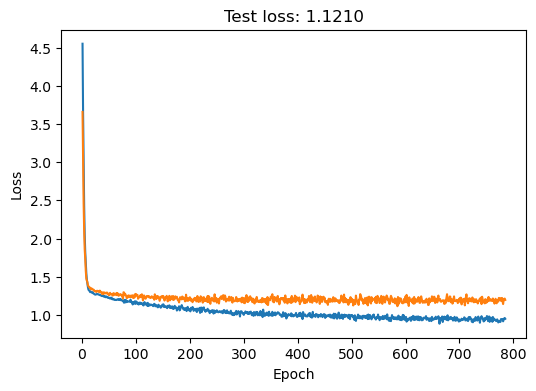

 78%|███████▊  | 780/1000 [00:10<00:03, 71.74it/s]


Training stopped after 781 epochs
Best model found at epoch 579
------------------------------------------------------------
TRAIN loss: 1.0163590908050537
VAL loss: 1.1292980909347534
TEST loss: 1.1251130104064941
TEST AUC: 0.8020525147928994 	 AP: 0.8335122544604109


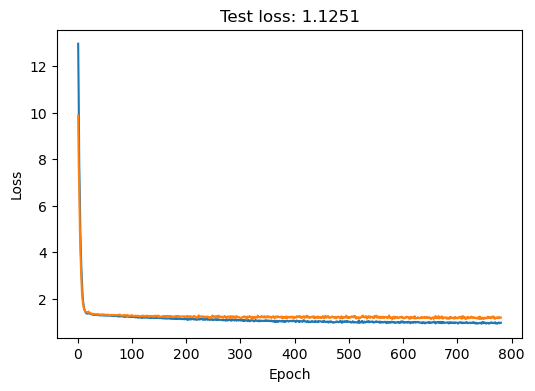

 64%|██████▎   | 635/1000 [00:07<00:04, 80.48it/s]


Training stopped after 636 epochs
Best model found at epoch 434
------------------------------------------------------------
TRAIN loss: 0.9753230810165405
VAL loss: 1.1221665143966675
TEST loss: 1.1686275005340576
TEST AUC: 0.7888313609467456 	 AP: 0.812986298252423


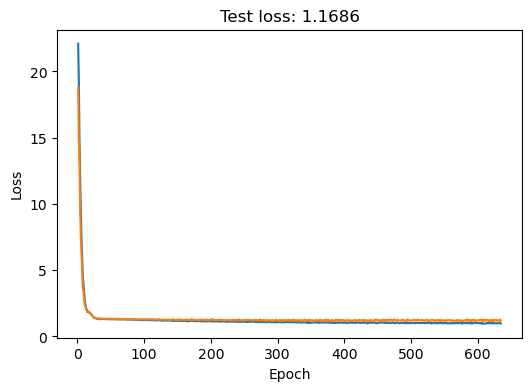

 55%|█████▍    | 549/1000 [00:07<00:06, 70.51it/s]


Training stopped after 550 epochs
Best model found at epoch 348
------------------------------------------------------------
TRAIN loss: 1.0258722305297852
VAL loss: 1.117673397064209
TEST loss: 1.146989345550537
TEST AUC: 0.8130547337278106 	 AP: 0.8351569611312344


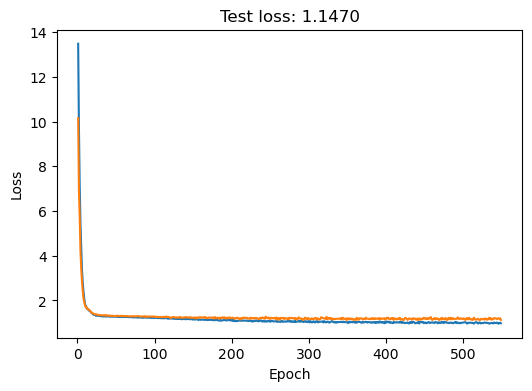

100%|██████████| 4/4 [00:02<00:00,  1.47it/s]


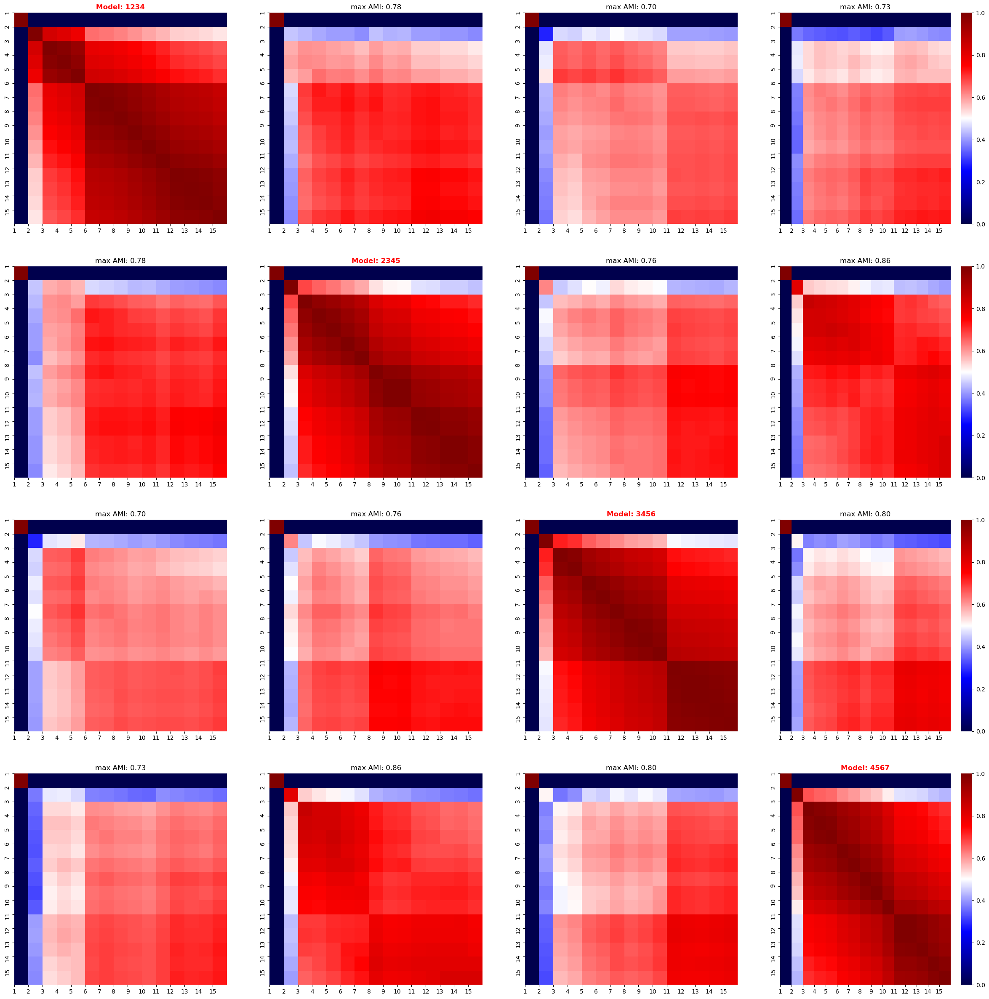

100%|██████████| 4/4 [00:02<00:00,  1.50it/s]


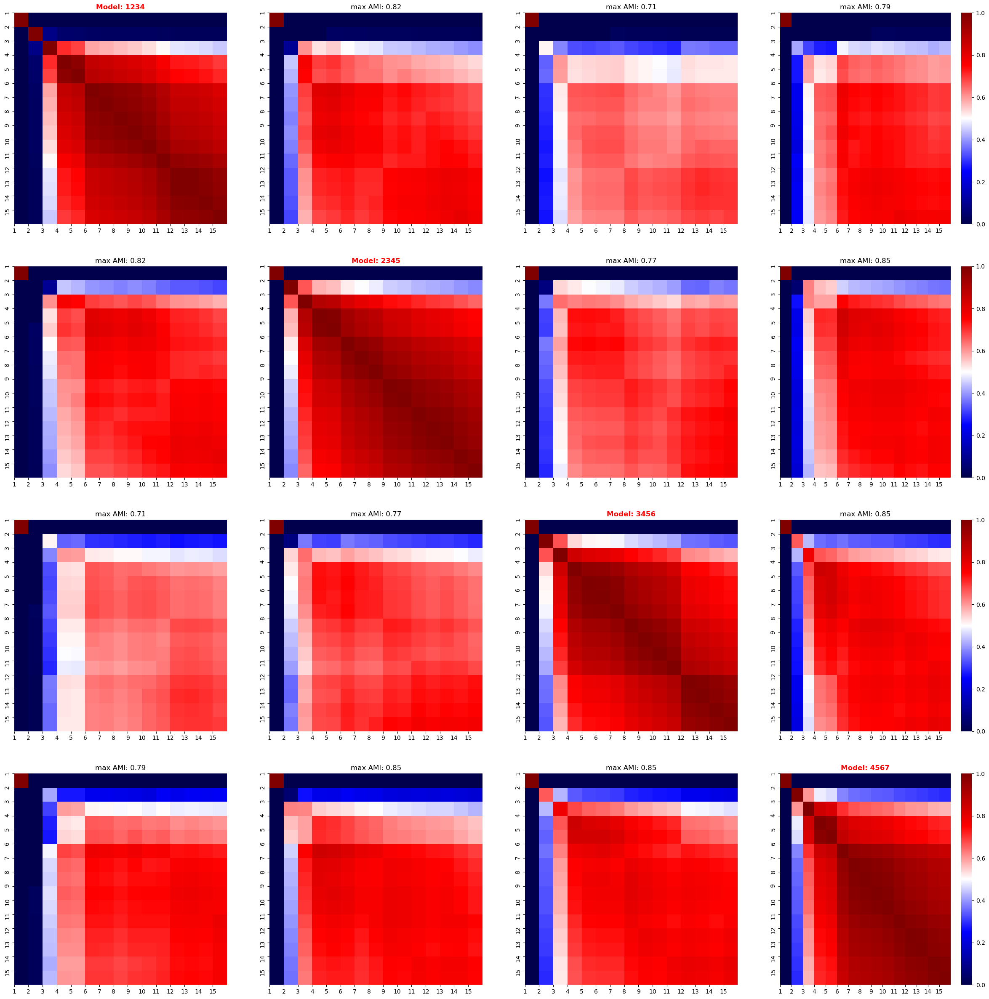

 70%|███████   | 700/1000 [00:09<00:03, 76.12it/s]


Training stopped after 701 epochs
Best model found at epoch 499
------------------------------------------------------------
TRAIN loss: 0.9626131057739258
VAL loss: 1.1076072454452515
TEST loss: 1.1650047302246094
TEST AUC: 0.8269230769230769 	 AP: 0.8633141418223587


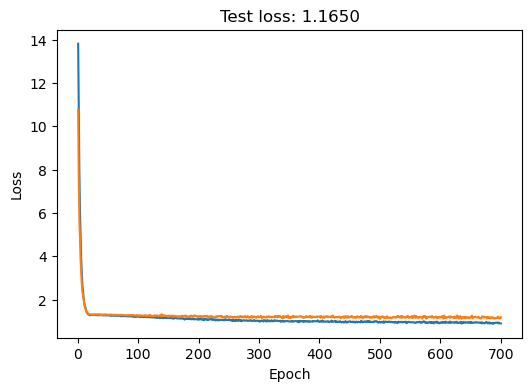

 56%|█████▌    | 562/1000 [00:07<00:05, 75.55it/s]


Training stopped after 563 epochs
Best model found at epoch 361
------------------------------------------------------------
TRAIN loss: 0.9987622499465942
VAL loss: 1.1027626991271973
TEST loss: 1.1588060855865479
TEST AUC: 0.8357063609467454 	 AP: 0.8639036981917141


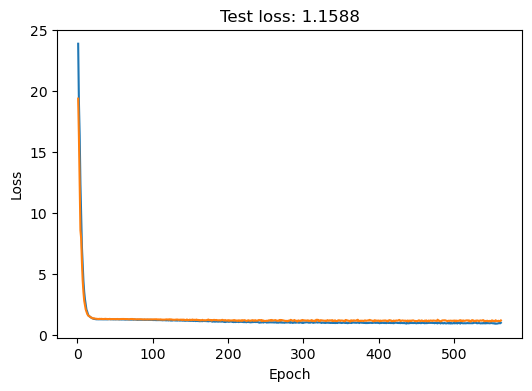

 86%|████████▌ | 862/1000 [00:11<00:01, 74.44it/s]


Training stopped after 863 epochs
Best model found at epoch 661
------------------------------------------------------------
TRAIN loss: 0.913871169090271
VAL loss: 1.1100112199783325
TEST loss: 1.1556878089904785
TEST AUC: 0.8228550295857988 	 AP: 0.85886299981415


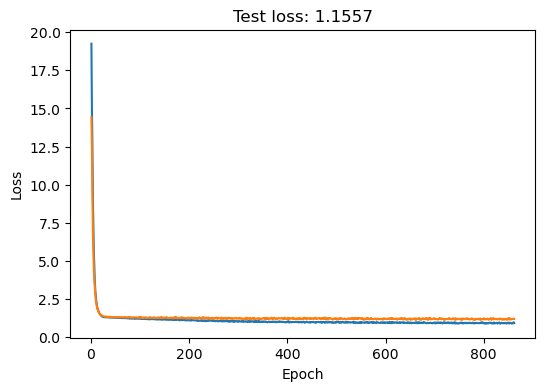

 52%|█████▏    | 519/1000 [00:07<00:07, 67.87it/s]


Training stopped after 520 epochs
Best model found at epoch 318
------------------------------------------------------------
TRAIN loss: 1.0186219215393066
VAL loss: 1.1409804821014404
TEST loss: 1.150909185409546
TEST AUC: 0.81666050295858 	 AP: 0.8566264397853932


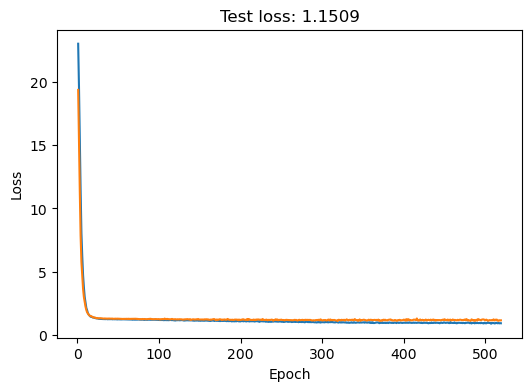

100%|██████████| 4/4 [00:03<00:00,  1.16it/s]


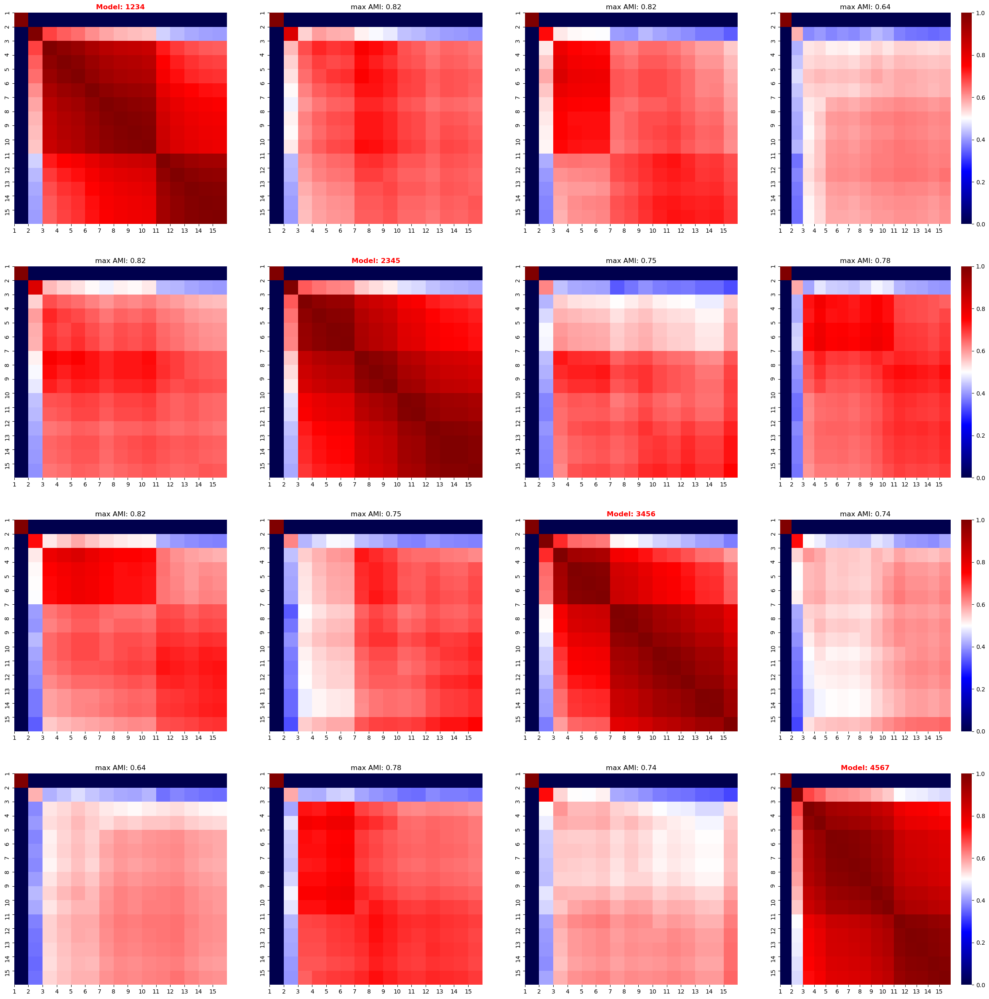

100%|██████████| 4/4 [00:03<00:00,  1.12it/s]


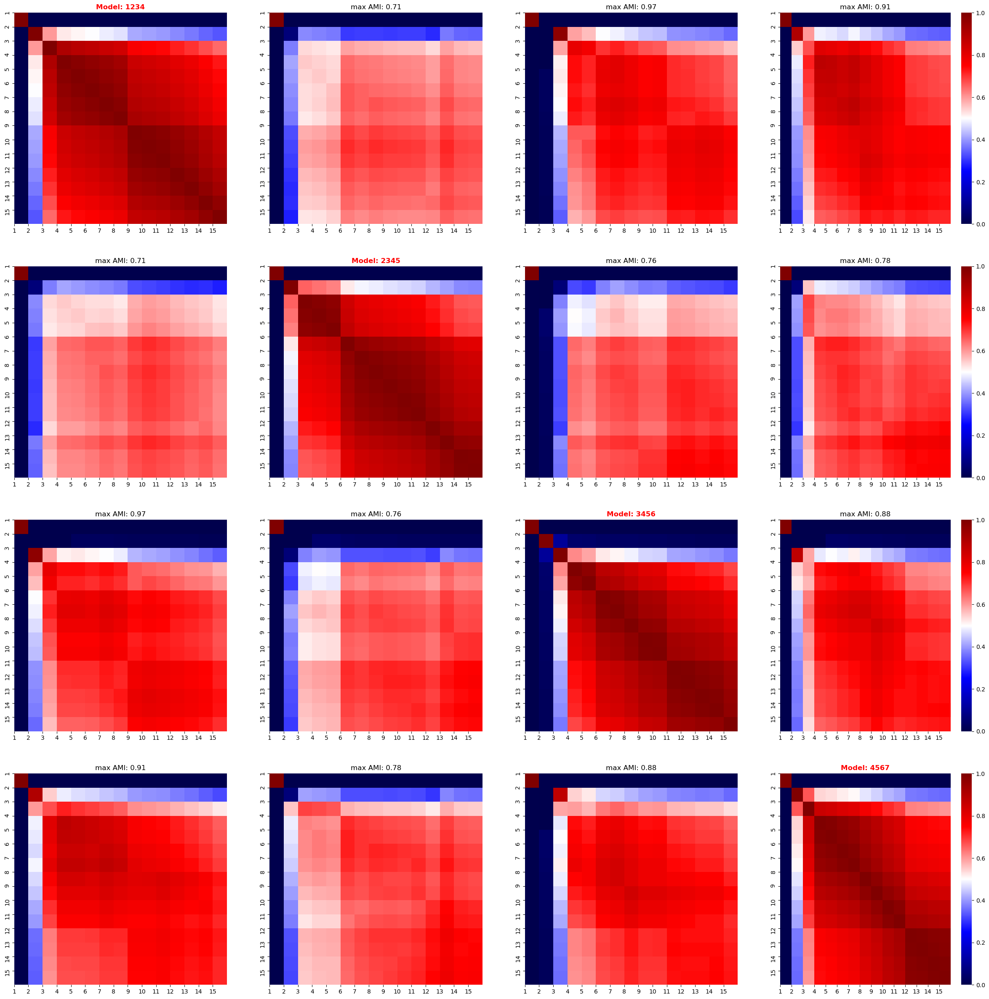

<IPython.core.display.Javascript object>

In [99]:
node_feature_key = "sc_gex_hallmark"
for latent_dim in [1024]:
    latents_dict_hallgexgae_lp = get_gae_latents_for_seed(
        graph_data=graph_data,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=1176,
        latent_dim=latent_dim,
        hidden_dim=1024,
        n_epochs=1000,
        lr=0.0001,
        link_pred=True,
        plot_loss=True,
        early_stopping=200,
    )
    stability_amis_hallgexgae_lp = stability_cocluster_screen(
        latents_dict_hallgexgae_lp, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_lp)
    stability_amis_hallgexgae_lp = stability_cocluster_screen(
        latents_dict_hallgexgae_lp, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_lp)

---

##### Hallmark-GEX GAE (adjacency & feature reconstruction)

Next, we keep the previous model setup but train it on the task of feature reconstruction and the reconstruction of the adjacency matrix without any training-validation or test split of the data.

Latent dim: 1024


 15%|█▍        | 1485/10000 [00:28<02:43, 52.02it/s]


Training stopped after 1486 epochs
Best model found at epoch 484
------------------------------------------------------------
AUC: 0.9650883838383841 AP: 0.9641131276131276
TRAIN loss: 1.0054469108581543
VAL loss: 1.2055978775024414
TEST loss: 1.2455532550811768


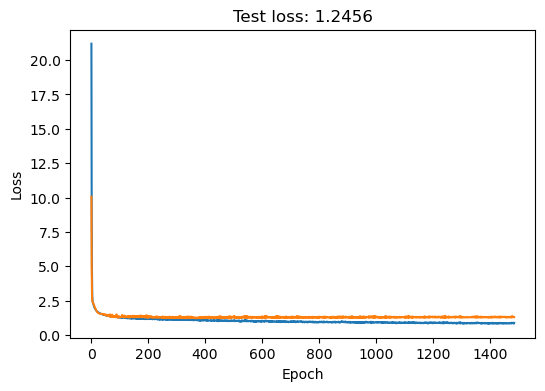

 14%|█▍        | 1375/10000 [00:25<02:38, 54.25it/s]


Training stopped after 1376 epochs
Best model found at epoch 374
------------------------------------------------------------
AUC: 0.9599823232323232 AP: 0.9560946531681828
TRAIN loss: 1.0835561752319336
VAL loss: 1.2018733024597168
TEST loss: 1.2927287817001343


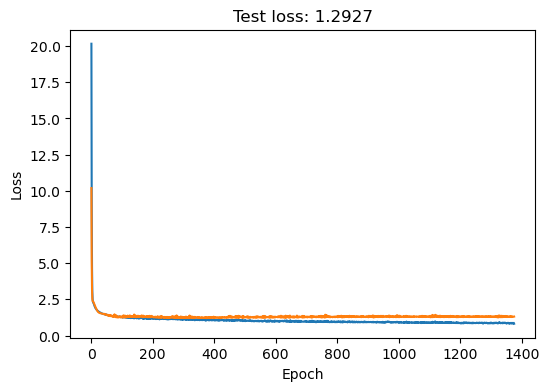

 18%|█▊        | 1751/10000 [00:31<02:28, 55.60it/s]


Training stopped after 1752 epochs
Best model found at epoch 750
------------------------------------------------------------
AUC: 0.9736919191919192 AP: 0.9710440300440303
TRAIN loss: 0.9286210536956787
VAL loss: 1.2374560832977295
TEST loss: 1.2645010948181152


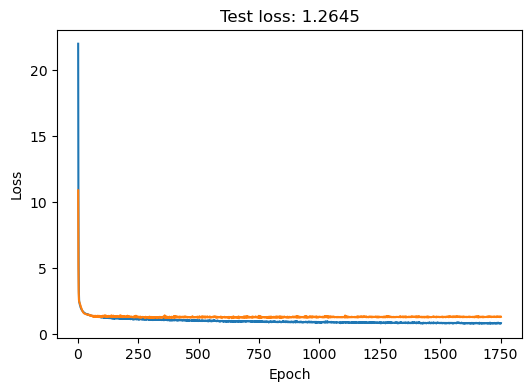

 13%|█▎        | 1348/10000 [00:24<02:35, 55.74it/s]


Training stopped after 1349 epochs
Best model found at epoch 347
------------------------------------------------------------
AUC: 0.9486035353535354 AP: 0.9528424017216587
TRAIN loss: 1.0950400829315186
VAL loss: 1.2143793106079102
TEST loss: 1.2941186428070068


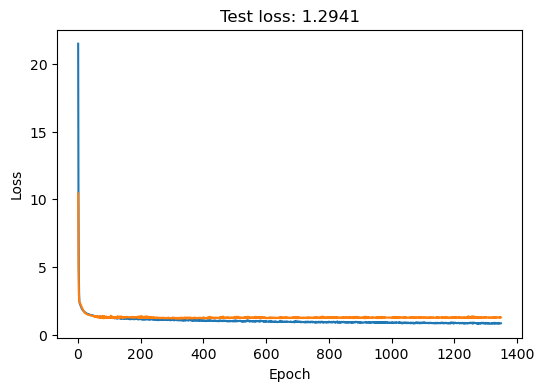

100%|██████████| 4/4 [00:16<00:00,  4.04s/it]


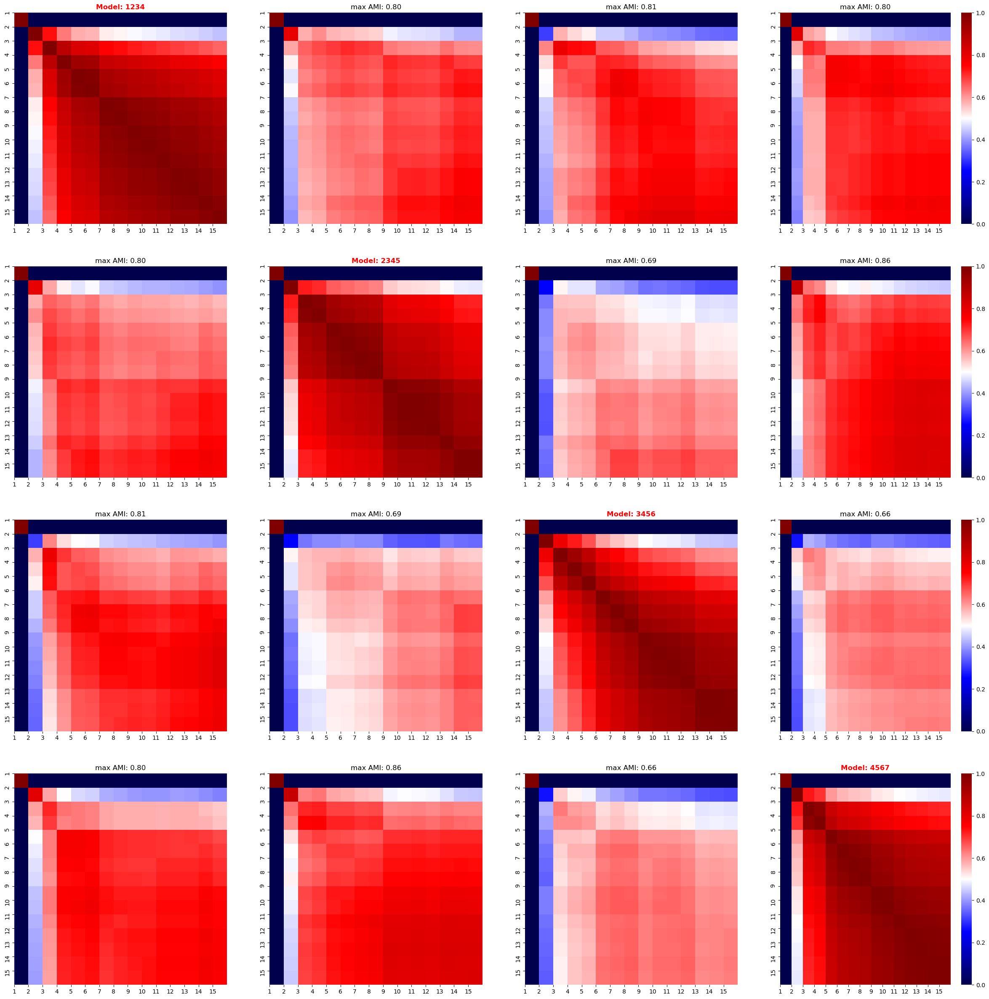

100%|██████████| 4/4 [00:15<00:00,  4.00s/it]


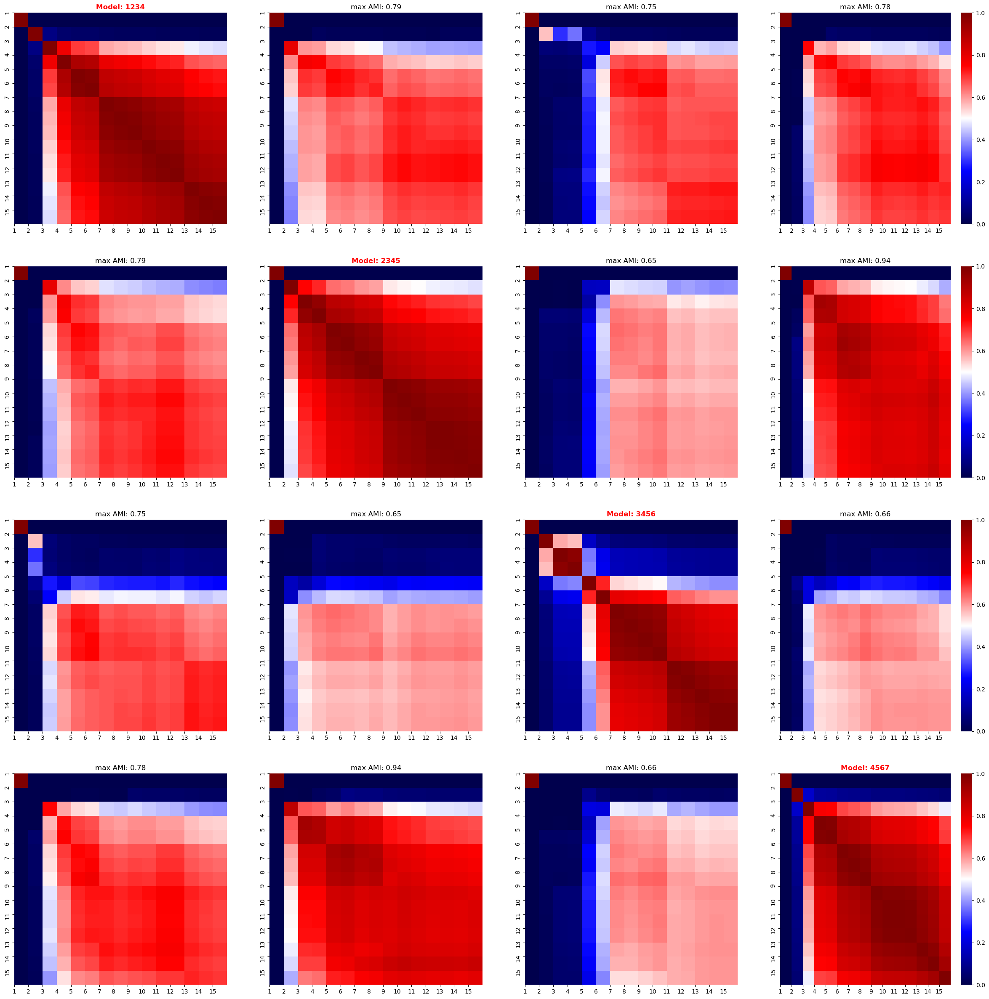

<IPython.core.display.Javascript object>

In [24]:
node_feature_key = "sc_gex_hallmark"

for latent_dim in [1024]:
    print("Latent dim: {}".format(latent_dim))
    latents_dict_hallgexgae_feat = get_gae_latents_for_seed(
        graph_data=graph_data,
        data_dict=data_dict,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=1176,
        latent_dim=latent_dim,
        hidden_dim=1024,
        n_epochs=100000,
        lr=0.00001,
        split_type=None,
        reconstruct_features=True,
        feature_decoder_params={
            "latent_dim": latent_dim,
            "output_dim": 1176,
            "hidden_dims": [1024, 1024, 1024],
        },
        feat_loss=torch.nn.L1Loss(),
        alpha=1,
        beta=2,
        plot_loss=True,
        early_stopping=1000,
    )
    stability_amis_hallgexgae_feat = stability_cocluster_screen(
        latents_dict_hallgexgae_feat, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_feat)
    stability_amis_hallgexgae_feat = stability_cocluster_screen(
        latents_dict_hallgexgae_feat, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_feat)

We find that adding the reconstruction loss as an additional supervisory signal seems to improve the stability of the inferred embeddings. As for all GAE variants we see more stable solutions for the largest embedding dimension considered in the study 128.

---

##### Hallmark-GEX-GAE ( only feature reconstruction)

The final setup is training the same model as above but only on the task of feature reconstruction, i.e. assigning zero-loss for the reconstruction of the adjacency matrix.

Latent dim: 32


 80%|████████  | 800/1000 [00:12<00:03, 62.84it/s]

Training stopped after 801 epochs
Best model found at epoch 599
------------------------------------------------------------
TRAIN loss: 0.027718111872673035
VAL loss: 0.04781749099493027
TEST loss: 0.06464863568544388


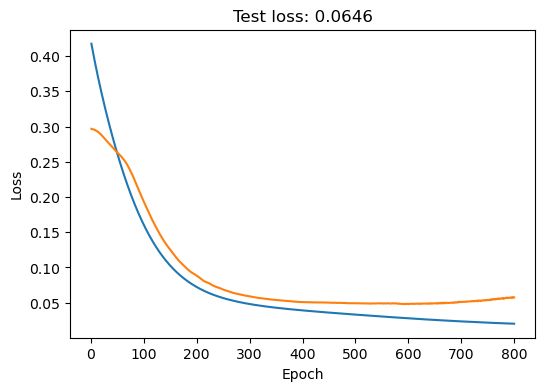

 80%|████████  | 805/1000 [00:13<00:03, 61.13it/s]


Training stopped after 806 epochs
Best model found at epoch 604
------------------------------------------------------------
TRAIN loss: 0.02870028465986252
VAL loss: 0.03650912269949913
TEST loss: 0.04852733388543129


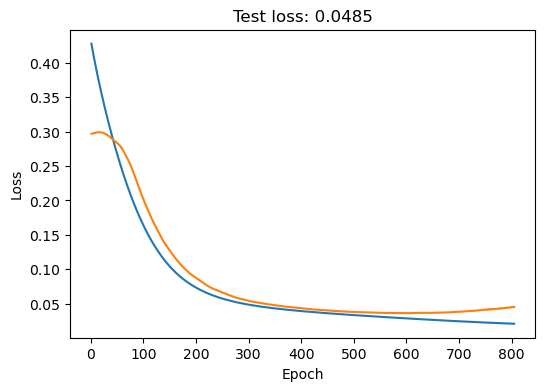

 65%|██████▍   | 649/1000 [00:10<00:05, 60.80it/s]


Training stopped after 650 epochs
Best model found at epoch 448
------------------------------------------------------------
TRAIN loss: 0.03625485301017761
VAL loss: 0.0514751598238945
TEST loss: 0.049956291913986206


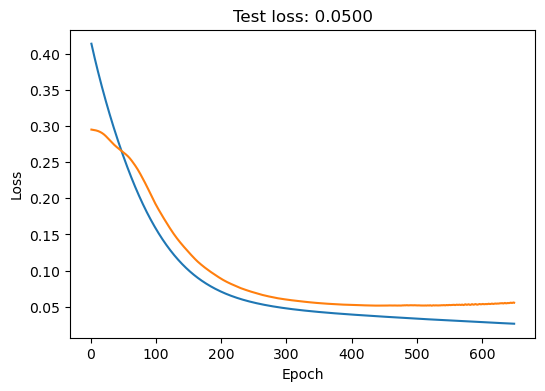

 64%|██████▍   | 644/1000 [00:10<00:05, 60.54it/s]


Training stopped after 645 epochs
Best model found at epoch 443
------------------------------------------------------------
TRAIN loss: 0.0369432307779789
VAL loss: 0.048849333077669144
TEST loss: 0.040815845131874084


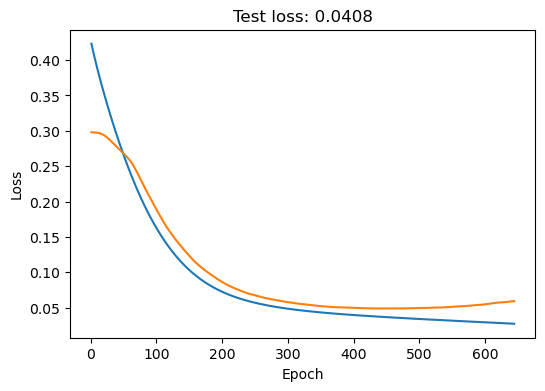

100%|██████████| 4/4 [00:02<00:00,  1.60it/s]


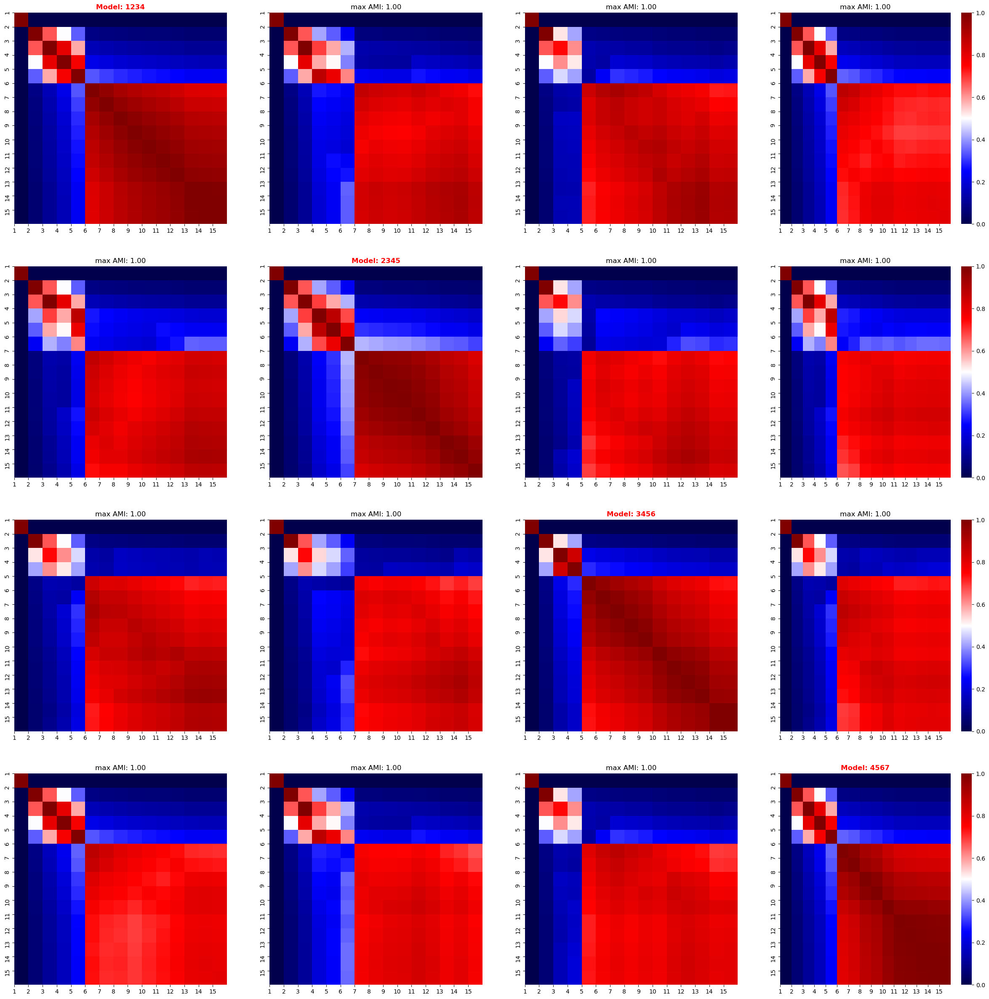

100%|██████████| 4/4 [00:02<00:00,  1.65it/s]


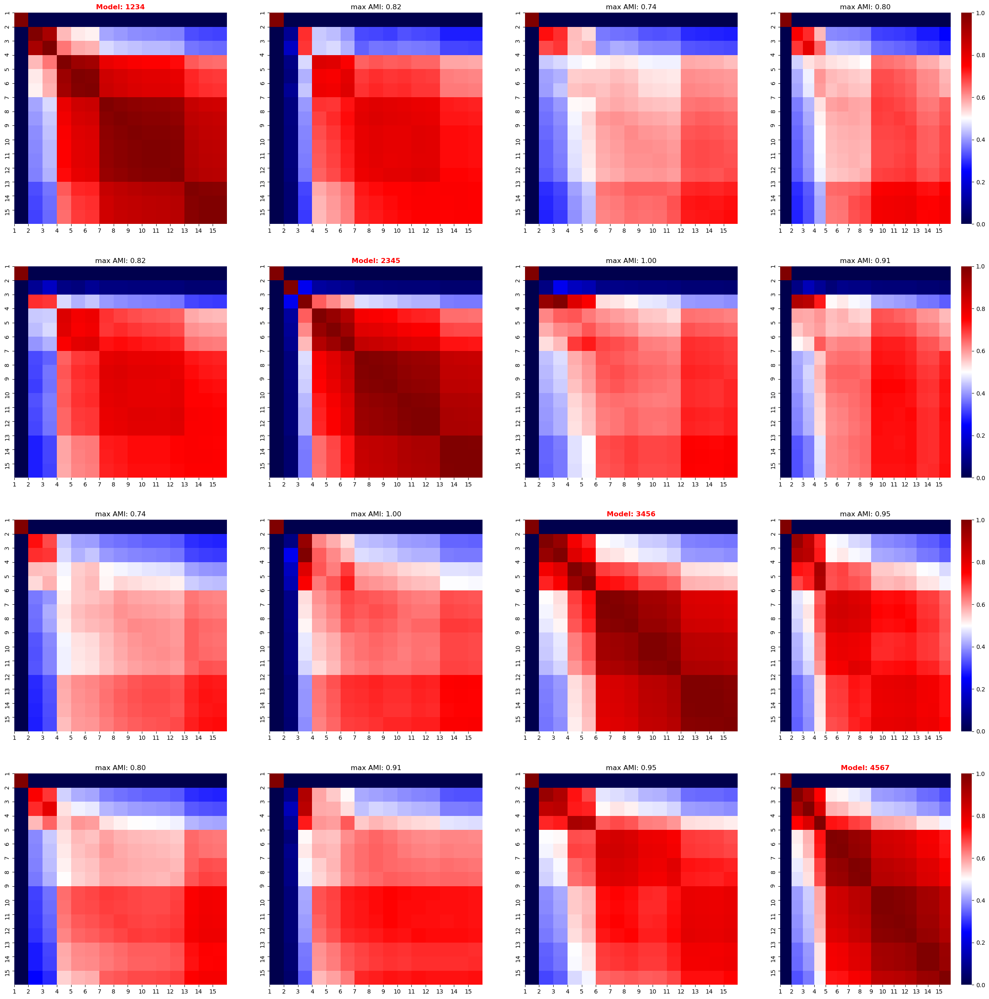

Latent dim: 64


 86%|████████▋ | 863/1000 [00:13<00:02, 62.29it/s]


Training stopped after 864 epochs
Best model found at epoch 662
------------------------------------------------------------
TRAIN loss: 0.024815352633595467
VAL loss: 0.033018674701452255
TEST loss: 0.06646186858415604


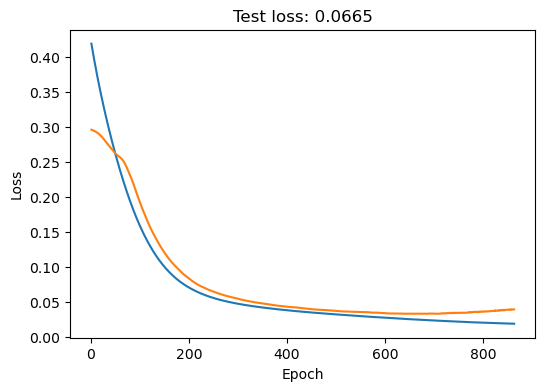

 74%|███████▍  | 744/1000 [00:11<00:03, 65.53it/s]


Training stopped after 745 epochs
Best model found at epoch 543
------------------------------------------------------------
TRAIN loss: 0.032484158873558044
VAL loss: 0.04495774209499359
TEST loss: 0.0502607598900795


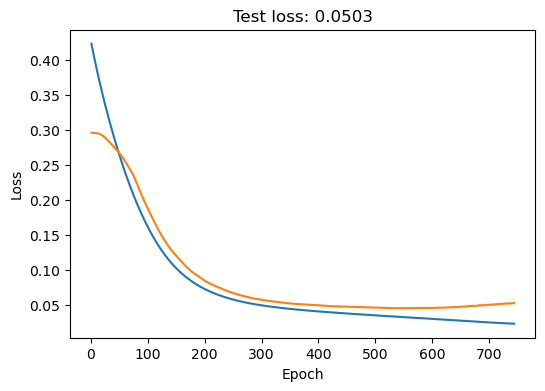

 74%|███████▍  | 738/1000 [00:11<00:04, 63.84it/s]


Training stopped after 739 epochs
Best model found at epoch 537
------------------------------------------------------------
TRAIN loss: 0.03225645050406456
VAL loss: 0.04543796554207802
TEST loss: 0.04100694879889488


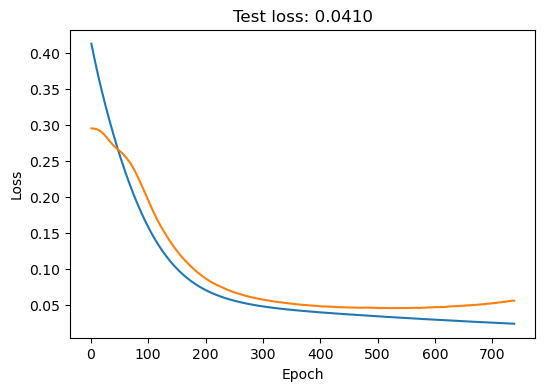

 68%|██████▊   | 682/1000 [00:10<00:04, 65.02it/s]


Training stopped after 683 epochs
Best model found at epoch 481
------------------------------------------------------------
TRAIN loss: 0.03405804932117462
VAL loss: 0.047527752816677094
TEST loss: 0.044764626771211624


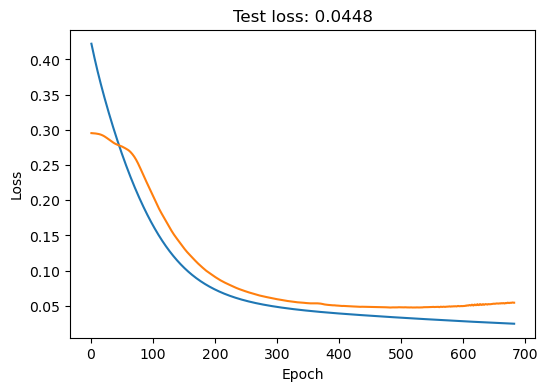

100%|██████████| 4/4 [00:02<00:00,  1.47it/s]


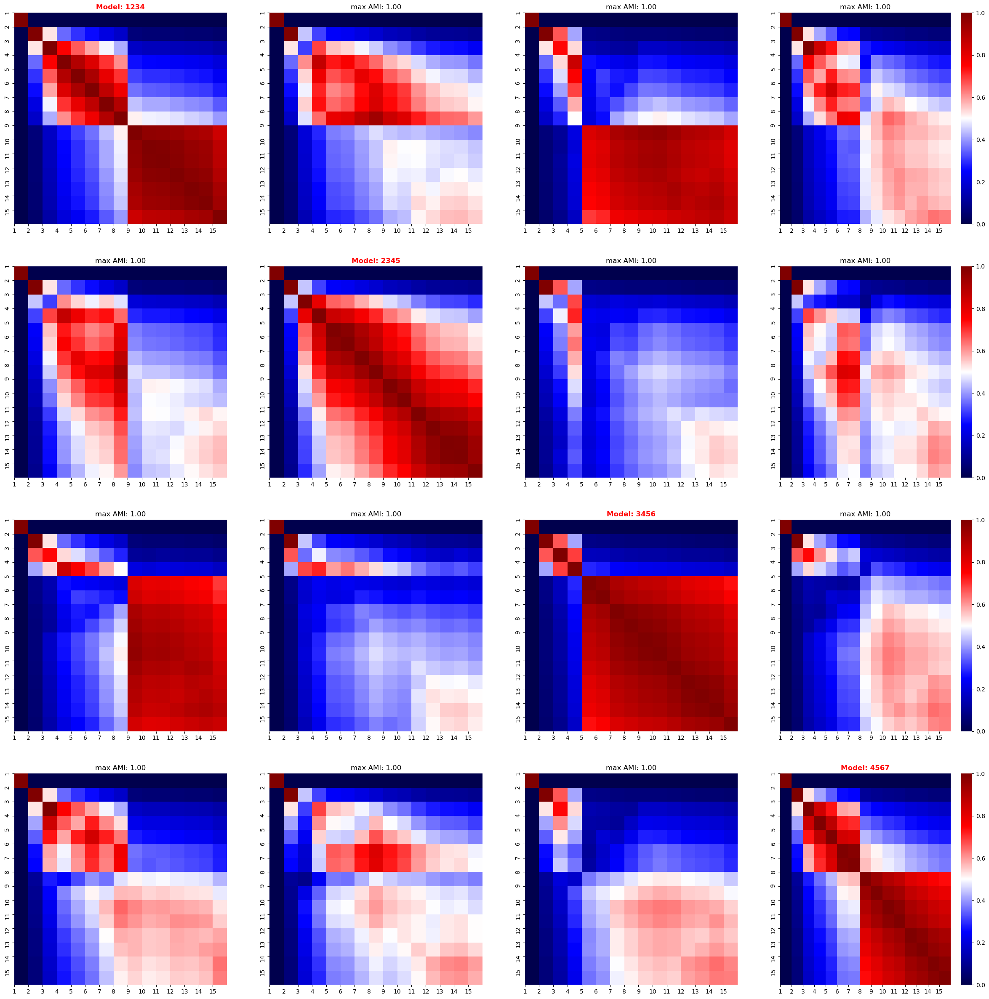

100%|██████████| 4/4 [00:02<00:00,  1.43it/s]


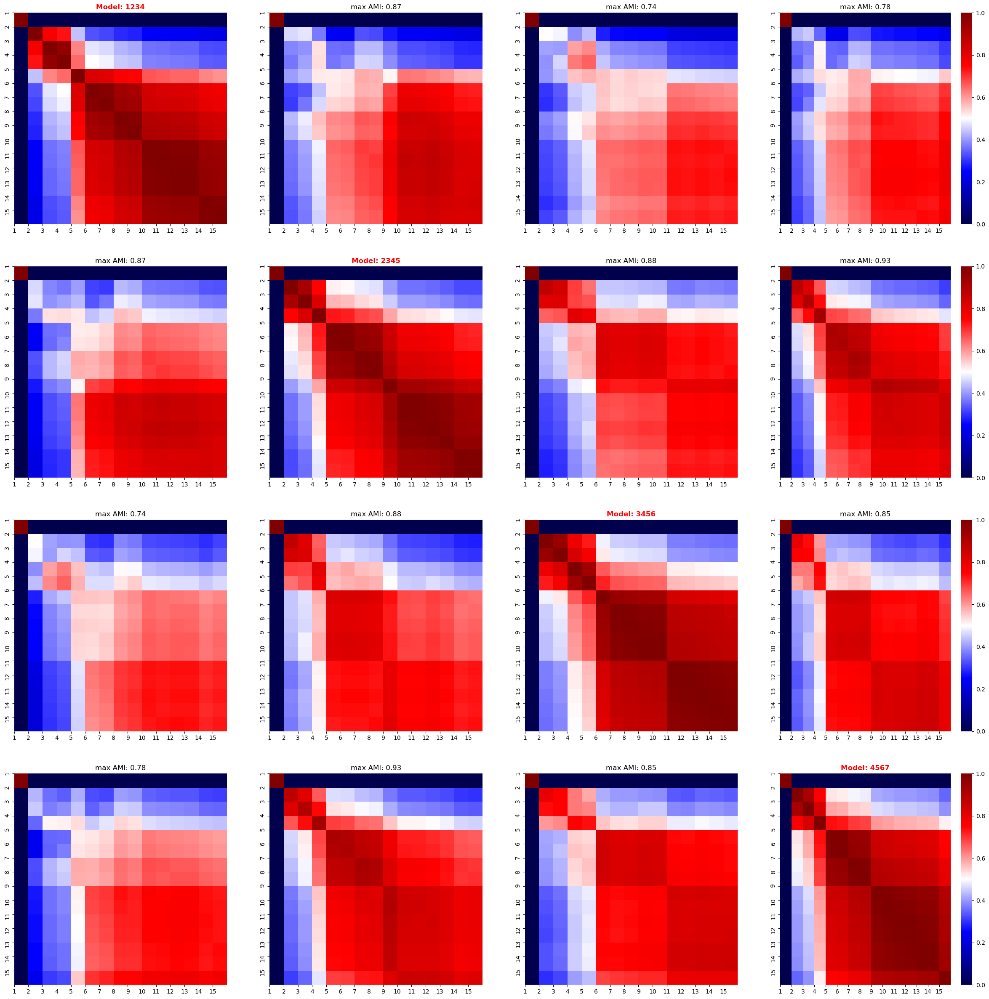

Latent dim: 128


 80%|███████▉  | 799/1000 [00:14<00:03, 55.82it/s]


Training stopped after 800 epochs
Best model found at epoch 598
------------------------------------------------------------
TRAIN loss: 0.02796587347984314
VAL loss: 0.040113408118486404
TEST loss: 0.05168572813272476


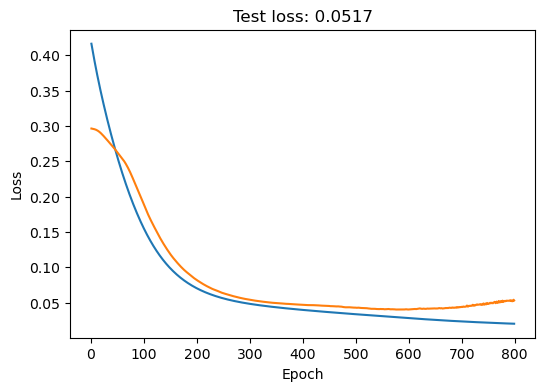

 70%|███████   | 704/1000 [00:12<00:05, 57.07it/s]

Training stopped after 705 epochs
Best model found at epoch 503
------------------------------------------------------------
TRAIN loss: 0.03140109404921532
VAL loss: 0.045481130480766296
TEST loss: 0.06885864585638046


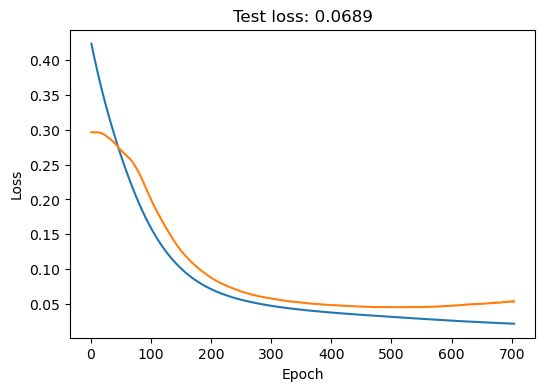

 68%|██████▊   | 684/1000 [00:11<00:05, 60.07it/s]


Training stopped after 685 epochs
Best model found at epoch 483
------------------------------------------------------------
TRAIN loss: 0.03256578370928764
VAL loss: 0.048222366720438004
TEST loss: 0.05494333431124687


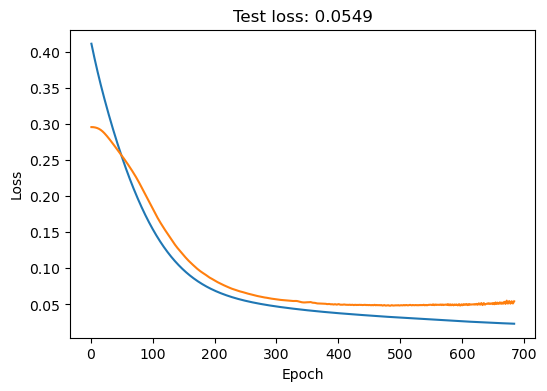

 74%|███████▍  | 742/1000 [00:12<00:04, 57.15it/s]


Training stopped after 743 epochs
Best model found at epoch 541
------------------------------------------------------------
TRAIN loss: 0.0288440752774477
VAL loss: 0.03959471359848976
TEST loss: 0.10179123282432556


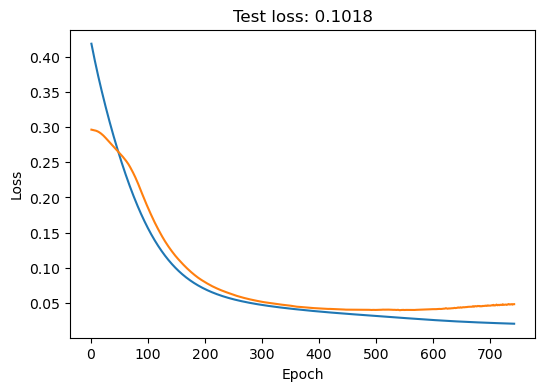

100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


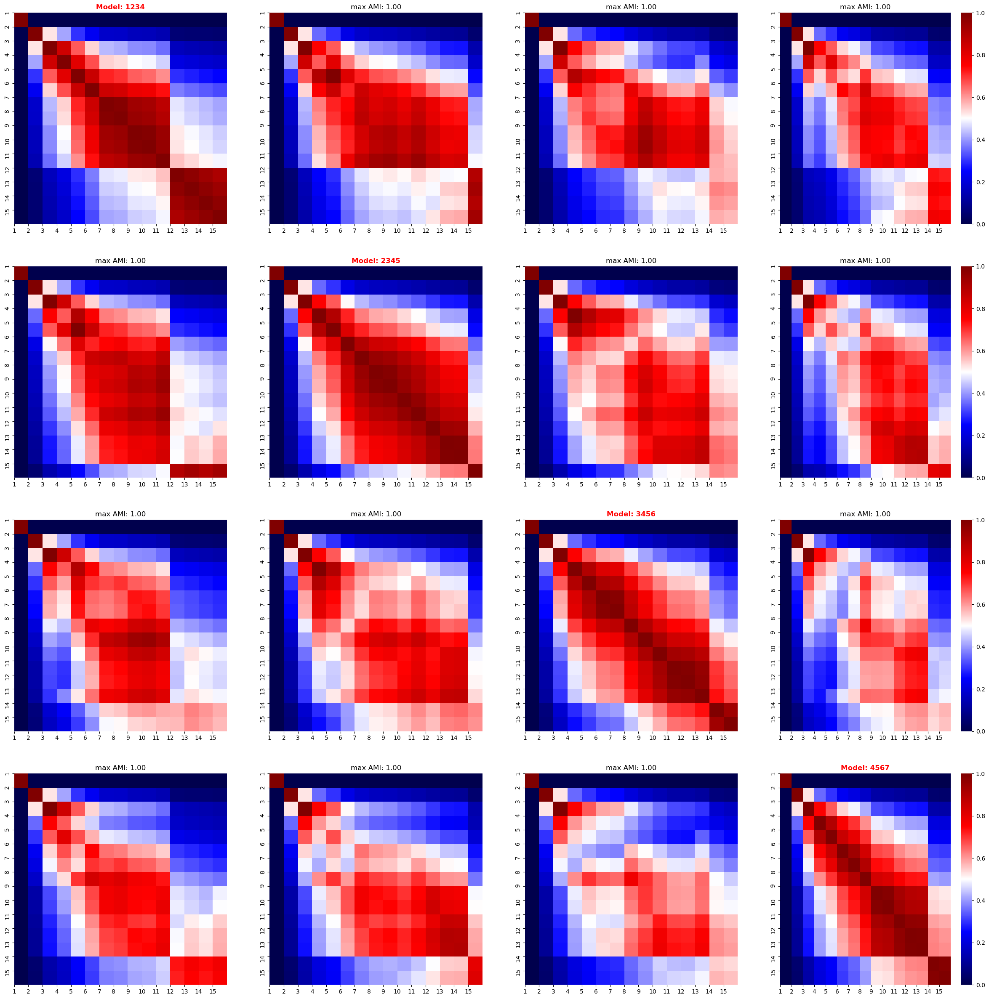

100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


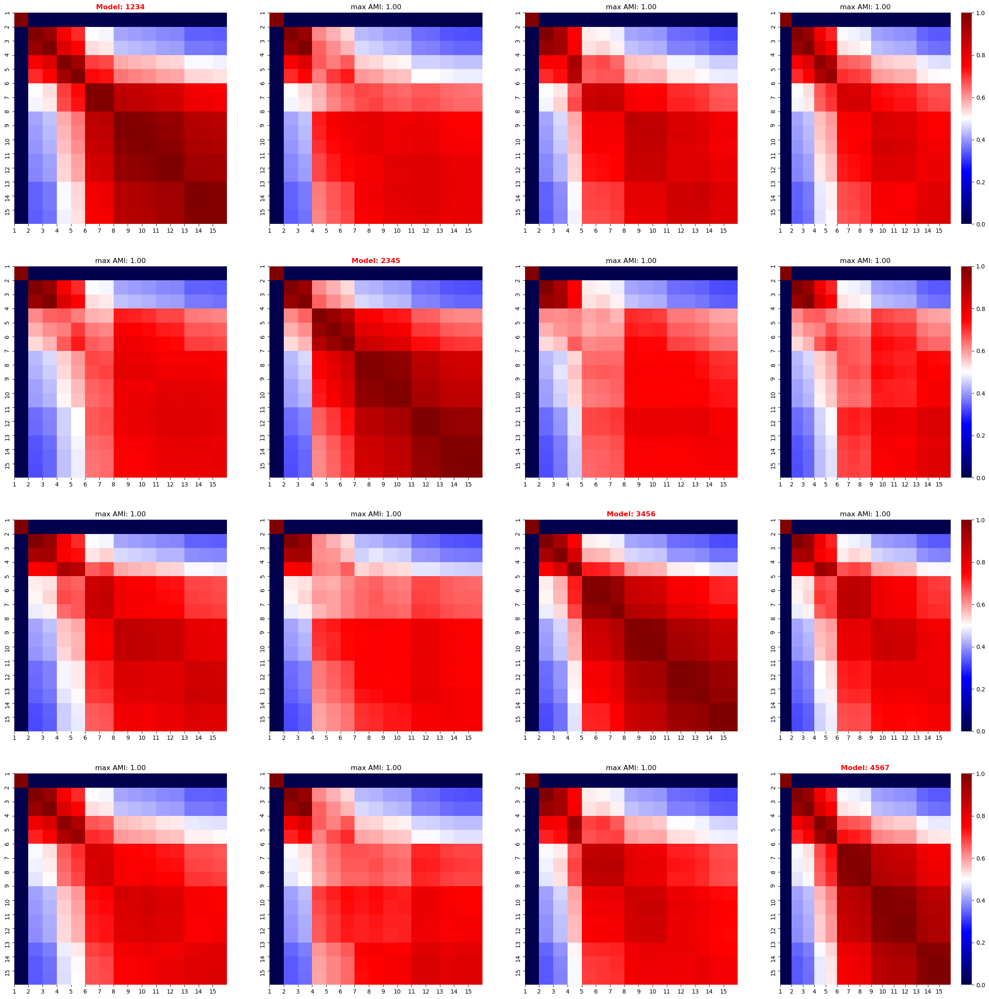

<IPython.core.display.Javascript object>

In [101]:
node_feature_key = "sc_gex_hallmark"

for latent_dim in latent_dims:
    print("Latent dim: {}".format(latent_dim))
    latents_dict_hallgexgae_feat_only = get_gae_latents_for_seed(
        graph_data=graph_data,
        data_dict=data_dict,
        seeds=seeds,
        node_feature_key=node_feature_key,
        input_dim=1176,
        latent_dim=latent_dim,
        hidden_dim=128,
        n_epochs=1000,
        lr=1e-5,
        link_pred=False,
        reconstruct_features=True,
        feature_decoder_params={
            "latent_dim": latent_dim,
            "output_dim": 1176,
            "hidden_dims": [256, 512, 1024],
        },
        feat_loss=torch.nn.MSELoss(),
        alpha=0,
        beta=1,
        plot_loss=True,
        early_stopping=200,
    )
    stability_amis_hallgexgae_feat_only = stability_cocluster_screen(
        latents_dict_hallgexgae_feat_only, linkage="average", affinity="cosine"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_feat_only)
    stability_amis_hallgexgae_feat_only = stability_cocluster_screen(
        latents_dict_hallgexgae_feat_only, linkage="average", affinity="euclidean"
    )
    plot_amis_matrices(seeds, stability_amis_hallgexgae_feat_only)

Compared to the solution that also penalizes the mismatch of the reconstructed adjacency matrix, we see that the embeddings are more dissimilar while still highly stable in general. That is especially for a small number of clusters we often see lower adjusted mutual information scores. As we increase the dimensionality those become more stable. However at a certain point the curse of dimensionality yields to less stable cluster solutions again.

---


### 3.2. Comparison of the inferred latent spaces

We will now compare the inferred latent spaces from the different model setups introduced in the previous section. To this end, we will again assess the co-clustering of the respective models. However, this time we will only consider one random initialization for each model. We will use 128 latent dimensions for the GAE models and 32 latent dimensions for the Node2Vec model as we previously have seen that these provide the most stable results for the respective models. 

100%|██████████| 100/100 [00:54<00:00,  1.84it/s]

Final loss: 0.9382940608947004


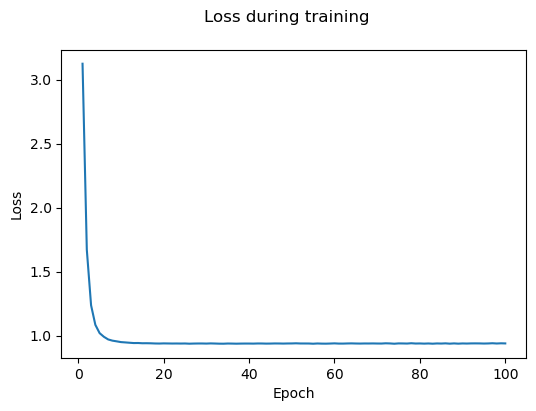

<IPython.core.display.Javascript object>

In [102]:
seed = 1234

# Since the last configuration was an embedding space of size 128, we can simply use the
# precomputed latents for those models
comp_latents_dict = {
    "gae_id": latents_dict_topogae[seed],
    "gae_hallmark": latents_dict_hallgae[seed],
    "gae_hallgex": latents_dict_hallgexgae[seed],
    "gae_hallgex_lp": latents_dict_hallgexgae_lp[seed],
    "gae_hallgex_feat": latents_dict_hallgexgae_feat[seed],
    "gae_hallgex_feat_only": latents_dict_hallgexgae_feat_only[seed],
}

# We quickly recompute the corresponding embeddings for the Node2Vec model
latents_dict_n2v = get_n2v_latents_for_seed(
    graph_data,
    [seed],
    latent_dim=32,
    walk_length=50,
    context_size=5,
    walks_per_node=20,
    batch_size=4,
    num_workers=4,
    lr=0.01,
    n_epochs=100,
    plot_loss=True,
)
comp_latents_dict["n2v"] = latents_dict_n2v[seed]

100%|██████████| 7/7 [00:05<00:00,  1.24it/s]


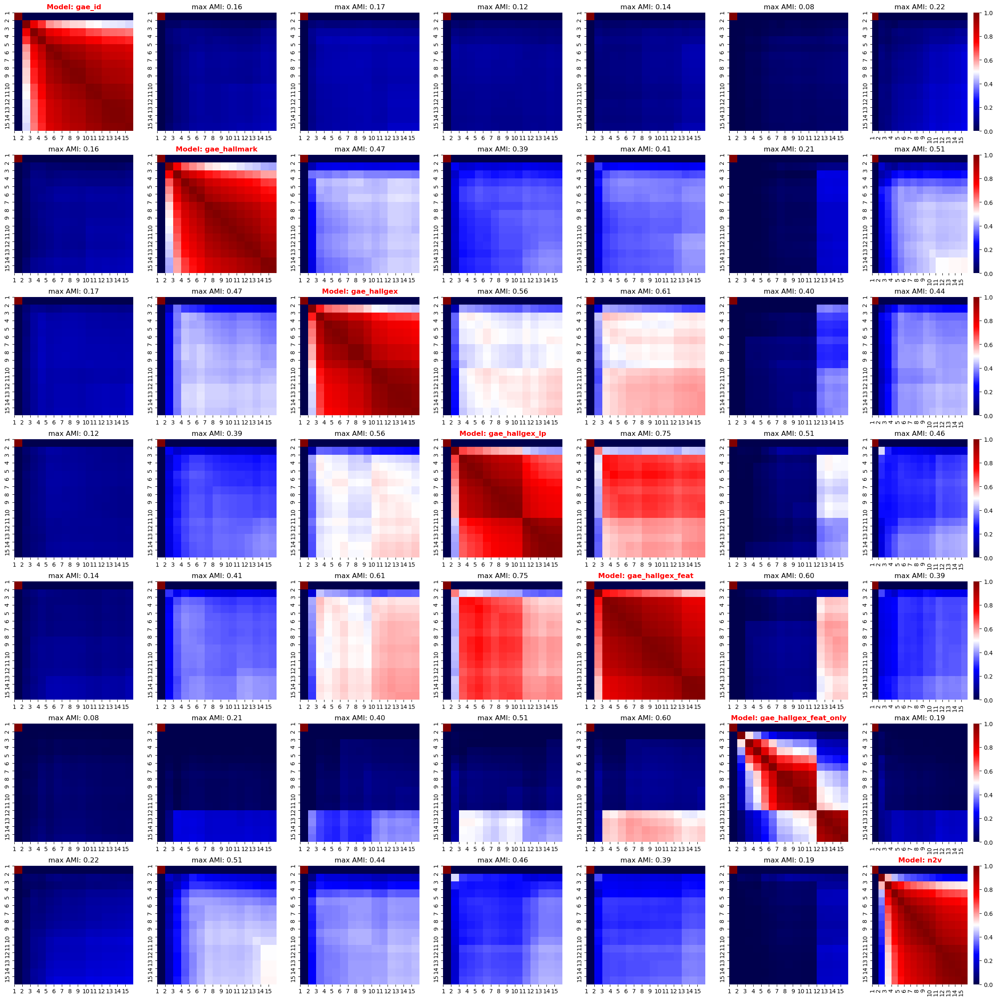

<IPython.core.display.Javascript object>

In [103]:
stability_amis_comparison = stability_cocluster_screen(
    comp_latents_dict, linkage="average", affinity="cosine"
)
plot_amis_matrices(list(comp_latents_dict.keys()), stability_amis_comparison)

100%|██████████| 7/7 [00:05<00:00,  1.20it/s]


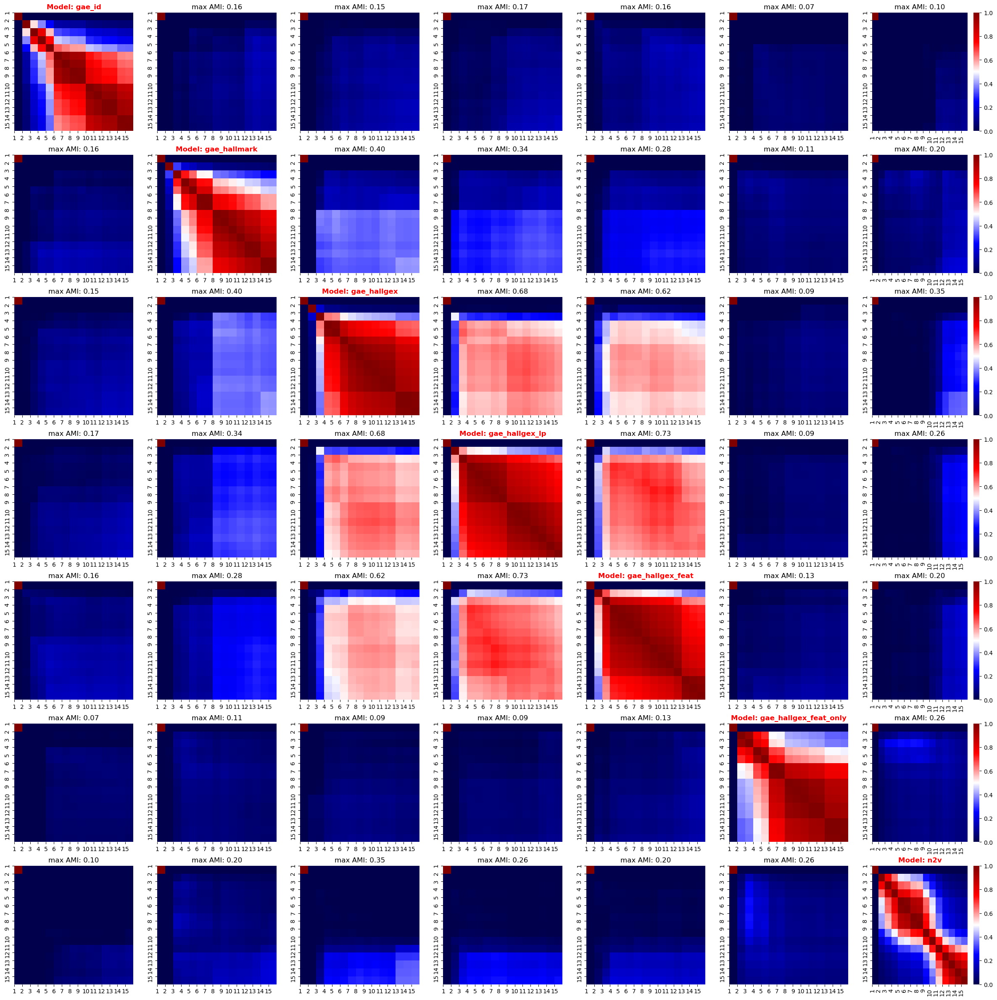

<IPython.core.display.Javascript object>

In [104]:
stability_amis_comparison = stability_cocluster_screen(
    comp_latents_dict, linkage="average", affinity="euclidean"
)
plot_amis_matrices(list(comp_latents_dict.keys()), stability_amis_comparison)

The plot above suggests that only the models that use the sc-RNAseq data as input features yield comparable latent spaces. The other models show only limited co-clustering especially for a low-number of clusters. Thus, we suggest to use the embeddings obtained from the GAE using the Hallmark geneset membership and the single-cell gene expression data as input trained without a data split but on the task of the reconstruction of both the feature matrix and the adjacency matrix. Note that this solution also yielded us the most stable embeddings as seen in the previous analyses.

---

### 3.3. Analyses of the inferred node embeddings

As discussed earlier, we will select the embeddings obtained from the previously described model as the final embeddings of the nodes in our network. We now will visualize and analyze the node embeddings with respect to their clustering to validate that e.g. genes which are known to function together co-cluster in the embedding space.

#### Visualization of the inferred latent space

In [27]:
latents = latents_dict_hallgexgae_feat[1234]

<IPython.core.display.Javascript object>

In [28]:
node_names = getattr(graph_data, "name")
cc_memberships = getattr(graph_data, "cell_cycle")
co_memberships = getattr(graph_data, "chromatin_org")
dr_memberships = getattr(graph_data, "dna_repair")
cd_memberships = getattr(graph_data, "cell_death")
cr_memberships = getattr(graph_data, "cytoskeleton_org")
tf_memberships = getattr(graph_data, "tf")
st_memberships = getattr(graph_data, "spec_target")

<IPython.core.display.Javascript object>

In [29]:
latents = pd.DataFrame(latents, index=node_names)

<IPython.core.display.Javascript object>

In [30]:
embs = TSNE(random_state=1234, perplexity=16).fit_transform(latents)
embs = pd.DataFrame(embs, columns=["tsne-0", "tsne-1"], index=node_names)
embs["cell_cycle"] = cc_memberships.cpu().numpy()
embs["chromatin_org"] = co_memberships.cpu().numpy()
embs["dna_repair"] = dr_memberships.cpu().numpy()
embs["cell_death"] = cd_memberships.cpu().numpy()
embs["cytoskeleton_org"] = cr_memberships.cpu().numpy()
embs["tfs"] = tf_memberships.cpu().numpy()
embs["spec_target"] = st_memberships.cpu().numpy()

/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


<IPython.core.display.Javascript object>

In [31]:
for node in list(embs.index):
    if node in list(train_network.nodes()):
        dataset_type = "train"
    elif node in (set(val_network.nodes()) - set(train_network.nodes())):
        dataset_type = "val"
    else:
        dataset_type = "test"
    embs.loc[node, "type"] = dataset_type

<IPython.core.display.Javascript object>

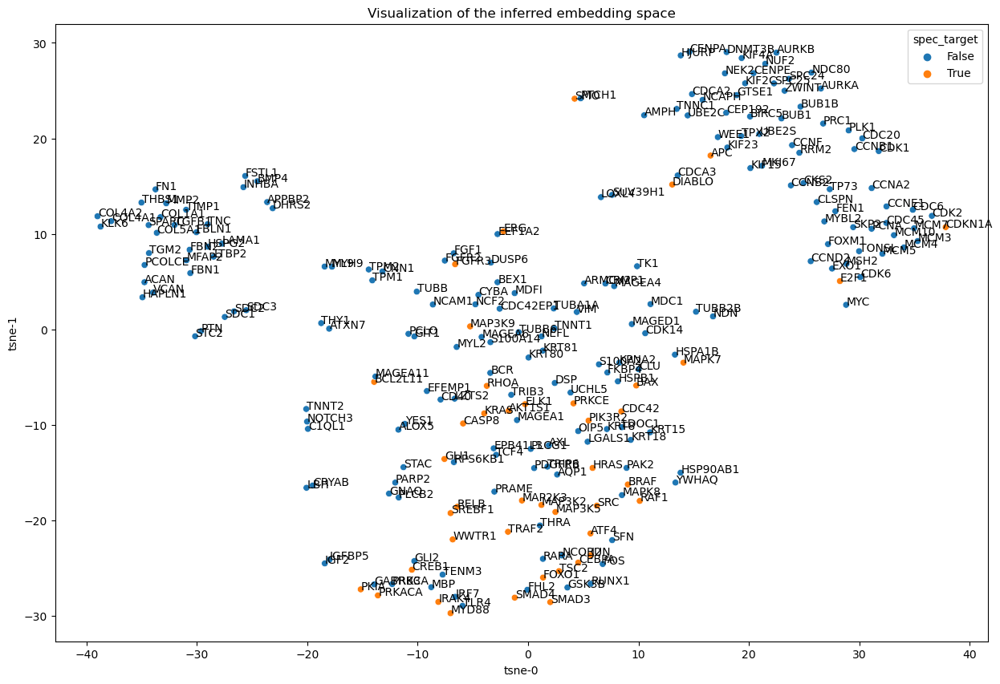

<IPython.core.display.Javascript object>

In [32]:
fig, ax = plt.subplots(figsize=[15, 10])
ax = sns.scatterplot(
    data=embs, x="tsne-0", y="tsne-1", cmap="viridis", hue="spec_target"
)
label_point(
    np.array(embs.loc[:, "tsne-0"]),
    np.array(embs.loc[:, "tsne-1"]),
    np.array(embs.index).astype("str"),
    ax=ax,
)
ax.set_title("Visualization of the inferred embedding space")
plt.show()

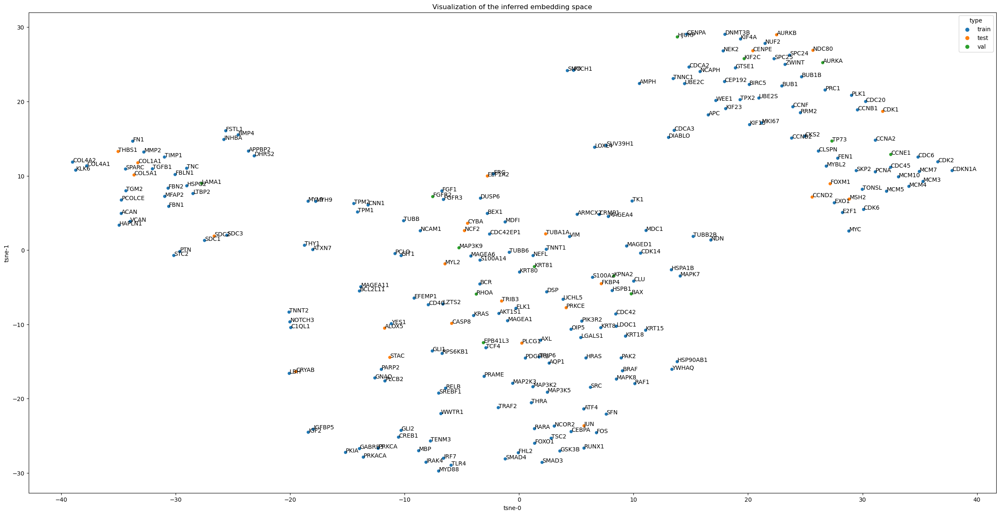

<IPython.core.display.Javascript object>

In [33]:
fig, ax = plt.subplots(figsize=[30, 15])
ax = sns.scatterplot(data=embs, x="tsne-0", y="tsne-1", cmap="viridis", hue="type")
label_point(
    np.array(embs.loc[:, "tsne-0"]),
    np.array(embs.loc[:, "tsne-1"]),
    np.array(embs.index).astype("str"),
    ax=ax,
)
ax.set_title("Visualization of the inferred embedding space")
plt.show()

#### Clustering of the embedding space

We will now perform a cluster analyses using hierarchical clustering based on the euclidean distances of the individual node embeddings and average linkage.

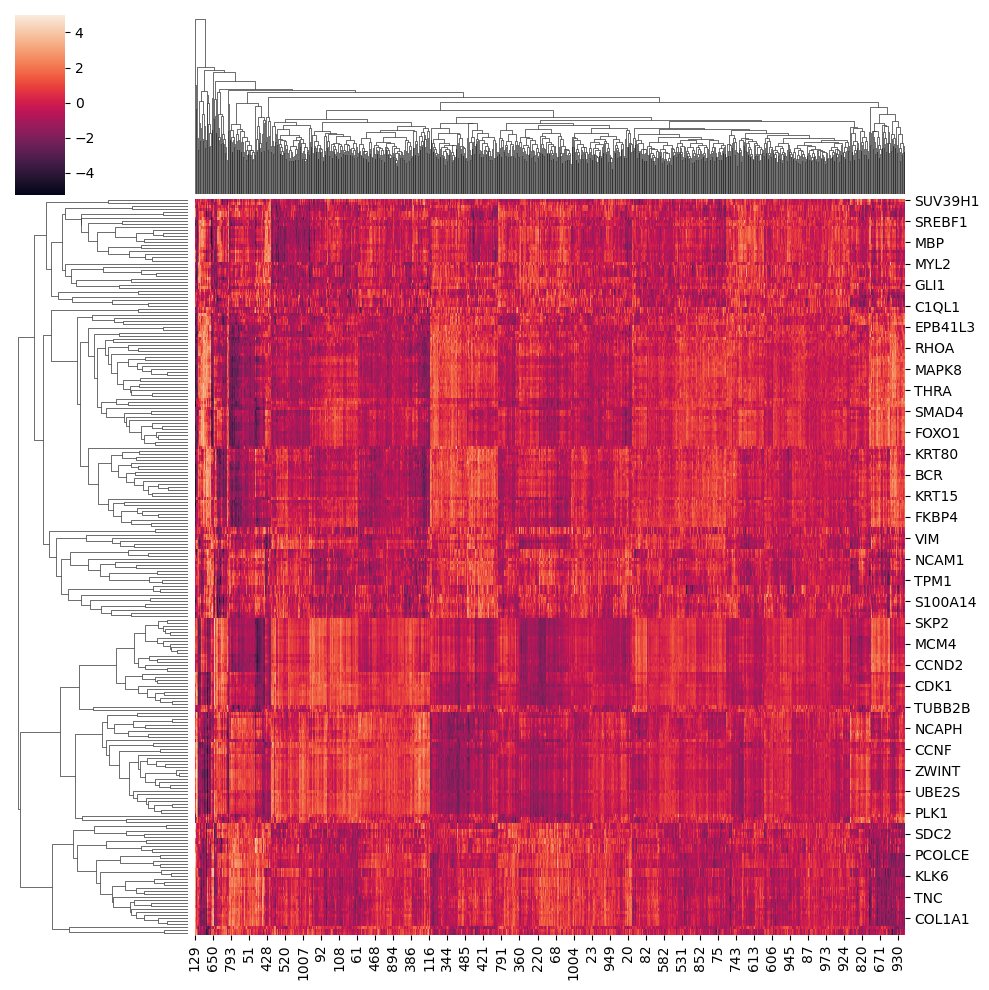

<IPython.core.display.Javascript object>

In [34]:
ax = sns.clustermap(
    latents,
    figsize=[10, 10],
    z_score=0,
    metric="euclidean",
    method="average",
)

To better understand the clustering of the latent space, we will run a agglomerative clustering analysis. To select the optimal number of clusters we look at a number of scores that have been proposed in the literature for a varying number of clusters. We set the range of clusters to 2-15 as in the previous study.

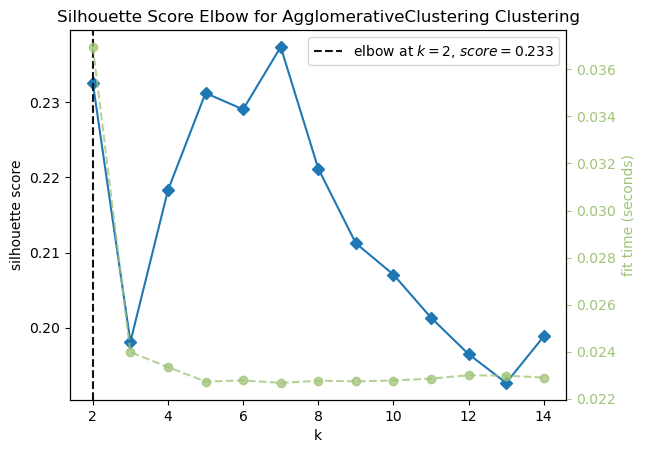

<IPython.core.display.Javascript object>

In [35]:
model = AgglomerativeClustering(linkage="average")
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="silhouette", timings=True, locate_elbow=True
)

visualizer.fit(latents)
ax = visualizer.show()

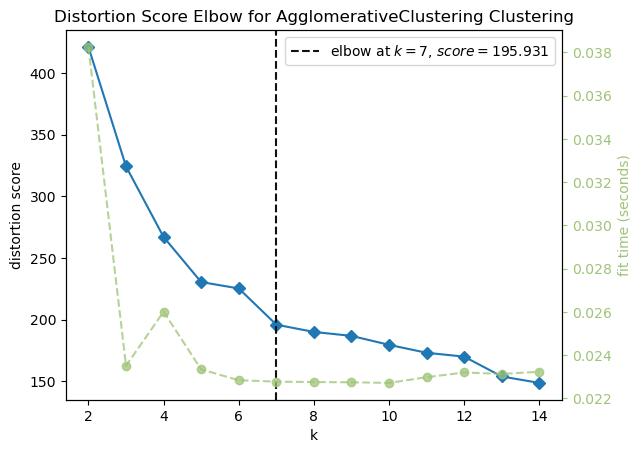

<IPython.core.display.Javascript object>

In [36]:
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="distortion", timings=True, locate_elbow=True
)

visualizer.fit(latents)
ax = visualizer.show()

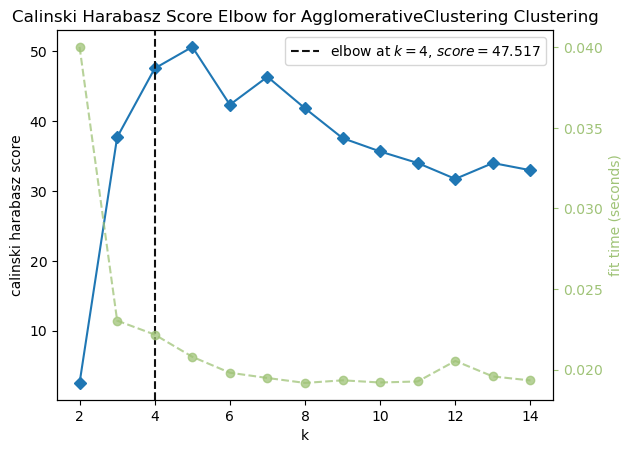

<IPython.core.display.Javascript object>

In [37]:
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="calinski_harabasz", timings=True, locate_elbow=True
)

visualizer.fit(latents)
ax = visualizer.show()

The support the impression from the previously plotted cluster map that shows to large clusters. Interestingly, the distortion score reaches its elbow at 8 clusters. We will assess these 8 clusters in more depth although these might slightly overcluster the embedding space.

In [116]:
print(list(spearman_interactome.nodes()))

['CDCA2', 'APPBP2', 'TK1', 'MMP2', 'PRKACA', 'CDC45', 'NOTCH3', 'SPARC', 'FBN1', 'FBLN1', 'RUNX1', 'SREBF1', 'STAC', 'TNNT1', 'GTSE1', 'TNNC1', 'YWHAQ', 'ERG', 'BIRC5', 'PRKCA', 'ACAN', 'CASP8', 'LZTS2', 'SPC25', 'MAPK7', 'S100A2', 'TUBB2B', 'CDC6', 'DHRS2', 'CEBPA', 'BEX1', 'UCHL5', 'HSPB1', 'WEE1', 'BMP4', 'PRAME', 'MYL2', 'SUV39H1', 'SDC2', 'TNC', 'DIABLO', 'DNMT3B', 'APC', 'TPM1', 'FKBP4', 'MAGEA6', 'LTBP2', 'CNN1', 'CLSPN', 'CRMP1', 'MCM4', 'GLI1', 'PKIA', 'CDKN1A', 'COL4A2', 'MAGEA1', 'MCM5', 'CDC42EP1', 'PCNA', 'JUN', 'NCF2', 'FOS', 'CD40', 'MAGED1', 'FBN2', 'MAP2K3', 'YES1', 'CDCA3', 'BCL2L11', 'AURKA', 'CCND2', 'MAP3K5', 'PRC1', 'TP73', 'CYBA', 'CDK14', 'TIMP1', 'TLR4', 'MAGEA4', 'PLCG1', 'CEP192', 'FOXM1', 'HRAS', 'KRT18', 'NCAPH', 'UBE2S', 'FN1', 'KPNA2', 'PTN', 'MYH9', 'HJURP', 'MAP3K9', 'LGALS1', 'FGFR2', 'CDC42', 'SMAD4', 'UBE2C', 'E2F1', 'BAX', 'CRYAB', 'PDGFRB', 'OIP5', 'VCAN', 'COL5A1', 'MDC1', 'CCNE1', 'ELK1', 'ZWINT', 'FOXO1', 'SRC', 'PCOLCE', 'FGF1', 'PIK3R2', 'AMPH

<IPython.core.display.Javascript object>

In [38]:
model = AgglomerativeClustering(n_clusters=7, linkage="average")
cluster_labels = model.fit_predict(latents)
cluster_dict = {}
for cluster_label in np.unique(cluster_labels):
    cluster_dict[cluster_label] = list(
        np.array(list(latents.index))[cluster_labels == cluster_label]
    )
for k, v in cluster_dict.items():
    print("Cluster {}: {}".format(k, sorted(v)))
    print("")

Cluster 0: ['ACAN', 'APPBP2', 'ATXN7', 'BMP4', 'CNN1', 'COL1A1', 'COL4A1', 'COL4A2', 'COL5A1', 'DHRS2', 'FBLN1', 'FBN1', 'FBN2', 'FN1', 'FSTL1', 'HAPLN1', 'HSPG2', 'INHBA', 'KLK6', 'LAMA1', 'LTBP2', 'MFAP2', 'MMP2', 'PCOLCE', 'SPARC', 'TGFB1', 'TGM2', 'THBS1', 'THY1', 'TIMP1', 'TNC', 'TPM1', 'TPM2', 'VCAN']

Cluster 1: ['CCNA2', 'CCND2', 'CCNE1', 'CDC45', 'CDC6', 'CDK2', 'CDK6', 'CDKN1A', 'E2F1', 'EXO1', 'FOXM1', 'MCM10', 'MCM3', 'MCM4', 'MCM5', 'MCM7', 'MSH2', 'MYC', 'NDN', 'PCNA', 'SKP2', 'TK1', 'TONSL', 'TUBB2B']

Cluster 2: ['AMPH', 'APC', 'AURKA', 'AURKB', 'BIRC5', 'BUB1', 'BUB1B', 'CCNB1', 'CCNB2', 'CCNF', 'CDC20', 'CDCA2', 'CDK1', 'CENPA', 'CENPE', 'CEP192', 'CKS2', 'CLSPN', 'DNMT3B', 'FEN1', 'GTSE1', 'HJURP', 'KIF15', 'KIF23', 'KIF2C', 'KIF4A', 'MKI67', 'MYBL2', 'NCAPH', 'NDC80', 'NEK2', 'NUF2', 'PLK1', 'PRC1', 'RRM2', 'SPC24', 'SPC25', 'TNNC1', 'TP73', 'TPX2', 'UBE2C', 'UBE2S', 'WEE1', 'ZWINT']

Cluster 3: ['KRT15']

Cluster 4: ['C1QL1', 'CREB1', 'CRYAB', 'GABRB3', 'GLI2', 'GN

<IPython.core.display.Javascript object>

Performing a statistical over-representation test using the node set of the derived interactome as the background gene set and correcting for multiple testing using the Benjamini-Hochberg method (cut-off at 0.05), we find the following enrichment of the biological processes according to the org.Hs.eg.db in the respective clusters (shown here are the top-3 annotations when ordered by the FDR):

2. ECM interactions
    * Extracellular matrix organization
    * Post-translational protein modification
    * Organitrogen compount catabolic process
1. N/A
    * Positive regulation of transcription (unspecific)
    * Positive regulation of neuron death (unspecific)
0. Cell cycle
    * Cell division
    * Mitotic sister chromatid segregation
    * Regulation of mitotic metaphase/anaphase transition
3. DNA repair
    * DNA-dependent DNA replication
    * G1/S transition of mitotic cell cycle
    * DNA repair
    

---

### 3.4. Data export

We will now save the inferred node embeddings for later analyses.

In [118]:
latents.to_csv(
    "../../../data/ppi/embedding/node_embeddings_cv_node_split_otherseed.csv"
)

<IPython.core.display.Javascript object>

---

## 4. Translational analyses

We will now look at the co-clustering of those embeddings with the ones we obtain for the imaging space.

### 4.1. Read in data

First, we read in the previously computed network embedding serving as a proxy for the regulatory space in U2OS cells as well as the respective image embeddings which we use to model the structural space of those cells. Since, we have many images corresponding to a single over-expression condition we will use their mean embeddings as a description of the structural profile in U2OS cells associated with the respective single-gene OE condition.

In [119]:
node_embs = pd.read_csv(
    "../../../data/ppi/embedding/node_embeddings_cv_node_split_otherseed.csv",
    index_col=0,
)

<IPython.core.display.Javascript object>

In [120]:
val_latents = pd.read_hdf(
    "../../../data/experiments/image_embeddings/specific_target_embs/resnet_ensemble_centercrops_newtargets_w_ctrl/val_latents.h5",
    index_col=0,
)
test_latents = pd.read_hdf(
    "../../../data/experiments/image_embeddings/specific_target_embs/resnet_ensemble_centercrops_newtargets_w_ctrl/test_latents.h5",
    index_col=0,
)
label_dict = {
    "AKT1S1": 0,
    "ATF2": 1,
    "ATF4": 2,
    "BAX": 3,
    "BCL2L11": 4,
    "BRAF": 5,
    "CASP8": 6,
    "CDC42": 7,
    "CDKN1A": 8,
    "CEBPA": 9,
    "CREB1": 10,
    "CXXC4": 11,
    "DIABLO": 12,
    "E2F1": 13,
    "EIF4EBP1": 14,
    "ELK1": 15,
    "EMPTY": 16,
    "ERG": 17,
    "HRAS": 18,
    "IKBKB": 19,
    "IRAK4": 20,
    "JUN": 21,
    "MAP2K3": 22,
    "MAP3K2": 23,
    "MAP3K5": 24,
    "MAP3K9": 25,
    "MAPK7": 26,
    "MKNK1": 27,
    "MYD88": 28,
    "PKIA": 29,
    "PRKACA": 30,
    "PRKCE": 31,
    "RAF1": 32,
    "RELB": 33,
    "RHOA": 34,
    "SDHA": 35,
    "SMAD4": 36,
    "SRC": 37,
    "SREBF1": 38,
    "STK3": 39,
    "TSC2": 40,
    "WWTR1": 41,
}
label_dict = {v: k for k, v in label_dict.items()}
img_embs = val_latents.append(test_latents)
img_embs.iloc[:, -1] = img_embs.iloc[:, -1].map(label_dict)
img_embs = img_embs.groupby(by="labels").mean()

<IPython.core.display.Javascript object>

---

### 4.2. Analyses of the structural space

To investigate the structural space we will run a similar analyses as in 3.3. First, we will visualize the embeddings using a tSNE plot. Second, we will run an clustering analysis to investigate the local structure of the space.

#### Visualization of the structural space

To visualize the structural space, we will plot the tSNE plot choosing a perplexitiy of 6 which is motivated by the power law for kNN, which is $perplexity \propto \sqrt(N)$.

In [121]:
struct_embs = TSNE(random_state=1234, perplexity=6).fit_transform(img_embs)
struct_embs = pd.DataFrame(
    struct_embs, columns=["tsne-0", "tsne-1"], index=img_embs.index
)

<IPython.core.display.Javascript object>

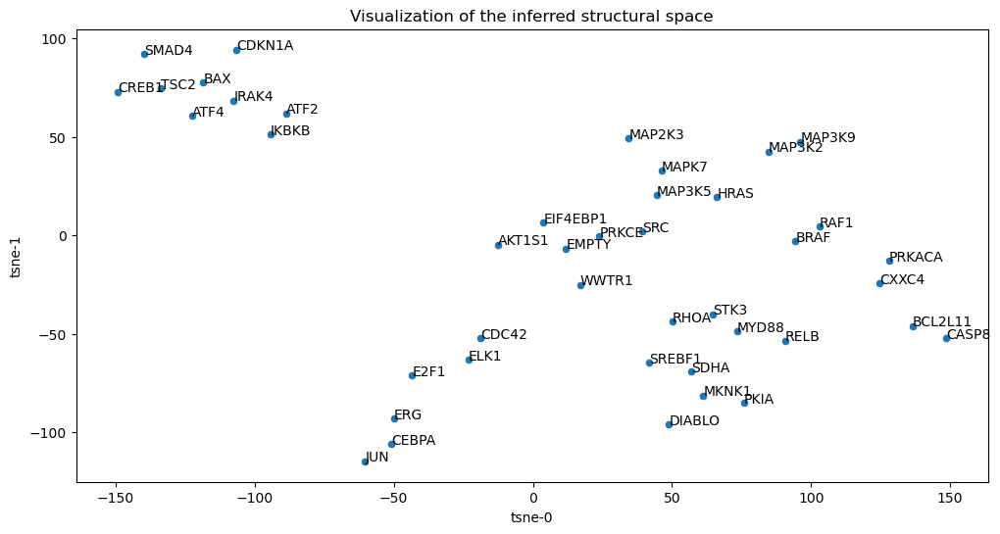

<IPython.core.display.Javascript object>

In [122]:
fig, ax = plt.subplots(figsize=[12, 6])
ax = sns.scatterplot(data=struct_embs, x="tsne-0", y="tsne-1", cmap="viridis")
label_point(
    np.array(struct_embs.loc[:, "tsne-0"]),
    np.array(struct_embs.loc[:, "tsne-1"]),
    np.array(struct_embs.index).astype("str"),
    ax=ax,
)
ax.set_title("Visualization of the inferred structural space")
plt.show()

---

#### Clustering of the structural space

To better understand the clustering of the latent space, we will again run a agglomerative clustering analysis. To select the optimal number of clusters we look at a number of scores that have been proposed in the literature for a varying number of clusters. We set the range of clusters to 2-15 as in the previous study.

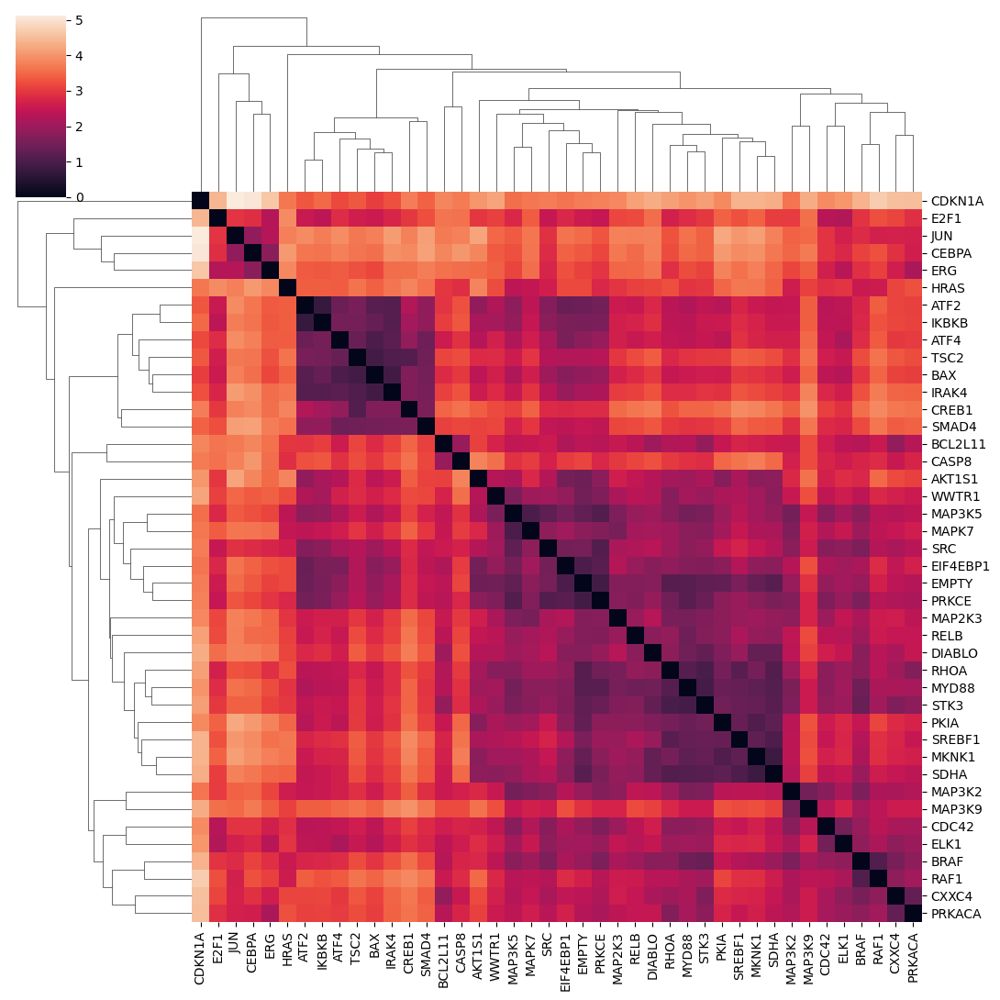

<IPython.core.display.Javascript object>

In [123]:
img_dist = pd.DataFrame(
    squareform(pdist(img_embs, metric="euclidean")),
    columns=list(img_embs.index),
    index=list(img_embs.index),
)
linkage = hc.linkage(sp.distance.squareform(img_dist), method="average")
ax = sns.clustermap(
    img_dist, row_linkage=linkage, col_linkage=linkage, figsize=[11, 11]
)

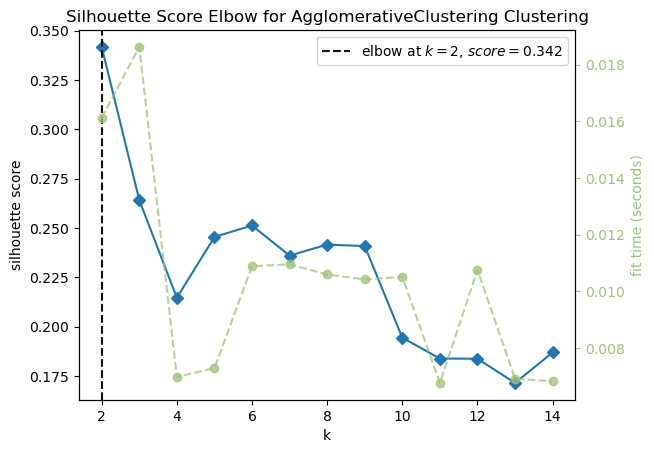

<IPython.core.display.Javascript object>

In [124]:
model = AgglomerativeClustering(linkage="average")
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="silhouette", timings=True, locate_elbow=True
)

visualizer.fit(img_embs)
ax = visualizer.show()

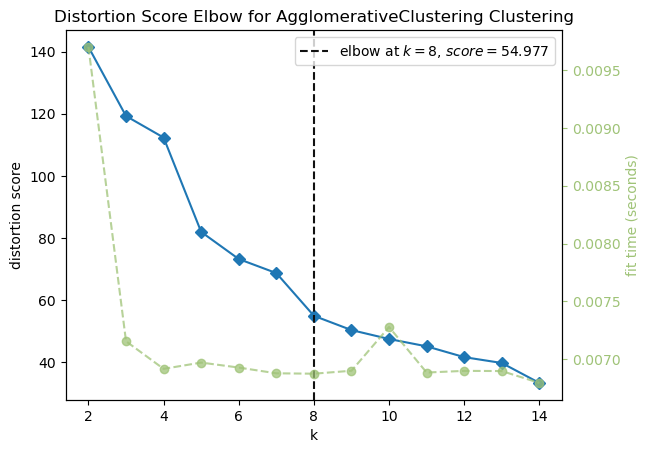

<IPython.core.display.Javascript object>

In [125]:
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="distortion", timings=True, locate_elbow=True
)

visualizer.fit(img_embs)
ax = visualizer.show()

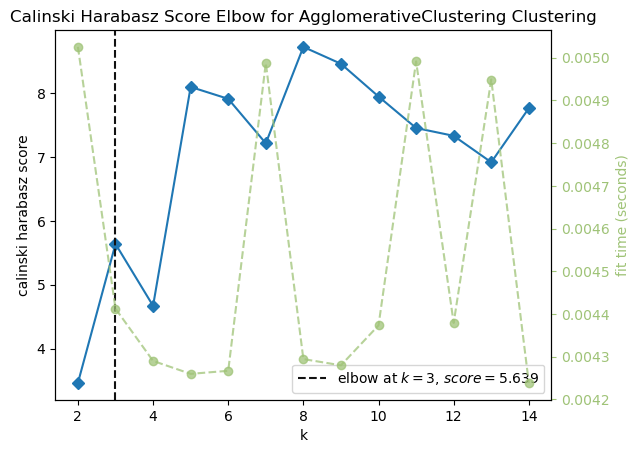

<IPython.core.display.Javascript object>

In [126]:
visualizer = KElbowVisualizer(
    model, k=(2, 15), metric="calinski_harabasz", timings=True, locate_elbow=True
)

visualizer.fit(img_embs)
ax = visualizer.show()

We see that depending on which score we look at the optimal number of clusters seem to be 2,3 or 8. We will choose 8 clusters although this is likely to overcluster the data.

In [127]:
model = AgglomerativeClustering(n_clusters=8, linkage="average")
cluster_labels = model.fit_predict(img_embs)
cluster_dict = {}
for cluster_label in np.unique(cluster_labels):
    cluster_dict[cluster_label] = list(
        np.array(list(img_embs.index))[cluster_labels == cluster_label]
    )
for k, v in cluster_dict.items():
    print("Cluster {}: {}".format(k, sorted(v)))
    print("")

Cluster 0: ['BRAF', 'CDC42', 'CXXC4', 'ELK1', 'MAP3K2', 'MAP3K9', 'PRKACA', 'RAF1']

Cluster 1: ['AKT1S1', 'DIABLO', 'EIF4EBP1', 'EMPTY', 'MAP2K3', 'MAP3K5', 'MAPK7', 'MKNK1', 'MYD88', 'PKIA', 'PRKCE', 'RELB', 'RHOA', 'SDHA', 'SRC', 'SREBF1', 'STK3', 'WWTR1']

Cluster 2: ['CEBPA', 'ERG', 'JUN']

Cluster 3: ['ATF2', 'ATF4', 'BAX', 'CREB1', 'IKBKB', 'IRAK4', 'SMAD4', 'TSC2']

Cluster 4: ['HRAS']

Cluster 5: ['BCL2L11', 'CASP8']

Cluster 6: ['E2F1']

Cluster 7: ['CDKN1A']



<IPython.core.display.Javascript object>

We see that the clustering includes three singeltons given by HRAS, CDKN1A and E2F1 a doublet of BCL2L11 and CASP8 (both yielding highly toxic effects) and a tripplet of the three transcription factors CEBPA, ERG and JUN.
However, we also find 3 bigger clusters, which we analyze using a GO analysis to functionally annotate those. Similar to our approach in 3.3. we will report the top-3 terms of the GO analysis for those clusters that reach an FDR < 0.05.

0. MAPK signaling & stress response (not significant)
    * BRAF, CDC42, CXXC4, ELK1, MAP3K2, MAP3K5, MAP3K9, PRKACA, RAF1


1. Intracellular signal transduction (not significant)
    * AKT1S1, DIABLO, EIF4EBP1, MAP2K3, MAP3K5, MAPK7, MKNK1, MYD88, PKIA, PRKCE, RELB, RHOA, SDHA, SRC, SREBF1, STK3, WWTR1


2. Regulation of cell death/response to organic substance (not significant)
    * ATF2, ATF4, BAX, CREB1, IKBKB, IRAK4, SMAD4, TSC2

---

### 4.3. Translation analysis

Next, we will assess the co-clustering of our inferred estimates of the structural and the regulatory space using a similar approach as described earlier to assess the structural similarity of the different network embeddings.

In [128]:
ami_img_node = compute_ami_matrix(
    img_embs.loc[shared_nodes],
    node_embs.loc[shared_nodes],
    affinity=["euclidean", "euclidean"],
    linkage="average",
)

<IPython.core.display.Javascript object>

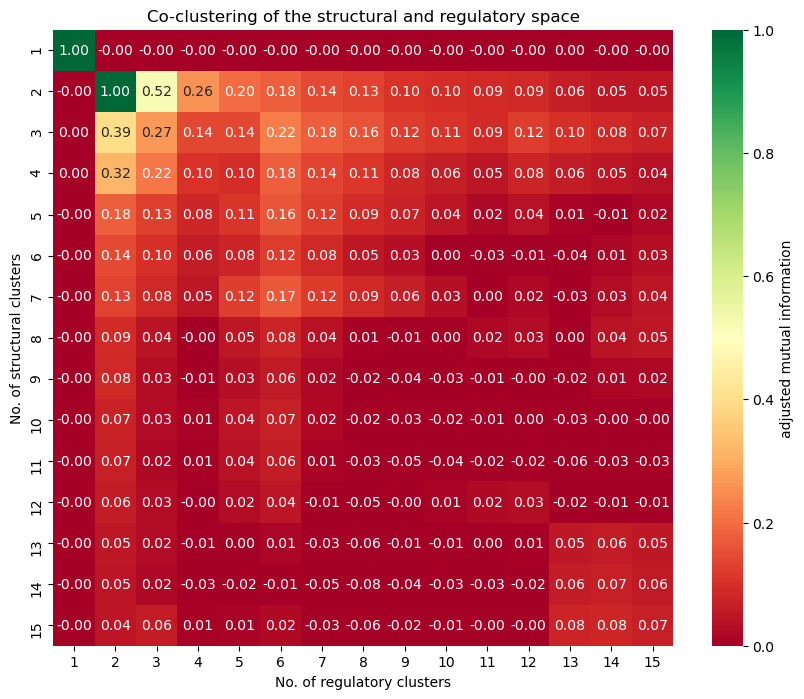

<IPython.core.display.Javascript object>

In [129]:
fig, ax = plt.subplots(figsize=[10, 8])
sns.heatmap(
    ami_img_node,
    cmap="RdYlGn",
    annot=True,
    fmt=".2f",
    ax=ax,
    vmin=0,
    vmax=1,
    cbar_kws={"label": "adjusted mutual information"},
)
ax.set_xticklabels([i + 1 for i in range(15)])
ax.set_yticklabels([i + 1 for i in range(15)])
ax.set_xlabel("No. of regulatory clusters")
ax.set_ylabel("No. of structural clusters")
ax.set_title("Co-clustering of the structural and regulatory space")
plt.show()

In [130]:
cmap_data = pd.read_csv(
    "/home/paysan_d/PycharmProjects/image2reg/data/gex/cmap/filtered_l5_data_u2os.csv",
    index_col=0,
)
cmap_data.head()
cmap_data = cmap_data.groupby("target").median()
cmap_data

,CAMSAP2,PPP2R5A,CISD1,AKAP8,TMEM109,CHAC1,FOS,ORC1,AARS,MLLT11,...,ABCF1,SERPINE1,HLA-DMA,STK10,BLCAP,ASCC3,KDELR2,HIST2H2BE,MELK,SMARCA4
target,,,,,,,,,,,,,,,,,,,,,
ACVR1B,-0.514450,-0.186800,0.089300,0.440700,0.544350,-0.197550,0.518350,-0.199150,-0.213800,0.193600,...,0.341800,0.620850,0.496700,-0.314250,0.189700,0.337900,0.194550,-0.508900,-0.109050,0.018700
ADAM17,0.254800,0.040200,-0.251950,-0.434400,0.077000,-0.014950,-0.036950,-1.055250,0.300150,0.283800,...,0.217550,-0.172350,-0.335450,-0.569100,-0.741500,0.278500,-0.040350,0.719400,-0.134250,0.859750
AKT1,-0.175300,-1.082100,-0.043300,-0.250000,0.034150,-0.339200,-0.249350,-0.014450,-0.505900,1.199350,...,-0.139850,0.502750,1.064050,-0.771200,0.342700,0.267700,-0.058550,-0.307500,-0.515300,0.360950
AKT1S1,-0.279350,-1.578925,-0.231600,0.484600,-0.066150,-0.453650,-0.468950,0.062200,-1.380075,-0.571250,...,-0.044450,1.642675,-0.222175,2.352925,-0.783325,0.478025,-0.321900,-0.508475,0.145675,1.385150
AKT2,-1.120450,0.011550,0.044450,1.121250,0.783850,-0.329950,-0.623600,-0.507700,-0.070500,1.409200,...,0.031650,1.131150,0.135300,1.086600,-0.540200,-0.258800,1.202250,-0.479050,0.251100,0.092850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VHL,-0.502725,-0.113050,-0.291275,-0.217225,0.385100,0.217425,1.646875,-0.902000,0.434925,-0.120350,...,0.002075,0.539775,0.200750,-0.185000,0.727400,0.230875,0.156575,-0.303300,0.091225,-0.333700
WWTR1,-1.703150,0.548250,-0.748500,0.202400,-0.669150,-0.449450,-0.785300,-0.334300,-0.990450,0.369600,...,-0.371200,-0.655400,0.337250,-0.421750,0.015400,0.365000,0.486250,-0.554250,0.632500,1.310250
XBP1,0.375625,-0.952575,0.676050,0.653825,-0.211475,-0.128275,0.201275,0.601525,0.375450,0.826475,...,-0.196100,-0.027050,-0.292575,0.332575,-0.223800,-0.703625,0.691350,0.388600,0.238750,-0.030825


<IPython.core.display.Javascript object>

In [131]:
ami_img_cmap = compute_ami_matrix(
    img_embs.loc[shared_nodes.intersection(cmap_data.index)],
    cmap_data.loc[shared_nodes.intersection(cmap_data.index)],
    linkage="average",
    affinity="euclidean",
)

<IPython.core.display.Javascript object>

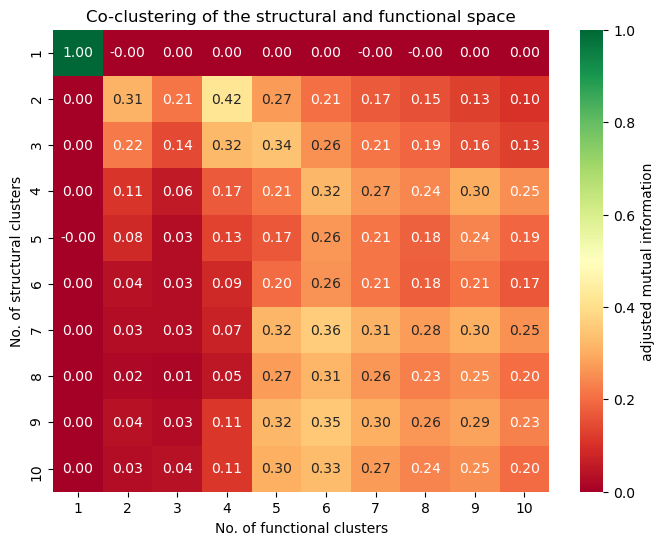

<IPython.core.display.Javascript object>

In [132]:
fig, ax = plt.subplots(figsize=[8, 6])
sns.heatmap(
    ami_img_cmap[:10, :10],
    cmap="RdYlGn",
    annot=True,
    fmt=".2f",
    ax=ax,
    vmin=0,
    vmax=1,
    cbar_kws={"label": "adjusted mutual information"},
)
ax.set_xticklabels([i + 1 for i in range(10)])
ax.set_yticklabels([i + 1 for i in range(10)])
ax.set_xlabel("No. of functional clusters")
ax.set_ylabel("No. of structural clusters")
ax.set_title("Co-clustering of the structural and functional space")
plt.show()

---

In [133]:
ami_node_cmap = compute_ami_matrix(
    node_embs.loc[shared_nodes.intersection(cmap_data.index)],
    cmap_data.loc[shared_nodes.intersection(cmap_data.index)],
)

<IPython.core.display.Javascript object>

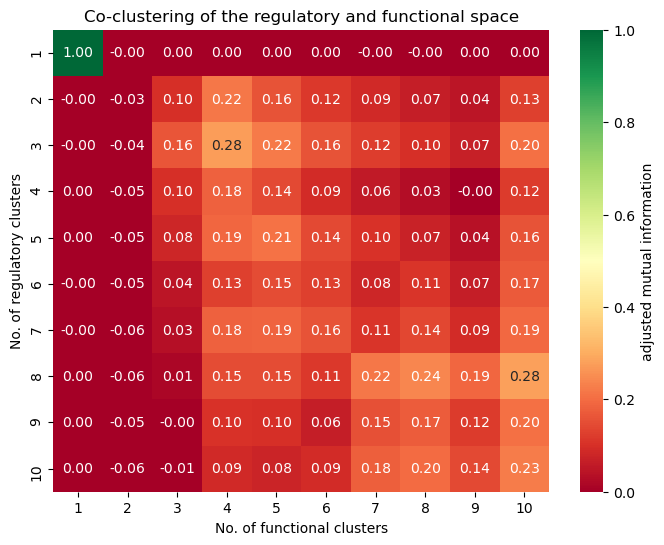

<IPython.core.display.Javascript object>

In [134]:
fig, ax = plt.subplots(figsize=[8, 6])
sns.heatmap(
    ami_node_cmap[:10, :10],
    cmap="RdYlGn",
    annot=True,
    fmt=".2f",
    ax=ax,
    vmin=0,
    vmax=1,
    cbar_kws={"label": "adjusted mutual information"},
)
ax.set_xticklabels([i + 1 for i in range(10)])
ax.set_yticklabels([i + 1 for i in range(10)])
ax.set_xlabel("No. of functional clusters")
ax.set_ylabel("No. of regulatory clusters")
ax.set_title("Co-clustering of the regulatory and functional space")
plt.show()